<a href="https://colab.research.google.com/github/austinwalker93/github-slideshow/blob/main/Forecasting_Political_Violence_MVP_(Zainab_Akhtar).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



---


# **MVP - Combining three Political Violence Forecasting Systems**

---



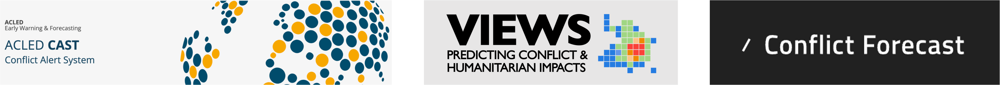

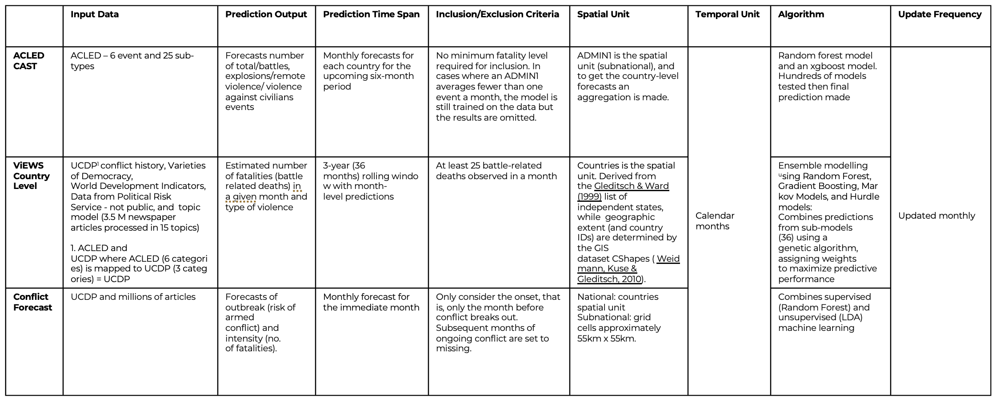

The MVP is divided into four high level steps:

**1) API Calls:** data is downloaded from 3 forecasting systems (ACLED CAST, ViEWS and Conflict Forecast) and 2 input sources (ACLED and UCDP).

**2) Admin 0 Mapping:** First GeoBoundaries is mapped to RAHDWH, then the three forecasting systems are mapped and aligned.

**3) Merging Datasets:** The three forecasting datasets from step 1 are merged together and mapped to GeoBoundaries/RAHDWH using the output of step 2.

**4) Visualization:** An initial map view with time slider is shown, where different open-source tools are explored.

**5) Case Evaluation:** The three forecasting system and 2 input data sources are compared for Mozambique, Palestine and Ukraine conflicts.

# Installations and Imports

In [2]:
!pip install requests

In [3]:
pip install gdown

In [4]:
import os
import requests
import pandas as pd
import geopandas as gpd
import ipywidgets as widgets
from IPython.display import display
from datetime import datetime
from shapely.geometry import Point, Polygon, box
import json
import pyproj
import plotly.express as px
from shapely import wkt
import gdown
from io import StringIO
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Configure Notebook
#for plots to be inline
%matplotlib inline
#for auto_complete
%config Completer.use_jedi = False

#hiding warnings
import warnings
warnings.filterwarnings('ignore')

# 1) API Calls

### 1.1 CAST


**country:** The name of the country

**admin1:** The	name	of	the	first-level	administrative	division

**month:** The month of events

**year:** The year of events

**total_forecast:** Total	number	of	events	forecasted

**battles_forecast:** Total number of battles events forecasted

**erv_forecast:** Total number of explosions/remote violence events
forecasted

**vac_forecast:** Total number of violence against civilians events
forecasted

**total_observed:** Total number of events observed. This column will be
populated once the given month has passed

**battles_observed:** Total number of battles events observed. This column
will be populated once the given month has passed

**erv_observed:** Total number of explosions/remote violence events
observed. This column will be populated once the
given month has passed

**vac_observed:** Total number of violence against civilians events
observed. This column will be populated once the
given month has passed

**timestamp:** The	unix	timestamp	(or	date	stamp)	this	data	entry	was last	updated

In [5]:
query_options = {
    1: ("country", "LIKE", "country"),
    2: ("admin1", "LIKE", "admin1"),
    3: ("month", "LIKE", "month"),
    4: ("year", "=", "year"),
}

In [6]:
def user_select_queries():
    print("Please select the queries you want to apply by typing the corresponding numbers, separated by commas:")
    for key, (name, _, _) in query_options.items():
        print(f"{key}: {name}")

    selections = input("Enter your selections: ").split(',')
    selected_queries = {int(sel.strip()): query_options[int(sel.strip())] for sel in selections if sel.strip().isdigit()}

    return selected_queries

In [7]:
def build_query_string(selected_queries):
    query_string = ""
    for _, (name, _, param) in selected_queries.items():
        value = input(f"Enter value for {name}: ")
        if value:
            query_string += f"&{param}={value}"
    return query_string

In [8]:
def make_request_and_print_dataframe(api_key, email, query_string):
    url = f"https://api.acleddata.com/cast/read?key={api_key}&email={email}{query_string}"
    print(url)
    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()
        if data.get('success'):
            df = pd.DataFrame(data['data'])
            current_time = datetime.now()
            df.to_csv(f"acled_data_download_{current_time.strftime('%Y_%m')}.csv", index=False)
            print(df)
        else:
            print(f"Error: {data.get('error')}")
    else:
        print(f"HTTP Error: {response.status_code}")

In [9]:
def main():
    # api_key = input("Please enter your API key: ")
    # email = input("Please enter your email address: ")
    # selected_queries = user_select_queries()
    # query_string = build_query_string(selected_queries)
    api_key="OcojFgHon56QHFtjOS9z"
    email="zakhtar@alumni.cmu.edu"

    make_request_and_print_dataframe(api_key, email,'')

# Run the main function
if __name__ == "__main__":
    main()

https://api.acleddata.com/cast/read?key=OcojFgHon56QHFtjOS9z&email=zakhtar@alumni.cmu.edu
     country      admin1      month  year total_forecast battles_forecast  \
0      Yemen      Raymah  September  2023              0                0   
1      Yemen      Raymah    October  2023              1                0   
2      Yemen      Raymah   November  2023              0                0   
3      Yemen      Raymah   December  2023              0                0   
4      Yemen      Raymah    January  2024              0                0   
...      ...         ...        ...   ...            ...              ...   
4995  Uganda  Bundibugyo      March  2023              0                0   
4996  Uganda  Bundibugyo      April  2023              0                0   
4997  Uganda  Bundibugyo        May  2023              0                0   
4998  Uganda  Bundibugyo       June  2023              0                0   
4999  Uganda  Bundibugyo       July  2023              0       

### 1.2 ViEWS


**run:** This specifys which run you would like to call. ex: 'fatalities001_2022_11_t01'

**loa (level of observation):** You can specify 'cm' for country-month OR 'pgm' for PRIO-grid-month

**tv (violence type):** You can specify 'sb' for state-based, 'ns' for non-state, or 'osv' for one-sided violence

**model:** If you want a specific model you can specify that here

[Codebook](https://api.viewsforecasting.org/fatalities002_2023_12_t01/codebook?_gl=1*eh1gg1*_ga*MjAzMjE3MTA4MS4xNzA2NTUxMDQ4*_ga_2RBJ67331Y*MTcwNzk1ODE4Mi43LjEuMTcwNzk1ODIzMy4wLjAuMA..*_ga_3LZY6T81Q7*MTcwNzk1ODE4Mi43LjEuMTcwNzk1ODIzMy4wLjAuMA)

[Github](https://github.com/prio-data/views_api/blob/master/Codebooks/fatalities002/codebook_fatalities002_forecasts.json)


**sc_cm_{tv}_main**: Predicted Number of Fatalities

Point prediction of the number of fatalities in impending conflict, presented per type of violence and level of analysis.

**sc_cm_{tv}_main_ln**: Predicted Log Number of Fatalities

Point prediction of the log number of fatalities in impending conflict, expressed in natural logged form plus 1 [ln(Y+1)].

**sc_cm_{tv}_dich_main**: Predicted Probability of Conflict

Predicted probability of at least 25 battle-related deaths (BRDs) per country-month, or at least 1 BRD per PRIO-GRID-month.

**sc_cm_{tv}_surrogate_ch_ln**: Predicted Log Fatalities Isolated Contribution from Conflict History Features

Predicted log fatalities given only the history of the respective type of violence.

**sc_cm_{tv}_surrogate_ch**: Predicted Fatalities, Isolated Contribution from Conflict History Features

Predicted fatalities given only the history of the respective type of violence.

**sc_cm_{tv}_surrogate_pop_ln**: Predicted Log Fatalities, Isolated Contribution from Population Size Feature:

Predicted log fatalities given only the population size in the country at hand.

**sc_cm_{tv}_surrogate_pop**: Predicted Fatalities, Isolated Contribution from Population Size Feature

Predicted fatalities given only the population size in the country at hand.

**sc_cm_{tv}_surrogate_imr_ln**: Predicted Log Fatalities, Isolated Contribution from Infant Mortality Rate

Predicted log fatalities given only the infant mortality rate in the country at hand.

**sc_cm_{tv}_surrogate_imr**: Predicted fatalities, isolated contribution from infant mortality rate

Predicted fatalities per type of violence and level of analysis, given only the infant mortality rate in the country.

**sc_cm_{tv}_surrogate_nch_ln**: Predicted log fatalities, isolated contribution from neighborhood conflict history

Predicted log fatalities per type of violence and level of analysis, given only the neighborhood conflict history in the country.

**sc_cm_{tv}_surrogate_nch**: Predicted fatalities, isolated contribution from neighborhood conflict history

Predicted fatalities per type of violence and level of analysis, given only the neighborhood conflict history in the country.

In [10]:
# Get latest Conflict prediction datasets as seen here: https://github.com/prio-data/views_api/wiki/Available-datasets
def fetch_runs(api_location: str) -> list:
    try:
        response = requests.get(f"{api_location}")
        response.raise_for_status()
        data = response.json()
        return data['runs']
    except requests.RequestException as e:
        print(f"Error fetching runs: {e}")
        return []


def find_latest_run(runs: list, pattern: str) -> str:
    filtered_runs = [run for run in runs if run.startswith(pattern)]
    if not filtered_runs:
        return "No matching runs found."
    latest_run = sorted(filtered_runs, reverse=True)[0]
    return latest_run


api_location = 'https://api.viewsforecasting.org/'
runs = fetch_runs(api_location)
pattern = 'fatalities002_2023_'
latest_run = find_latest_run(runs, pattern)
print('The latest run for pattern', pattern, 'is:', latest_run)

The latest run for pattern fatalities002_2023_ is: fatalities002_2023_12_t01


In [11]:
type_o = None
# Get level of observation
def get_user_selection_loa():
    global type_o
    # print("Please select the level of observation:")
    # print("1: Country-Month ('cm')")
    # print("2: PRIO-grid-Month ('pgm')")
    # selection = input("Enter your choice (1 or 2): ").strip()
    selection ="1"
    if selection == '1':
      type_o="cm"
      return 'cm'
    else:
      type_o = "pgm"
      return 'pgm'

loa = get_user_selection_loa()  # Level of observation
# latest_run="fatalities001_2022_00_t01"
VIEWS_URL = f'https://api.viewsforecasting.org/{latest_run}/{loa}/'
print(f'URL for the selected level of observation ({loa}): {VIEWS_URL}')

URL for the selected level of observation (cm): https://api.viewsforecasting.org/fatalities002_2023_12_t01/cm/


In [12]:
# Get Violence Type
vts= None
def get_user_selection_vt():
    global vts
    # print("Please select the Violence Type:")
    # print("1: State-Based ('sb')")
    # print("2: Non-State ('ns')")
    # print("3: One-Sided Violence ('osv')")
    # selection = input("Enter your choice (1 or 2 or 3): ").strip()
    selection = "1"
    if selection == '1':
      vts="sb"
      return 'sb'
    elif selection == '2':
      vts="ns"
      return 'ns'
    elif selection == '3':
      vts="osv"
      return 'osv'
    else:
      print("Invalid selection, defaulting to State-Based ('sb')")
      return 'sb'

vt = get_user_selection_vt()


# VIEWS_URL = VIEWS_URL + vt
# VIEWS_URL = "https://api.viewsforecasting.org/fatalities001_2022_00_t01/cm/sb"
print(f'URL for the selected violence type ({vt}): {VIEWS_URL}')

URL for the selected violence type (sb): https://api.viewsforecasting.org/fatalities002_2023_12_t01/cm/


In [13]:
def fetch_data_to_df(vts:str, type_o: str,base_url: str, page_size: int = 1000) -> pd.DataFrame:
    """
    Fetches paginated data from the given URL and returns it as a pandas DataFrame.

    Args:
    - base_url (str): The base URL to fetch data from.
    - page_size (int): The number of items to fetch per page.

    Returns:
    - pd.DataFrame: A DataFrame containing all fetched data.
    """
    req_url = f"{base_url}?pagesize={page_size}"

    master_list = []
    while req_url:
        r = requests.get(req_url)
        if r.status_code != 200:
            print(f"Failed to fetch data: {r.status_code}")
            return pd.DataFrame()  # Return an empty DataFrame in case of an error

        page_data = r.json()
        master_list += page_data['data']

        # Update req_url to fetch the next page, if any
        req_url = page_data.get('next_page', '')

    df = pd.DataFrame(master_list)
    current_time = datetime.now()
    df.to_csv(f"views_{type_o}_{vts}data_download_{current_time.strftime('%Y_%m')}.csv", index=False)
    return df

PAGE_SIZE = 1000

df = fetch_data_to_df(type_o, vts,VIEWS_URL, PAGE_SIZE)
display(df)

,country_id,month_id,name,gwcode,isoab,year,month,main_mean,surrogate_mean_ch_ln,surrogate_mean_dem,surrogate_mean_pop,surrogate_mean_imr_ln,surrogate_mean_imr,surrogate_mean_dem_ln,surrogate_mean_nch,surrogate_mean_nch_ln,main_dich,main_mean_ln,surrogate_mean_pop_ln,surrogate_mean_ch
0,1,529,Guyana,110,GUY,2024,1,0.0187,0.0820,1.0346,0.1312,0.5663,0.7618,0.7103,1.5106,0.9205,0.0027,0.0185,0.1233,0.0855
1,2,529,Suriname,115,SUR,2024,1,0.0130,0.0820,0.1660,0.1247,0.4249,0.5295,0.1536,0.2961,0.2594,0.0027,0.0129,0.1175,0.0855
2,3,529,Trinidad and Tobago,52,TTO,2024,1,0.0134,0.0820,0.1596,0.1561,0.4091,0.5054,0.1481,0.1070,0.1017,0.0027,0.0133,0.1450,0.0855
3,4,529,Venezuela,101,VEN,2024,1,2.6475,1.4534,1.7123,1.3345,0.5297,0.6983,0.9978,1.6977,0.9924,0.0280,1.2940,0.8478,3.2778
4,5,529,Samoa,990,WSM,2024,1,0.0307,0.0820,0.2664,0.1113,0.4050,0.4993,0.2362,0.1070,0.1017,0.0028,0.0302,0.1055,0.0855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6871,242,564,Tanzania,510,TZA,2026,12,1.1897,0.2346,1.6543,4.4237,0.8930,1.4423,0.9762,15.4202,2.7985,0.0194,0.7838,1.6908,0.2644
6872,243,564,Morocco,600,MAR,2026,12,0.6489,0.2346,2.3803,2.2725,0.5729,0.7734,1.2180,0.8574,0.6192,0.0131,0.5001,1.1856,0.2644
6873,244,564,Mauritania,435,MRT,2026,12,0.8879,0.2346,3.2166,0.4292,0.8611,1.3658,1.4390,2.6039,1.2820,0.0158,0.6354,0.3571,0.2644
6874,245,564,Sudan,625,SDN,2026,12,182.5004,4.0343,2.7546,2.9175,0.9805,1.6659,1.3230,16.0731,2.8375,0.9120,5.2122,1.3655,55.5012


### 1.3 Conflict Forecast


https://conflictforecast.org/downloads: This endpoint provides the latest files uploaded, with the public URL's to retrieve the files in csv format.

*   Armed Conflict - 3 months ahead
*   Armed Conflict - 12 months ahead
*   Any Violence - 3 months ahead (a month with any fatalities)
*   Any Violence - 12 months ahead (a month with any fatalities)
*   Violence Intensity - 3 months ahead
*  Violence Intensity - 12 months ahead
*  Grid Risk
*  Codebook


**Armed Conflict:** The risk that a country suffers an outbreak of **armed conflict** within the next 3/12 months, i.e. that the country goes from no fatalities to over five fatalities per one million inhabitants within a time horizon of 3/12 months.


**Violence:** The risk that a country suffers an outbreak of **violence** within the next 3/12 months, i.e. that the country goes from no fatalities to any positive number of fatalities within a time horizon of 3/12 months.

**Intensity of violence:** measured in fatalities, in the next 3/12 months. The measure of fatalities follows the UCDP/GED definition. Technical note: Our predictions target ln(fatalites per capita +1) per month in the next three months. For ease of interpretation we transform our forecasts back into fatality numbers using the latest population numbers.

**To align with UCDP:**
State-based and Non-state based conflict == Armed Conflict?
The One-Sided Violence == Violence.

**Note:** First two are risk and last is intensity.

**Note:** Every point in the figures is a past forecast which uses the information available at that time. For example, the forecast in August 2015 uses the information available in August 2015 to predict the likelihood of an outbreak of armed conflict 3 months ahead (in September 2015 to November 2015 in the example)."

In [14]:
def choose_file(df):
    # # Display the available file names to the user
    # print("Available files:")
    # for i, row in df.iterrows():
    #     print(f"{i}: {row['name']}")

    # # Ask the user to choose a file
    # file_index = input("Enter the number of the file you want to download: ")
    file_index=0 #any violence 12 months
    try:
        selected_file = df.iloc[int(file_index)]
        return selected_file
    except (IndexError, ValueError):
        print("Invalid selection.")
        return None


def download_and_display_csv(selected_file):
    if selected_file is not None:
        csv_url = selected_file['publicUrl']
        response = requests.get(csv_url)
        if response.status_code == 200:
            df = pd.read_csv(StringIO(response.text))
            current_time = datetime.now()
            df.to_csv(f"conflictforecast_data_download_{current_time.strftime('%Y_%m')}.csv", index=False)
            display(df)
        else:
            print(f"Failed to download the file, status code: {response.status_code}")

In [15]:
# API endpoint
# url = "https://api.backendless.com/C177D0DC-B3D5-818C-FF1E-1CC11BC69600/C5F2917E-C2F6-4F7D-9063-69555274134E/services/fileService/get-latest-file-listing"
url = "https://api.backendless.com/C177D0DC-B3D5-818C-FF1E-1CC11BC69600/C5F2917E-C2F6-4F7D-9063-69555274134E/services/fileService/get-file-listing?date=01-2024"
response = requests.get(url)


if response.status_code == 200:
    data = response.json()
    df = pd.DataFrame(data)
    selected_file = choose_file(df)
    download_and_display_csv(selected_file)
    print(df)
else:
    print(f"Failed to retrieve data, status code: {response.status_code}")

,isocode,year,month,text_model,best_model,topic0,topic1,topic2,topic3,topic4,...,populationwb,lnbest_pc,lnbest_pc_3,lnbest_pc_12,anyviolence_dp,armedconf_dp,ons_anyviolence3,ons_armedconf3,ons_anyviolence12,ons_armedconf12
0,AFG,2010,1,50.103233,88.682137,13.307489,9.74814,6.78916,5.055100,1.48776,...,29185507,0.011718,0.016380,0.020671,0.0,0.0,NaN,NaN,NaN,NaN
1,AFG,2010,2,53.438084,87.937805,14.204110,8.29584,7.96997,3.349240,1.41425,...,29185507,0.018199,0.015998,0.020391,0.0,0.0,NaN,NaN,NaN,NaN
2,AFG,2010,3,54.954021,88.027069,13.035239,11.02637,7.28346,3.486950,1.57155,...,29185507,0.013849,0.022652,0.020467,0.0,0.0,NaN,NaN,NaN,NaN
3,AFG,2010,4,52.374439,88.538155,13.028100,7.83449,6.91218,4.176120,2.21526,...,29185507,0.017088,0.025418,0.020559,0.0,0.0,NaN,NaN,NaN,NaN
4,AFG,2010,5,51.453579,87.295013,13.849380,9.50947,5.61225,1.818210,1.82799,...,29185507,0.017054,0.029640,0.021136,0.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28855,ZWE,2023,9,28.802883,23.281202,10.993530,3.15493,1.27638,37.994110,2.39329,...,14645468,0.000000,0.000023,0.000017,36.0,179.0,1.0,0.0,1.0,0.0
28856,ZWE,2023,10,29.685497,22.917118,11.038470,0.97163,1.39420,17.129360,5.66301,...,14645468,0.000000,0.000023,0.000023,37.0,180.0,1.0,0.0,1.0,0.0
28857,ZWE,2023,11,30.298492,57.525700,9.585510,1.57673,1.48706,12.798651,7.17694,...,14645468,0.000068,0.000000,0.000000,0.0,181.0,NaN,0.0,NaN,0.0
28858,ZWE,2023,12,30.478134,58.368130,5.094160,0.82923,1.67338,10.703090,12.02667,...,14645468,0.000000,0.000000,0.000000,1.0,182.0,0.0,0.0,0.0,0.0


      size                                 name  \
0  6787072  conflictforecast_anyviolence_12.csv   
1  6795264   conflictforecast_anyviolence_3.csv   
2  6557696    conflictforecast_armedconf_12.csv   
3  6565888     conflictforecast_armedconf_3.csv   
4  4124672       conflictforecast_grid_risk.csv   
5  6574080    conflictforecast_lnbest_pc_12.csv   
6  6582272     conflictforecast_lnbest_pc_3.csv   

                                           publicUrl      updatedOn  \
0  https://backendlessappcontent.com/C177D0DC-B3D...  1708684384159   
1  https://backendlessappcontent.com/C177D0DC-B3D...  1708684385269   
2  https://backendlessappcontent.com/C177D0DC-B3D...  1708684381029   
3  https://backendlessappcontent.com/C177D0DC-B3D...  1708684383153   
4  https://backendlessappcontent.com/C177D0DC-B3D...  1709733702340   
5  https://backendlessappcontent.com/C177D0DC-B3D...  1708684383715   
6  https://backendlessappcontent.com/C177D0DC-B3D...  1708684386257   

       createdOn      

### 1.4 UCDP GED Candidate Montly and Yearly


In [16]:
def fetch_ucdp_all(base_url: str, page_size: int = 100) -> pd.DataFrame:
    """
    Fetches paginated data from the UCDP API and returns it as a pandas DataFrame.

    Args:
    - base_url (str): The base URL to fetch data from.
    - page_size (int): The number of items to fetch per page.

    Returns:
    - pd.DataFrame: A DataFrame containing all fetched data.
    """
    req_url = f"{base_url}?pagesize={page_size}"
    master_list = []

    while req_url:
        r = requests.get(req_url)
        if r.status_code != 200:
            print(f"Failed to fetch data: {r.status_code}")
            break  # Stop fetching and proceed with what has been collected

        page_data = r.json()
        master_list.extend(page_data['Result'])  # Assuming 'Result' contains the events

        # Checking and updating req_url for next page
        next_page = page_data.get('NextPageUrl', None)
        if next_page:
            req_url = next_page  # Assuming full URL is provided
        else:
            break  # No more pages to fetch

    df = pd.DataFrame(master_list)
    current_time = datetime.now().strftime('%Y_%m_%d_%H_%M_%S')
    filename = f"allyearly_ucdp_data_{current_time}.csv"
    df.to_csv(filename, index=False)
    print(f"Data saved to {filename}")
    return df

# Usage example
BASE_URL_MONTHLY = "https://ucdpapi.pcr.uu.se/api/gedevents/24.0.2"
BASE_URL_YEARLY = "https://ucdpapi.pcr.uu.se/api/gedevents/23.01.23.12"
PAGE_SIZE = 100

# df_monthly = fetch_ucdp_all(BASE_URL_MONTHLY, PAGE_SIZE)
# df_monthly = fetch_ucdp_all(BASE_URL_YEARLY, PAGE_SIZE)

In [17]:
#Download the Gleditsch and Ward (G&W) list of independent states from http://ksgleditsch.com/data/ksgmdw.txt
#This is needed for querying UCDP GED Candidate by specific country

url = "http://ksgleditsch.com/data/ksgmdw.txt"
response = requests.get(url)

if response.status_code == 200:
    data = pd.read_csv(StringIO(response.text), delimiter='\t')
    data.head()
    data.to_csv("gwstates.csv", index=False)
    print("File saved as CSV successfully.")
else:
    print(f"Failed to download the file. Status code: {response.status_code}")

File saved as CSV successfully.


In [18]:
df= pd.read_csv("/content/gwstates.csv")
df.head()

,statenumber,stateid,countryname,start,end
0,2,USA,United States of America,1816-01-01,2020-12-31
1,20,CAN,Canada,1867-07-01,2020-12-31
2,31,BHM,Bahamas,1973-07-10,2020-12-31
3,40,CUB,Cuba,1902-05-20,2020-12-31
4,41,HAI,Haiti,1816-01-01,1915-07-04


In [19]:
df = pd.read_csv('/content/gwstates.csv')

# Create a dropdown for country names with country names as the label and the country names themselves as the value
country_dropdown = widgets.Dropdown(
    options=[country for country in df['countryname'].unique()],
    description='Country:',
)

# Button for submission
submit_button = widgets.Button(description="Submit")

# Output widget for feedback
output = widgets.Output()

def on_submit_clicked(b):
    global selected_state_number, selected_country
    # Get selected country name from dropdown
    selected_country = country_dropdown.value
    # Retrieve the state number using the selected country name
    selected_state_number = df[df['countryname'] == selected_country]['statenumber'].iloc[0]
    with output:
        output.clear_output()
        print(f"Selected Country: {selected_country}")
        print(f"Selected State Number: {selected_state_number}")

# Link button click to action
submit_button.on_click(on_submit_clicked)

# Display the widgets
display(country_dropdown, submit_button, output)

Dropdown(description='Country:', options=('United States of America', 'Canada', 'Bahamas', 'Cuba', 'Haiti', 'D…

Button(description='Submit', style=ButtonStyle())

Output()

In [20]:
def fetch_ucdp_country(base_url: str, page_size: int = 100, country_id: int = None, country_name: str = None) -> pd.DataFrame:
    """
    Fetches paginated data from the UCDP API and returns it as a pandas DataFrame.

    Args:
    - base_url (str): The base URL to fetch data from.
    - page_size (int): The number of items to fetch per page.
    - country_id (int, optional): The country ID to filter events by. Defaults to None.

    Returns:
    - pd.DataFrame: A DataFrame containing all fetched data.
    """
    req_url = f"{base_url}?pagesize={page_size}"
    if country_id is not None:
        req_url += f"&Country={country_id}"
    print(req_url )
    master_list = []
    while req_url:
        r = requests.get(req_url)

        if r.status_code != 200:
            print(f"Failed to fetch data: {r.status_code}")
            return pd.DataFrame()  # Return an empty DataFrame in case of an error

        page_data = r.json()
        master_list += page_data['Result']

        # Check if there's a next page. Update req_url accordingly, or break the loop if there's no next page.
        next_page = page_data.get('NextPageUrl', None)
        if next_page:
            req_url = f"{base_url}{next_page}"
        else:
            break

    df = pd.DataFrame(master_list)

    if "24.0.2" in base_url:
      d_type="monthly"
    if "23.01.23.12" in base_url:
      d_type="yearly"

    if country_id is not None:
      filename = f"{selected_country}_ucdp_{d_type}.csv"
    else:
      filename = f"all_ucdp_{d_type}.csv"
    df.to_csv(filename, index=False)
    return filename

#According to https://ucdp.uu.se/apidocs/ the latest versions of UCDP GED Candidate: Monthly release: 24.0.2 Yearly release: 23.01.23.12
#Previous releases are listed on the website

# df_yearly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/23.01.23.12/", 100,selected_state_number, selected_country)
# print(df_yearly)

df_monthly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/24.0.2/", 100,selected_state_number, selected_country)
print(df_monthly)

NameError: name 'selected_state_number' is not defined

### 1.5 ACLED

In [21]:
def download_acled_all(start_date, end_date,  api_key='sample_key', email='sample_email'):
    # Define the base URL of the API
    base_url = "https://api.acleddata.com/acled/read.csv"

    # Define the parameters for the query
    params = {
        'key': 'OcojFgHon56QHFtjOS9z',
        'email': 'zakhtar@alumni.cmu.edu',
        'event_date': f"{start_date}|{end_date}",
        'event_date_where': 'BETWEEN',
    }

    # Make the API request
    response = requests.get(base_url, params=params)


    # Check if the request was successful
    if response.ok:
        # Parse the content of the request into a DataFrame
        df = pd.read_csv(StringIO(response.text))
        # Define the CSV file name
        csv_file_name = f"all_acleddata_{start_date}_to_{end_date}.csv"

        # Save the DataFrame to a CSV file
        df.to_csv(csv_file_name, index=False)

        print(f"Data from {start_date} to {end_date} has been saved to {csv_file_name}")
    else:
        print(f"Failed to download data. Status code: {response.status_code}. Reason: {response.reason}")


download_acled_all('2023-01-01', '2024-01-31') # you need to specify the start and end date (end date can be changed to Datatime.now() if needed) because the API without parameters i.e. https://api.acleddata.com/acled/read.csv?key=OcojFgHon56QHFtjOS9z&email=zakhtar@alumni.cmu.edu will give only the recent year data i.e. 2024

Data from 2023-01-01 to 2024-01-31 has been saved to all_acleddata_2023-01-01_to_2024-01-31.csv


In [22]:
def download_acled_country(start_date, end_date, country, api_key='sample_key', email='sample_email'):
    # Define the base URL of the API
    base_url = "https://api.acleddata.com/acled/read.csv"

    # Define the parameters for the query
    params = {
        'key': 'OcojFgHon56QHFtjOS9z',
        'email': 'zakhtar@alumni.cmu.edu',
        'event_date': f"{start_date}|{end_date}",
        'event_date_where': 'BETWEEN',
        'country': country
    }

    # Make the API request
    response = requests.get(base_url, params=params)

    # Check if the request was successful
    if response.ok:
        # Parse the content of the request into a DataFrame
        df = pd.read_csv(StringIO(response.text))
        # Define the CSV file name
        csv_file_name = f"{country}_acled_{start_date}_to_{end_date}.csv"

        # Save the DataFrame to a CSV file
        df.to_csv(csv_file_name, index=False)
        print(f"Data for {country} from {start_date} to {end_date} has been saved to {csv_file_name}")
        return csv_file_name
    else:
        print(f"Failed to download data. Status code: {response.status_code}. Reason: {response.reason}")

# download_acled_country('2023-03-01', '2024-03-30', 'Mozambique')

In [23]:
# #Aggregate by month

# df_detailed = pd.read_csv('/content/Mozambique_data_2023-03-01_to_2024-03-29.csv')

# # Step 2: Convert the date column to datetime and extract the month (assuming the date column is named 'date')
# df_detailed['date'] = pd.to_datetime(df_detailed['date'])
# df_detailed['month'] = df_detailed['date'].dt.to_period('M')


# # Step 3: Select the columns to keep (replace 'column_to_keep_1', 'column_to_keep_2', ..., with actual column names)
# columns_to_keep = ['event_date','fatalities', 'Battles', 'Explosions/Remote violence', 'Strategic developments', 'Protests,Violence against civilians','time_precision', 'geo_precision']
# df_detailed = df_detailed[columns_to_keep]

# # Step 4: Aggregate by month. The aggregation function(s) will depend on what you need (sum, mean, count, etc.)
# # Replace 'aggregation_function' with the appropriate function, like 'sum' or 'mean'.
# df_aggregated = df_detailed.groupby('month').agg(aggregation_function).reset_index()

# # Step 5: Save the aggregated data to a new CSV file
# df_aggregated.to_csv('path_to_aggregated_csv.csv', index=False)

# 2) Admin 0 Mapping

### 2.1 Setting up

In [24]:
proj_folder = '.'
results_folder = os.path.join(proj_folder, 'Mapping Admin Boundaries')
os.makedirs(results_folder, exist_ok=True)

In [25]:
url = 'https://drive.google.com/file/d/1R4BYhCNpBJ-B8JgFJ-6Jk9vy6FdkO1XQ/view?usp=sharing'
url='https://drive.google.com/uc?id=' + url.split('/')[-2]
output = 'geoBoundariesCGAZ_ADM0.zip'
gdown.download(url, output, quiet=False)

dwh_url='https://drive.google.com/file/d/1uqOGgv-pIY3N2f4wx1cvhXz1HHiq5Vti/view?usp=sharing'
dwh_url='https://drive.google.com/uc?id=' + dwh_url.split('/')[-2]

acled_url='https://drive.google.com/file/d/1NbSGeScRkxAaNSGnLemdW-JliSygM_9H/view?usp=drive_link'
acled_url='https://drive.google.com/uc?id=' + acled_url.split('/')[-2]

views_url='https://drive.google.com/file/d/1uRytNSLYBAxhuOkGRYN1mc78f1iUaK-L/view?usp=drive_link'
views_url='https://drive.google.com/uc?id=' + views_url.split('/')[-2]

cf_url='https://drive.google.com/file/d/1GKSgxsuhDK5_RcWiX5LOZlk5WbwJJo0t/view?usp=drive_link'
cf_url='https://drive.google.com/uc?id=' + cf_url.split('/')[-2]

Downloading...
From (original): https://drive.google.com/uc?id=1R4BYhCNpBJ-B8JgFJ-6Jk9vy6FdkO1XQ
From (redirected): https://drive.google.com/uc?id=1R4BYhCNpBJ-B8JgFJ-6Jk9vy6FdkO1XQ&confirm=t&uuid=a3d66b28-1118-4d73-84b0-c8dc8784a238
To: /content/geoBoundariesCGAZ_ADM0.zip
100%|██████████| 104M/104M [00:01<00:00, 80.9MB/s]


In [26]:
# Load data
geo_boundaries = gpd.read_file('/content/geoBoundariesCGAZ_ADM0.zip')
dwh_dim_country = pd.read_csv(dwh_url)
acled_country_isocodes = pd.read_csv(acled_url)
views_country_ids = pd.read_csv(views_url)
conflictforecast_country = pd.read_csv(cf_url)

In [27]:
# Initialize DataFrame
columns = [
    'C-PK(RAHDWH)', 'C-isoAbbr(RAHDWH)', 'C-name(RAHDWH)', 'C-isoAbbr(GeoB)', 'C-name(GeoB)', 'C-type(GeoB)',
    'C-isoNum(CAST)', 'C-isoAbbr(CAST)', 'C-name(CAST)', 'C-isoNum(VIEWS)', 'C-isoAbbr(VIEWS)', 'C-name(VIEWS)',
    'C-isoAbbr(CFB)', 'CreatedOn', 'CreatedBy'
]
results_df = pd.DataFrame(columns=columns)
results_df

,C-PK(RAHDWH),C-isoAbbr(RAHDWH),C-name(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB),C-isoNum(CAST),C-isoAbbr(CAST),C-name(CAST),C-isoNum(VIEWS),C-isoAbbr(VIEWS),C-name(VIEWS),C-isoAbbr(CFB),CreatedOn,CreatedBy


### 2.2 Match GeoBoundaries with RAHDWH

In [28]:
# DWH RAH Columns
dwh_dim_country['C-PK(RAHDWH)'] = dwh_dim_country['Country_PK']
dwh_dim_country['C-isoAbbr(RAHDWH)'] = dwh_dim_country['Country_ISO']
dwh_dim_country['C-name(RAHDWH)'] = dwh_dim_country['Country_Name']

##Kosovo is "KOS" in isoAbbr(RAHDWH) and "XKX" in C-isoAbbr(GeoB) so need to account for this
iso_code_mapping = {'KOS': 'XKX'}
dwh_dim_country['C-isoAbbr(RAHDWH)'] = dwh_dim_country['C-isoAbbr(RAHDWH)'].map(iso_code_mapping).fillna(dwh_dim_country['C-isoAbbr(RAHDWH)'])

# DWH RAH Columns
dwh_ref = dwh_dim_country[['C-PK(RAHDWH)', 'C-isoAbbr(RAHDWH)', 'C-name(RAHDWH)']]

# Match DWH RAH and GeoBoundaries based on ISO codes
geo_boundaries['C-isoAbbr(GeoB)'] = geo_boundaries['shapeGroup']
geo_boundaries['C-name(GeoB)'] = geo_boundaries['shapeName']
geo_boundaries['C-type(GeoB)'] = geo_boundaries['shapeType']
geo_boundaries_ref = geo_boundaries[['C-isoAbbr(GeoB)', 'C-name(GeoB)', 'C-type(GeoB)']].drop_duplicates()

# Merge the DWH RAH DimCoord reference with GeoBoundaries on ISO Abbreviations
combined_df = pd.merge(dwh_ref, geo_boundaries_ref, how='left', left_on='C-isoAbbr(RAHDWH)', right_on='C-isoAbbr(GeoB)')

# # Fill NaN values for unmatched records
combined_df.fillna('Unmatched', inplace=True)

#change back to KOS for DWH
combined_df.loc[combined_df['C-isoAbbr(RAHDWH)'] == "XKX", 'C-isoAbbr(RAHDWH)'] = "KOS"

combined_df
combined_df.to_csv(os.path.join(results_folder, 'merge1.1.csv'), index=False) #checked looks good

In [29]:
#Remove row where C-PK(RAHDWH) equals 256 and 258
combined_df = combined_df[~combined_df['C-PK(RAHDWH)'].isin([256, 258])]
combined_df.to_csv(os.path.join(results_folder, 'merge1.2.csv'), index=False) #checked looks good - we have 253 records
combined_df

,C-PK(RAHDWH),C-isoAbbr(RAHDWH),C-name(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB)
1,1,LCA,St. Lucia,LCA,St Lucia,ADM0
2,2,LIE,Liechtenstein,LIE,Liechtenstein,ADM0
3,3,LKA,Sri Lanka,LKA,Sri Lanka,ADM0
4,4,LSO,Lesotho,LSO,Lesotho,ADM0
5,5,LTU,"Lithuania, Republic of",LTU,Lithuania,ADM0
...,...,...,...,...,...,...
249,251,YEM,Yemen,YEM,Yemen,ADM0
250,252,YUG,Yugoslavia,Unmatched,Unmatched,Unmatched
251,253,ZAF,South Africa,ZAF,South Africa,ADM0
252,254,ZMB,Zambia,ZMB,Zambia,ADM0


In [30]:
# Count unique ISO codes in the combined DataFrame (exclude unmatched)
unique_iso_codes_combined_excluding_unmatched = combined_df[combined_df['C-isoAbbr(GeoB)'] != 'Unmatched']['C-isoAbbr(GeoB)'].nunique()

# Count unique ISO codes in the original GeoBoundaries dataset
unique_iso_codes_geo_boundaries = geo_boundaries['shapeGroup'].nunique()

# Check if the numbers match
if unique_iso_codes_combined_excluding_unmatched == unique_iso_codes_geo_boundaries:
    print("Matching DWH DimCountry and GeoBoundaries seems successful.")
else:
    print(f"Problem matching DWH DimCountry and GeoBoundaries: {unique_iso_codes_combined_excluding_unmatched} matched vs {unique_iso_codes_geo_boundaries} expected.")

Problem matching DWH DimCountry and GeoBoundaries: 199 matched vs 218 expected.


In [31]:
full_combined_df = pd.merge(dwh_ref, geo_boundaries_ref, how='outer', left_on='C-isoAbbr(RAHDWH)', right_on='C-isoAbbr(GeoB)', indicator=True)

# Mark DWH columns as 'Unmatched' for GeoBoundaries records without a DWH match
full_combined_df.loc[full_combined_df['_merge'] == 'right_only', ['C-PK(RAHDWH)', 'C-isoAbbr(RAHDWH)', 'C-name(RAHDWH)']] = 'Unmatched'

# Remove the merge indicator column as it's no longer needed
full_combined_df.drop(columns=['_merge'], inplace=True)

# Fill NaN values
full_combined_df.fillna('Unmatched', inplace=True)

#Remove row where C-PK(RAHDWH) equals 256 and 258
full_combined_df = full_combined_df[~full_combined_df['C-PK(RAHDWH)'].isin([256, 258])]
#change back to KOS for DWH
full_combined_df.loc[full_combined_df['C-isoAbbr(RAHDWH)'] == "XKX", 'C-isoAbbr(RAHDWH)'] = "KOS"

full_combined_df.to_csv(os.path.join(results_folder, 'merge_1.3.csv'), index=False) #checked looks good

In [32]:
#check match again to confirm

# Count unique ISO codes in the combined DataFrame (exclude unmatched)
unique_iso_codes_combined_excluding_unmatched = full_combined_df[full_combined_df['C-isoAbbr(GeoB)'] != 'Unmatched']['C-isoAbbr(GeoB)'].nunique()

# Count unique ISO codes in the original GeoBoundaries dataset
unique_iso_codes_geo_boundaries = geo_boundaries['shapeGroup'].nunique()

# Check if the numbers match
if unique_iso_codes_combined_excluding_unmatched == unique_iso_codes_geo_boundaries:
    print("Matching DWH DimCountry and GeoBoundaries seems successful.")
else:
    print(f"Problem matching DWH DimCountry and GeoBoundaries: {unique_iso_codes_combined_excluding_unmatched} matched vs {unique_iso_codes_geo_boundaries} expected.")

Matching DWH DimCountry and GeoBoundaries seems successful.


### 2.3 Match ACLED Cast to RAHDWH

In [33]:
acled_country_isocodes.loc[acled_country_isocodes['CountryName'] == "British Virgin Islands", 'CountryAbbr'] = "VGB"
acled_country_isocodes.loc[acled_country_isocodes['CountryName'] == "American Samoa", 'CountryAbbr'] = "ASM"

acled_for_merge = acled_country_isocodes.rename(columns={
    'CountryIso': 'C-isoNum(CAST)',
    'CountryAbbr': 'C-isoAbbr(CAST)',
    'CountryName': 'C-name(CAST)'
})

# Merge ACLED data into DfAdminMatching based on the ISO abbreviation
full_combined_df = pd.merge(
    full_combined_df,
    acled_for_merge.drop_duplicates(subset='C-isoAbbr(CAST)', keep='first'), #TUR repeated
    how='left',
    left_on='C-isoAbbr(RAHDWH)',
    right_on='C-isoAbbr(CAST)'
)


# Fill NaN values
full_combined_df.fillna('Unmatched', inplace=True)

full_combined_df.to_csv(os.path.join(results_folder, 'merge_1.4.csv'), index=False)

In [34]:
full_combined_df

,C-PK(RAHDWH),C-isoAbbr(RAHDWH),C-name(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB),C-name(CAST),C-isoNum(CAST),C-isoAbbr(CAST)
0,1.0,LCA,St. Lucia,LCA,St Lucia,ADM0,Saint Lucia,662.0,LCA
1,2.0,LIE,Liechtenstein,LIE,Liechtenstein,ADM0,Liechtenstein,438.0,LIE
2,3.0,LKA,Sri Lanka,LKA,Sri Lanka,ADM0,Sri Lanka,144.0,LKA
3,4.0,LSO,Lesotho,LSO,Lesotho,ADM0,Lesotho,426.0,LSO
4,5.0,LTU,"Lithuania, Republic of",LTU,Lithuania,ADM0,Lithuania,440.0,LTU
...,...,...,...,...,...,...,...,...,...
267,Unmatched,Unmatched,Unmatched,125,Paracel Is,DISP,Unmatched,Unmatched,Unmatched
268,Unmatched,Unmatched,Unmatched,126,Sanafir & Tiran Is.,DISP,Unmatched,Unmatched,Unmatched
269,Unmatched,Unmatched,Unmatched,127,Senkakus,DISP,Unmatched,Unmatched,Unmatched
270,Unmatched,Unmatched,Unmatched,128,Spratly Is,DISP,Unmatched,Unmatched,Unmatched


In [35]:
# Count unique ISO codes in the combined DataFrame (exclude unmatched)
unique_iso_codes_combined_excluding_unmatched = full_combined_df[full_combined_df['C-isoAbbr(CAST)'] != 'Unmatched']['C-isoAbbr(CAST)'].nunique()
print(unique_iso_codes_combined_excluding_unmatched)

# Count unique ISO codes in the original ACLED CAST dataset
unique_iso_codes_acled = acled_country_isocodes['CountryIso'].nunique()

# Check if the numbers match
if unique_iso_codes_combined_excluding_unmatched == unique_iso_codes_acled:
    print("Matching DWH DimCountry and ACLED CAST seems successful.")
else:
    print(f"Problem matching DWH DimCountry and ACLED CAST: {unique_iso_codes_combined_excluding_unmatched} matched vs {unique_iso_codes_geo_boundaries} expected.")

243
Matching DWH DimCountry and ACLED CAST seems successful.


In [36]:
# VIR is repeated twice in ACLED CAST--> Virgin Islands, U.S. and British Virgin Islands
# TUR	American Samoa but in DWH -->TUR is for Turkey
#First is kept and others Abbr is changed to match with DWH

### 2.4 Match ViEWS to RAHDWH

In [37]:
# There are lots of duplicates i.e. same country repeated with same isoab --> will just take the first one
views_country_ids_sorted = views_country_ids.sort_values(by='isoab', ascending=True)
views_country_ids_unique = views_country_ids_sorted.drop_duplicates(subset='isoab', keep='first')

#kosovo in views has empty isoab so will place KOS for merge then will set to empty
views_country_ids_unique.loc[views_country_ids_unique['name'] == 'Kosovo', 'isoab'] = 'KOS'

views_new= views_country_ids_unique
# views_new.to_csv(os.path.join(results_folder, 'sample.csv'), index=False)
views_new

views_for_merge = views_new.rename(columns={
    'isoab': 'C-isoAbbr(VIEWS)',
    'isonum': 'C-isoNum(VIEWS)',
    'isoname': 'C-name(VIEWS)'
})

# Merge VIEWS data into full_combined_df based on the ISO abbreviation
full_combined_df_1 = pd.merge(
    full_combined_df,
    views_for_merge,
    how='left',
    left_on='C-isoAbbr(RAHDWH)',
    right_on='C-isoAbbr(VIEWS)'
)

# Fill NaN values for unmatched records
full_combined_df_1.fillna('Unmatched', inplace=True)

#Save the needed columns only
full_combined_df_1 = full_combined_df_1[[ 'C-PK(RAHDWH)','C-isoAbbr(RAHDWH)','C-name(RAHDWH)','C-isoAbbr(GeoB)','C-name(GeoB)','C-type(GeoB)','C-name(CAST)','C-isoNum(CAST)','C-isoAbbr(CAST)','C-isoAbbr(VIEWS)', 'C-isoNum(VIEWS)', 'C-name(VIEWS)']]

#remove KOS placed in the beginning
full_combined_df_1.loc[full_combined_df_1['C-isoAbbr(VIEWS)'] == 'KOS', 'C-isoAbbr(VIEWS)'] = 'Unmatched'

# Save the updated DataFrame
full_combined_df_1.to_csv(os.path.join(results_folder, 'merge_1.5.csv'), index=False)

In [38]:
#There are 5 unmatched which will be ignored (verified vai pivot table)
#   DDR: Eastern Germany; doesnt exist anymore; neglect
#   CSK: Czecheslovakia; as above; neglect
#   SUN: USSR; as above; neglect
#   YMD: Democratic Yemen; as above; neglect
#   SCG: Serbia and Montenegro; as above; neglect

### 2.5 Match Conflict Forecast to RAHDWH

In [39]:
# CF_for_merge = conflictforecast_country.rename(columns={'isocode': 'C-isoAbbr(CFB)'}, inplace=True)
# CF_for_merge

# Merge CF data into full_combined_df based on ISO abbreviation
full_combined_df = pd.merge(
    full_combined_df_1,
    conflictforecast_country[['isocode']].drop_duplicates().rename(columns={'isocode': 'C-isoAbbr(CFB)'}),  #171 unique codes
    how='left',
    left_on='C-isoAbbr(RAHDWH)',
    right_on='C-isoAbbr(CFB)'
)


# Fill NaN values
full_combined_df.fillna('Unmatched', inplace=True)

columns_specified = [
    'C-PK(RAHDWH)', 'C-isoAbbr(RAHDWH)', 'C-name(RAHDWH)', 'C-isoAbbr(GeoB)', 'C-name(GeoB)', 'C-type(GeoB)',
    'C-isoNum(CAST)', 'C-isoAbbr(CAST)', 'C-name(CAST)', 'C-isoNum(VIEWS)', 'C-isoAbbr(VIEWS)', 'C-name(VIEWS)',
    'C-isoAbbr(CFB)'
]

full_combined_df = full_combined_df[columns_specified]
#all are matched froM CF (171)

### 2.5 Final Mapping Table

In [40]:
full_combined_df.to_csv(os.path.join(results_folder, 'admin-0-mapping-zainab.csv'), index=False)

# 3) Merging Datasets

Jan 2023 - Jan 2024 data and forecast for next 6 months till July

### 3.1 Setting up

Run all cells in API Calls for CAST, ViEWS and Conflict Forecast



In [41]:
acled_df = pd.read_csv('/content/acled_data_download_2024_04.csv')
conflict_12m_df = pd.read_csv('/content/conflictforecast_data_download_2024_04.csv') #this is actually 12 months
views_df = pd.read_csv('/content/views_sb_cmdata_download_2024_04.csv')

mapping_url='https://drive.google.com/file/d/1lDzqiXu6aEMYgxnAzV-OJMGAgiC1MDHB/view?usp=drive_link'
mapping_url='https://drive.google.com/uc?id=' + mapping_url.split('/')[-2]
mapping_df = pd.read_csv(mapping_url)

In [42]:
acled_df = acled_df[['country', 'admin1', 'month', 'year','total_forecast']]
acled_df

,country,admin1,month,year,total_forecast
0,Yemen,Raymah,September,2023,0
1,Yemen,Raymah,October,2023,1
2,Yemen,Raymah,November,2023,0
3,Yemen,Raymah,December,2023,0
4,Yemen,Raymah,January,2024,0
...,...,...,...,...,...
4995,Uganda,Bundibugyo,March,2023,0
4996,Uganda,Bundibugyo,April,2023,0
4997,Uganda,Bundibugyo,May,2023,0
4998,Uganda,Bundibugyo,June,2023,0


In [43]:
views_df = views_df[['country_id', 'month_id', 'name', 'gwcode','isoab','year','month','main_mean']]
views_df

,country_id,month_id,name,gwcode,isoab,year,month,main_mean
0,1,529,Guyana,110,GUY,2024,1,0.0187
1,2,529,Suriname,115,SUR,2024,1,0.0130
2,3,529,Trinidad and Tobago,52,TTO,2024,1,0.0134
3,4,529,Venezuela,101,VEN,2024,1,2.6475
4,5,529,Samoa,990,WSM,2024,1,0.0307
...,...,...,...,...,...,...,...,...
6871,242,564,Tanzania,510,TZA,2026,12,1.1897
6872,243,564,Morocco,600,MAR,2026,12,0.6489
6873,244,564,Mauritania,435,MRT,2026,12,0.8879
6874,245,564,Sudan,625,SDN,2026,12,182.5004


In [44]:
conflict_12m_df = conflict_12m_df[['isocode', 'year', 'month', 'best_model']]
conflict_12m_df

,isocode,year,month,best_model
0,AFG,2010,1,88.682137
1,AFG,2010,2,87.937805
2,AFG,2010,3,88.027069
3,AFG,2010,4,88.538155
4,AFG,2010,5,87.295013
...,...,...,...,...
28855,ZWE,2023,9,23.281202
28856,ZWE,2023,10,22.917118
28857,ZWE,2023,11,57.525700
28858,ZWE,2023,12,58.368130


In [45]:
mapping_df

,C-PK(RAHDWH),C-isoAbbr(RAHDWH),C-name(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB),C-isoNum(CAST),C-isoAbbr(CAST),C-name(CAST),C-isoNum(VIEWS),C-isoAbbr(VIEWS),C-name(VIEWS),C-isoAbbr(CFB)
0,1.0,LCA,St. Lucia,LCA,St Lucia,ADM0,662.0,LCA,Saint Lucia,662.0,LCA,Saint Lucia,Unmatched
1,2.0,LIE,Liechtenstein,LIE,Liechtenstein,ADM0,438.0,LIE,Liechtenstein,438.0,LIE,Liechtenstein,Unmatched
2,3.0,LKA,Sri Lanka,LKA,Sri Lanka,ADM0,144.0,LKA,Sri Lanka,144.0,LKA,Sri Lanka,LKA
3,4.0,LSO,Lesotho,LSO,Lesotho,ADM0,426.0,LSO,Lesotho,426.0,LSO,Lesotho,Unmatched
4,5.0,LTU,"Lithuania, Republic of",LTU,Lithuania,ADM0,440.0,LTU,Lithuania,440.0,LTU,Lithuania,LTU
...,...,...,...,...,...,...,...,...,...,...,...,...,...
267,Unmatched,Unmatched,Unmatched,125,Paracel Is,DISP,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched
268,Unmatched,Unmatched,Unmatched,126,Sanafir & Tiran Is.,DISP,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched
269,Unmatched,Unmatched,Unmatched,127,Senkakus,DISP,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched
270,Unmatched,Unmatched,Unmatched,128,Spratly Is,DISP,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched,Unmatched


In [46]:
acled_df = pd.read_csv('/content/acled_data_download_2024_04.csv')

In [47]:
# Prepare ACLED data: Convert month names to numbers
acled_df['month'] = pd.to_datetime(acled_df['month'], format='%B').dt.month
acled_df

,country,admin1,month,year,total_forecast,battles_forecast,erv_forecast,vac_forecast,total_observed,battles_observed,erv_observed,vac_observed,timestamp
0,Yemen,Raymah,9,2023,0,0,0,0,2.0,0.0,0.0,2.0,1709817473
1,Yemen,Raymah,10,2023,1,0,0,1,0.0,0.0,0.0,0.0,1709817473
2,Yemen,Raymah,11,2023,0,0,0,0,0.0,0.0,0.0,0.0,1709817473
3,Yemen,Raymah,12,2023,0,0,0,0,0.0,0.0,0.0,0.0,1709817473
4,Yemen,Raymah,1,2024,0,0,0,0,1.0,0.0,0.0,1.0,1709817473
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Uganda,Bundibugyo,3,2023,0,0,0,0,0.0,0.0,0.0,0.0,1709817458
4996,Uganda,Bundibugyo,4,2023,0,0,0,0,0.0,0.0,0.0,0.0,1709817458
4997,Uganda,Bundibugyo,5,2023,0,0,0,0,0.0,0.0,0.0,0.0,1709817458
4998,Uganda,Bundibugyo,6,2023,0,0,0,0,0.0,0.0,0.0,0.0,1709817458


In [48]:
#Aggregate ACLED to the country level by summing total_forecast for all admin1
# acled_df = acled_df.groupby(['country', 'month', 'year'])['total_forecast','battles_forecast','erv_forecast','vac_forecast','total_observed','battles_observed','erv_observed','vac_observed'].sum().reset_index()
# acled_df.to_csv("acled_data_download_2024_03_mozambique_grouped.csv", index=False)

# Ensure columns are specified as a list (which you've done correctly)
columns_to_sum = ['total_forecast', 'battles_forecast', 'erv_forecast', 'vac_forecast', 'total_observed', 'battles_observed', 'erv_observed', 'vac_observed']

# Group by 'country', 'month', 'year' and sum the specified columns
acled_df = acled_df.groupby(['country', 'month', 'year'])[columns_to_sum].sum().reset_index()

# Save the grouped DataFrame to CSV
acled_df.to_csv("acled_data_download_2024_03_mozambique_grouped.csv", index=False)

### 3.2 Merge CAST/Conflict Forecast/ViEWS with Admin-0 Mapping

The time interval selected is **Feb 2024 - July 2024** to align all 3 forecasts.

*   ACLED CAST Forecasting Period: Feb 2024 to July 2024
*   ViEWS Forecasting Period: Jan 2024 - Dec 2026
*   Conflict Forecast (3 months) Forecasting Period: Feb 2024 - April 2024

In [49]:
# # Filter rows in time interval
acled_df = acled_df[(acled_df['year'] == 2024) & (acled_df['month'] >= 2) & (acled_df['month'] <= 7)]

#Merge ACLED data using the mapping table
acled_df = acled_df.merge(mapping_df, left_on='country', right_on='C-name(CAST)', how='inner')

acled_df = acled_df[['month', 'year', 'total_forecast', 'C-isoAbbr(RAHDWH)','C-isoAbbr(GeoB)','C-isoAbbr(CAST)']]
# # acled_df.to_csv(f"acled_1.csv", index=False)
acled_df

,month,year,total_forecast,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB),C-isoAbbr(CAST)
0,2,2024,2,KOS,XKX,KOS
1,3,2024,2,KOS,XKX,KOS
2,4,2024,2,KOS,XKX,KOS
3,5,2024,2,KOS,XKX,KOS
4,6,2024,2,KOS,XKX,KOS
5,7,2024,2,KOS,XKX,KOS
6,2,2024,7,UGA,UGA,UGA
7,3,2024,3,UGA,UGA,UGA
8,4,2024,3,UGA,UGA,UGA
9,5,2024,3,UGA,UGA,UGA


In [50]:
# Merge ViEWS data using the mapping table
views_df = views_df.merge(mapping_df, left_on='isoab', right_on='C-isoAbbr(VIEWS)', how='inner')
#drop country_id, month_id, name, isoab,gwcode columns
views_df = views_df.drop(['country_id', 'month_id', 'name', 'isoab','gwcode'], axis=1)
#fiter rows in time interval
views_df = views_df[(views_df['year'] == 2024) & (views_df['month'] >= 2) & (views_df['month'] <= 7)]
views_df = views_df[['year', 'month', 'main_mean', 'C-isoAbbr(RAHDWH)','C-isoAbbr(GeoB)']]
views_df.to_csv(f"views_1.csv", index=False)
views_df

,year,month,main_mean,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB)
1,2024,2,0.0205,GUY,GUY
2,2024,3,0.0183,GUY,GUY
3,2024,4,0.0247,GUY,GUY
4,2024,5,0.0226,GUY,GUY
5,2024,6,0.0272,GUY,GUY
...,...,...,...,...,...
6806,2024,3,1.5875,SSD,SSD
6807,2024,4,1.3931,SSD,SSD
6808,2024,5,1.7647,SSD,SSD
6809,2024,6,1.7129,SSD,SSD


In [51]:
# Merge Conflict Forecast using the mapping table
conflict_12m_df = conflict_12m_df.merge(mapping_df, left_on='isocode', right_on='C-isoAbbr(CFB)', how='inner')
#drop isocode column
conflict_12m_df = conflict_12m_df.drop('isocode', axis=1)
# #filter rows in time interval
conflict_12m_df = conflict_12m_df[(conflict_12m_df['year'] == 2024) & (conflict_12m_df['month'] == 1)]
conflict_12m_df.to_csv(f"cf3m_1.csv", index=False)
conflict_12m_df

,year,month,best_model,C-PK(RAHDWH),C-isoAbbr(RAHDWH),C-name(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB),C-isoNum(CAST),C-isoAbbr(CAST),C-name(CAST),C-isoNum(VIEWS),C-isoAbbr(VIEWS),C-name(VIEWS),C-isoAbbr(CFB)
168,2024,1,87.919441,111.0,AFG,Afghanistan,AFG,Afghanistan,ADM0,4.0,AFG,Afghanistan,4.0,AFG,Afghanistan,AFG
337,2024,1,84.242859,112.0,AGO,Angola,AGO,Angola,ADM0,24.0,AGO,Angola,24.0,AGO,Angola,AGO
506,2024,1,5.443343,115.0,ALB,Albania,ALB,Albania,ADM0,8.0,ALB,Albania,8.0,ALB,Albania,ALB
675,2024,1,18.668829,118.0,ARE,United Arab Emirates,ARE,United Arab Emirates,ADM0,784.0,ARE,United Arab Emirates,784.0,ARE,United Arab Emirates,ARE
844,2024,1,4.053871,119.0,ARG,Argentina,ARG,Argentina,ADM0,32.0,ARG,Argentina,32.0,ARG,Argentina,ARG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28183,2024,1,39.608044,247.0,VNM,Viet Nam,VNM,Vietnam,ADM0,704.0,VNM,Vietnam,704.0,VNM,Viet Nam,VNM
28352,2024,1,88.532806,251.0,YEM,Yemen,YEM,Yemen,ADM0,887.0,YEM,Yemen,887.0,YEM,Yemen,YEM
28521,2024,1,84.742393,253.0,ZAF,South Africa,ZAF,South Africa,ADM0,710.0,ZAF,South Africa,710.0,ZAF,South Africa,ZAF
28690,2024,1,5.250460,254.0,ZMB,Zambia,ZMB,Zambia,ADM0,894.0,ZMB,Zambia,894.0,ZMB,Zambia,ZMB


In [52]:
# First we replace the month from 1 to 2
conflict_12m_df['month'] = 2

# Now, replicate the DataFrame for months 3 and 4 and concatenate with the original modified DataFrame
df_month_3 = conflict_12m_df.copy()
df_month_3['month'] = 3

df_month_4 = conflict_12m_df.copy()
df_month_4['month'] = 4

df_month_5 = conflict_12m_df.copy()
df_month_5['month'] = 5

df_month_6 = conflict_12m_df.copy()
df_month_6['month'] = 6

df_month_7 = conflict_12m_df.copy()
df_month_7['month'] = 7

# Combine all DataFrames
conflict_df = pd.concat([conflict_12m_df, df_month_3, df_month_4,  df_month_5, df_month_6, df_month_7])
conflict_df.reset_index(drop=True, inplace=True)
conflict_df = conflict_df[['year', 'month', 'best_model', 'C-isoAbbr(RAHDWH)','C-isoAbbr(GeoB)']]
conflict_df.to_csv(f"cf3m_2.csv", index=False)
conflict_df

,year,month,best_model,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB)
0,2024,2,87.919441,AFG,AFG
1,2024,2,84.242859,AGO,AGO
2,2024,2,5.443343,ALB,ALB
3,2024,2,18.668829,ARE,ARE
4,2024,2,4.053871,ARG,ARG
...,...,...,...,...,...
1021,2024,7,39.608044,VNM,VNM
1022,2024,7,88.532806,YEM,YEM
1023,2024,7,84.742393,ZAF,ZAF
1024,2024,7,5.250460,ZMB,ZMB


In [53]:
# Ensure all DataFrames have 'month', 'year', and 'C-isoAbbr(GeoB)' as the same data type, typically as integers or strings for matching
acled_df['month'] = acled_df['month'].astype(str)
acled_df['year'] = acled_df['year'].astype(str)
views_df['month'] = views_df['month'].astype(str)
views_df['year'] = views_df['year'].astype(str)
conflict_df['month'] = conflict_df['month'].astype(str)
conflict_df['year'] = conflict_df['year'].astype(str)

# Merge the DataFrames on 'month', 'year', and 'C-isoAbbr(GeoB)' using an outer join to keep all unique records
merged_df = views_df.merge(conflict_df, on=['month', 'year', 'C-isoAbbr(GeoB)'], how='outer')
merged_df = merged_df.merge(acled_df, on=['month', 'year', 'C-isoAbbr(GeoB)'], how='outer')
merged_df = merged_df[['year', 'month', 'main_mean', 'total_forecast','best_model','C-isoAbbr(RAHDWH)_x','C-isoAbbr(GeoB)']]
merged_df.rename(columns = {'main_mean':'ViEWS_main_mean'}, inplace = True)
merged_df.rename(columns = {'total_forecast':'ACLEDCAST_total_forecast'}, inplace = True)
merged_df.rename(columns = {'best_model':'ConflictForecast_best_model'}, inplace = True)
merged_df.rename(columns = {'C-isoAbbr(RAHDWH)_x':'C-isoAbbr(RAHDWH)'}, inplace = True)
merged_df.to_csv(f"merge.csv", index=False)
merged_df


,year,month,ViEWS_main_mean,ACLEDCAST_total_forecast,ConflictForecast_best_model,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB)
0,2024,2,0.0205,NaN,3.97974,GUY,GUY
1,2024,3,0.0183,NaN,3.97974,GUY,GUY
2,2024,4,0.0247,NaN,3.97974,GUY,GUY
3,2024,5,0.0226,NaN,3.97974,GUY,GUY
4,2024,6,0.0272,NaN,3.97974,GUY,GUY
...,...,...,...,...,...,...,...
1147,2024,3,NaN,2.0,NaN,NaN,XKX
1148,2024,4,NaN,2.0,NaN,NaN,XKX
1149,2024,5,NaN,2.0,NaN,NaN,XKX
1150,2024,6,NaN,2.0,NaN,NaN,XKX


In [54]:
# #post-processing, the unmatched in geoboundaries is occupied palestine, in geoboundaries there is for west bank and for gaza strip, we will add to gaza strip (118)
# #then we will do lookup to add the country names
# merged_df['C-isoAbbr(GeoB)'].replace('Unmatched', '118', inplace=True)
# merged_df

In [55]:
#post-processing, the unmatched in geoboundaries is occupied palestine, in geoboundaries there is for west bank and for gaza strip, we will add to gaza strip (118)
#then we will do lookup to add the country names
merged_df = pd.merge(merged_df, geo_boundaries[['shapeGroup', 'shapeName']],
                     left_on='C-isoAbbr(GeoB)', right_on='shapeGroup', how='left')


columns_specified = [
    'year',	'month',	'ViEWS_main_mean',	'ACLEDCAST_total_forecast',	'ConflictForecast_best_model',	'C-isoAbbr(RAHDWH)',	'C-isoAbbr(GeoB)','shapeName'
]

merged_df = merged_df[columns_specified]
merged_df['C-isoAbbr(GeoB)'].replace('Unmatched', '118', inplace=True)
merged_df.rename(columns={'shapeName': 'C-name(GeoB)'}, inplace=True)
merged_df.to_csv(f"forecasting_merged_new.csv", index=False)
merged_df


,year,month,ViEWS_main_mean,ACLEDCAST_total_forecast,ConflictForecast_best_model,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB)
0,2024,2,0.0205,NaN,3.97974,GUY,GUY,Guyana
1,2024,3,0.0183,NaN,3.97974,GUY,GUY,Guyana
2,2024,4,0.0247,NaN,3.97974,GUY,GUY,Guyana
3,2024,5,0.0226,NaN,3.97974,GUY,GUY,Guyana
4,2024,6,0.0272,NaN,3.97974,GUY,GUY,Guyana
...,...,...,...,...,...,...,...,...
1147,2024,3,NaN,2.0,NaN,NaN,XKX,Kosovo
1148,2024,4,NaN,2.0,NaN,NaN,XKX,Kosovo
1149,2024,5,NaN,2.0,NaN,NaN,XKX,Kosovo
1150,2024,6,NaN,2.0,NaN,NaN,XKX,Kosovo


### 3.4 Merge ACLED/UCDP

In [56]:
!wget --no-check-certificate 'https://drive.usercontent.google.com/download?id=1RkzkATeIxP6Ty42EB2uyf9daEXUU-bQr&export=download&authuser=0&confirm=t&uuid=b567245d-2b6c-49d3-85b8-de81ddfe1826&at=APZUnTXRCGrBFlyFOLHjnnRxIhnB%3A1711892291462' -O ACLED_Jan2023_Jan2024.csv

--2024-04-05 03:59:30--  https://drive.usercontent.google.com/download?id=1RkzkATeIxP6Ty42EB2uyf9daEXUU-bQr&export=download&authuser=0&confirm=t&uuid=b567245d-2b6c-49d3-85b8-de81ddfe1826&at=APZUnTXRCGrBFlyFOLHjnnRxIhnB%3A1711892291462
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.134.132, 2607:f8b0:400c:c00::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.134.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 205732967 (196M) [application/octet-stream]
Saving to: ‘ACLED_Jan2023_Jan2024.csv’

ACLED_Jan2023_Jan20 100%[===================>] 196.20M   121MB/s    in 1.6s    

2024-04-05 03:59:32 (121 MB/s) - ‘ACLED_Jan2023_Jan2024.csv’ saved [205732967/205732967]



In [57]:
acled_data = pd.read_csv("/content/ACLED_Jan2023_Jan2024.csv")
acled_data

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,population_best
0,PSE46362,31 January 2024,2024,1,Political violence,Violence against civilians,Attack,Unidentified Armed Group (Palestine),Settlers (Israel),3,...,31.3962,35.1436,1,Ma'an News Agency; Palestine News and Informat...,National,"On 31 January 2024, Israeli settlers dressed a...",0,NaN,1707180503,NaN
1,ALG12805,31 January 2024,2024,1,Demonstrations,Protests,Peaceful protest,Protesters (Algeria),Teachers (Algeria),6,...,36.7686,8.3167,1,Le Soir d'Algerie,National,"On 31 January 2024, around 50 university teach...",0,crowd size=around 50,1707185487,11861.0
2,ARG14643,31 January 2024,2024,1,Demonstrations,Protests,Peaceful protest,Protesters (Argentina),NaN,6,...,-51.6268,-69.2262,1,Tiempo Sur (Argentina),Subnational,"On 31 January 2024, in Rio Gallegos (Guer Aike...",0,crowd size=no report,1707185487,10166.0
3,BFO11443,31 January 2024,2024,1,Strategic developments,Strategic developments,Looting/property destruction,JNIM: Group for Support of Islam and Muslims,NaN,2,...,12.9700,-0.1500,2,Facebook,New media,"Property destruction: On 31 January 2024, JNIM...",0,NaN,1707185488,NaN
4,BFO11451,31 January 2024,2024,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NaN,2,...,13.3164,-0.5225,1,Undisclosed Source,Local partner-Other,"On 31 January 2024, JNIM militants carried out...",9,NaN,1707185488,13593.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
351537,DRC27770,01 January 2023,2023,1,Political violence,Violence against civilians,Attack,Unidentified Armed Group (Democratic Republic ...,NaN,3,...,-1.4006,29.0191,1,Twitter,New media,"On 1 January 2023, unidentified armed group (d...",1,NaN,1711409512,8351.0
351538,IRQ44080,01 January 2023,2023,1,Political violence,Battles,Armed clash,PKK: Kurdistan Workers Party,NaN,2,...,37.1172,43.9139,2,People's Defense Forces,Other,"On 1 January 2023, PKK militants attacked Turk...",0,NaN,1711410115,873.0
351539,IND125108,01 January 2023,2023,1,Demonstrations,Protests,Peaceful protest,Protesters (India),SS(UBT): Shiv Sena (Uddhav Balasaheb Thackeray...,6,...,16.6956,74.2316,1,Times of India,National,"On 1 January 2023, members of Shiv Sena (Uddha...",0,crowd size=no report,1711479560,68127.0
351540,UKR86754,01 January 2023,2023,1,Political violence,Explosions/Remote violence,Shelling/artillery/missile attack,Military Forces of Russia (2000-),NaN,8,...,46.5272,32.5242,2,Ministry of Defence of Ukraine,Other,"On 1 January 2023, Russian forces shelled near...",0,NaN,1711490838,15852.0


In [58]:
acled_data['event_date'] = pd.to_datetime(acled_data['event_date'])

# Extract 'month' and 'year' from 'event_date'
acled_data['month'] = acled_data['event_date'].dt.month
acled_data['year'] = acled_data['event_date'].dt.year

# Group by 'month' and 'year' and "country", then sum 'fatalities'
fatalities_grouped = acled_data.groupby(['month', 'year', 'country' ,"iso"])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])
fatalities_grouped['year_month'] = fatalities_grouped['date'].dt.to_period('M')

# Sorting the dataframe by 'date'
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')

fatalities_grouped_sorted.to_csv(f"acled_grouped.csv", index=False)
fatalities_grouped_sorted

,month,year,country,iso,fatalities,date,year_month
0,1,2023,Afghanistan,4,121,2023-01-01,2023-01
116,1,2023,Niger,562,52,2023-01-01,2023-01
117,1,2023,Nigeria,566,692,2023-01-01,2023-01
118,1,2023,North Korea,408,0,2023-01-01,2023-01
119,1,2023,North Macedonia,807,0,2023-01-01,2023-01
...,...,...,...,...,...,...,...
292,1,2024,Niger,562,283,2024-01-01,2024-01
291,1,2024,Nicaragua,558,2,2024-01-01,2024-01
290,1,2024,New Zealand,554,0,2024-01-01,2024-01
298,1,2024,Pakistan,586,228,2024-01-01,2024-01


In [59]:
!wget --no-check-certificate 'https://drive.usercontent.google.com/download?id=1SNoglOwPohqBOedyzWCYcZaTeHBg8OCg&export=download&authuser=0&confirm=t&uuid=168f16ff-d9c1-4515-a34f-aa602cb3ec6c&at=APZUnTV0MvTX8vGUZtwT1vdIE2mq:1711894446705' -O UCDP_Jan2023_Jan2024.csv

--2024-04-05 03:59:43--  https://drive.usercontent.google.com/download?id=1SNoglOwPohqBOedyzWCYcZaTeHBg8OCg&export=download&authuser=0&confirm=t&uuid=168f16ff-d9c1-4515-a34f-aa602cb3ec6c&at=APZUnTV0MvTX8vGUZtwT1vdIE2mq:1711894446705
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.134.132, 2607:f8b0:400c:c00::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.134.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18353616 (18M) [application/octet-stream]
Saving to: ‘UCDP_Jan2023_Jan2024.csv’

UCDP_Jan2023_Jan202 100%[===================>]  17.50M  --.-KB/s    in 0.1s    

2024-04-05 03:59:47 (154 MB/s) - ‘UCDP_Jan2023_Jan2024.csv’ saved [18353616/18353616]



In [60]:
ucdp_data = pd.read_csv("/content/UCDP_Jan2023_Jan2024.csv")
ucdp_data

,id,relid,year,active_year,code_status,type_of_violence,conflict_dset_id,conflict_new_id,conflict_name,dyad_dset_id,...,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnoa,gwnob
0,481506,PAK-2023-1-1-XXX770-36,2023,False,Check dyad,1,XXX770,122,XXX770,1-XXX770,...,12/07/2023,0,1,0,0,1,1,1,NaN,NaN
1,481970,PAK-2023-2-2-XXX770-4,2023,False,Check dyad,2,2-XXX770,122,XXX770 - XXX770,2-XXX770,...,14/07/2023,1,0,0,0,1,1,1,NaN,NaN
2,462318,PAK-2023-1-857-0,2023,True,Check dyad,1,404,404,Pakistan: Government,857,...,30/01/2023,0,1,0,0,1,1,1,770.0,NaN
3,464348,PAK-2023-1-857-19,2023,True,Check dyad,1,404,404,Pakistan: Government,857,...,14/02/2023,0,5,1,0,6,6,5,770.0,NaN
4,465900,PAK-2023-1-857-20,2023,True,Check dyad,1,404,404,Pakistan: Government,857,...,01/03/2023,0,0,0,4,4,6,4,770.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25271,510131,UKR-2024-1-14117-275,2024,1,Clear,1,13243,13243,Russia - Ukraine,14117,...,01/02/2024,0,2,0,0,2,2,2,365.0,369.0
25272,510133,UKR-2024-1-14117-277,2024,1,Clear,1,13243,13243,Russia - Ukraine,14117,...,01/02/2024,0,2,0,0,2,2,2,365.0,369.0
25273,510134,UKR-2024-1-14117-278,2024,1,Clear,1,13243,13243,Russia - Ukraine,14117,...,01/02/2024,0,2,0,0,2,2,2,365.0,369.0
25274,510136,UKR-2024-1-14117-279,2024,1,Clear,1,13243,13243,Russia - Ukraine,14117,...,01/02/2024,0,0,1,0,1,1,1,365.0,369.0


In [64]:
ucdp_data['date_start'] = pd.to_datetime(ucdp_data['date_start'],format='%d/%m/%Y')

# Extract 'month' and 'year' from 'event_date'
ucdp_data['month'] = ucdp_data['date_start'].dt.month
ucdp_data['year'] = ucdp_data['date_start'].dt.year

# Group by 'month' and 'year' and "country", then sum 'best deaths'
deaths_grouped = ucdp_data.groupby(['month', 'year', 'country'])['best'].sum().reset_index()

deaths_grouped['date'] = pd.to_datetime(deaths_grouped.assign(day=1)[['year', 'month', 'day']])
deaths_grouped['year_month'] = deaths_grouped['date'].dt.to_period('M')

# Sorting the dataframe by 'date'
deaths_grouped_sorted = deaths_grouped.sort_values('date')

#remove columns where year =2022
deaths_grouped_sorted.drop(deaths_grouped_sorted[deaths_grouped_sorted['year'] == 2022].index, inplace = True)

#rename column name
deaths_grouped_sorted.rename(columns={'best':'best_deaths'}, inplace=True)

#rename country name to match with acled to allow for joining
deaths_grouped_sorted['country'].replace('Bosnia-Herzegovina', 'Bosnia and Herzegovina', inplace=True)
deaths_grouped_sorted['country'].replace('Congo', 'Republic of Congo', inplace=True)
deaths_grouped_sorted['country'].replace('DR Congo (Zaire)', 'Democratic Republic of Congo', inplace=True)
deaths_grouped_sorted['country'].replace('Kingdom of eSwatini (Swaziland)', 'eSwatini', inplace=True)
deaths_grouped_sorted['country'].replace('Myanmar (Burma)', 'Myanmar', inplace=True)
deaths_grouped_sorted['country'].replace('Russia (Soviet Union)', 'Russia', inplace=True)
deaths_grouped_sorted['country'].replace('United States of America', 'United States', inplace=True)
deaths_grouped_sorted['country'].replace('Vietnam (North Vietnam)', 'Vietnam', inplace=True)
deaths_grouped_sorted['country'].replace('Yemen (North Yemen)', 'Yemen', inplace=True)
deaths_grouped_sorted['country'].replace('Zimbabwe (Rhodesia)', 'Zimbabwe', inplace=True)

deaths_grouped_sorted.to_csv(f"ucdp_grouped.csv", index=False)
deaths_grouped_sorted

,month,year,country,best_deaths,date,year_month
0,1,2023,Afghanistan,55,2023-01-01,2023-01
25,1,2023,Nigeria,325,2023-01-01,2023-01
26,1,2023,Pakistan,162,2023-01-01,2023-01
27,1,2023,Papua New Guinea,16,2023-01-01,2023-01
28,1,2023,Philippines,20,2023-01-01,2023-01
...,...,...,...,...,...,...
50,1,2024,Myanmar,24,2024-01-01,2024-01
51,1,2024,Nigeria,3,2024-01-01,2024-01
52,1,2024,Pakistan,15,2024-01-01,2024-01
53,1,2024,South Sudan,48,2024-01-01,2024-01


In [65]:
acled_df = fatalities_grouped_sorted
ucdp_df = deaths_grouped_sorted

#merge ucdp and acled
acled_df['month'] = acled_df['month'].astype(int)
acled_df['year'] = acled_df['year'].astype(int)
ucdp_df['month'] = ucdp_df['month'].astype(int)
ucdp_df['year'] = ucdp_df['year'].astype(int)


# Merge the datasets on 'month', 'year', and the common country identifier 'country_code'
merged_df = pd.merge(acled_df, ucdp_df, on=['month', 'year', 'country'], how='outer')

columns_to_keep = ['month', 'year', 'country', 'fatalities', 'best_deaths']
merged_df = merged_df[columns_to_keep]
merged_df.to_csv("input_merged.csv",index=False)

merged_df

,month,year,country,fatalities,best_deaths
0,1,2023,Afghanistan,121.0,55.0
1,1,2023,Niger,52.0,26.0
2,1,2023,Nigeria,692.0,325.0
3,1,2023,North Korea,0.0,NaN
4,1,2023,North Macedonia,0.0,NaN
...,...,...,...,...,...
2296,1,2024,Pakistan,228.0,15.0
2297,1,2024,Afghanistan,87.0,NaN
2298,7,2023,Eritrea,NaN,1.0
2299,11,2023,Republic of Congo,NaN,31.0


In [66]:
#merge with admin-0-mapping
new_merged_df = pd.merge(merged_df, mapping_df,
                     left_on='country', right_on='C-name(CAST)',
                     how='left')

columns_to_keep = ['month', 'year', 'country', 'fatalities', 'best_deaths','C-isoAbbr(RAHDWH)',	'C-isoAbbr(GeoB)',	'C-name(GeoB)']
new_merged_df = new_merged_df[columns_to_keep]

new_merged_df.to_csv("input_merged_new.csv",index=False)
new_merged_df


,month,year,country,fatalities,best_deaths,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB)
0,1,2023,Afghanistan,121.0,55.0,AFG,AFG,Afghanistan
1,1,2023,Niger,52.0,26.0,NER,NER,Niger
2,1,2023,Nigeria,692.0,325.0,NGA,NGA,Nigeria
3,1,2023,North Korea,0.0,NaN,PRK,PRK,"Korea, North"
4,1,2023,North Macedonia,0.0,NaN,MKD,MKD,Macedonia
...,...,...,...,...,...,...,...,...
2296,1,2024,Pakistan,228.0,15.0,PAK,PAK,Pakistan
2297,1,2024,Afghanistan,87.0,NaN,AFG,AFG,Afghanistan
2298,7,2023,Eritrea,NaN,1.0,ERI,ERI,Eritrea
2299,11,2023,Republic of Congo,NaN,31.0,COG,COG,"Congo, Rep of the"


In [67]:
!wget --no-check-certificate 'https://drive.usercontent.google.com/download?id=1UqBI7XfIJ_h0HaQSlfsFFJcF1BBM-Npb&export=download&authuser=0&confirm=t&uuid=96b370be-bed9-4bdb-aa58-9cc34953e4d4&at=APZUnTUWfOzrg1bMV4fdvtYDdzOn:1711916896590' -O All_Data.csv

--2024-04-05 04:01:22--  https://drive.usercontent.google.com/download?id=1UqBI7XfIJ_h0HaQSlfsFFJcF1BBM-Npb&export=download&authuser=0&confirm=t&uuid=96b370be-bed9-4bdb-aa58-9cc34953e4d4&at=APZUnTUWfOzrg1bMV4fdvtYDdzOn:1711916896590
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.134.132, 2607:f8b0:400c:c00::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.134.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 125921 (123K) [application/octet-stream]
Saving to: ‘All_Data.csv’

All_Data.csv        100%[===================>] 122.97K  --.-KB/s    in 0.001s  

2024-04-05 04:01:22 (80.2 MB/s) - ‘All_Data.csv’ saved [125921/125921]



In [68]:
#Merge forecasting and input csvs together

#This is done manually offline - to be automated
all_data = pd.read_csv('/content/All_Data.csv')
all_data

,year,month,ViEWS_main_mean,ACLEDCAST_total_forecast,ConflictForecast_best_model,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),fatalities,best_deaths
0,2024,2,0.0205,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN
1,2024,3,0.0183,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN
2,2024,4,0.0247,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN
3,2024,5,0.0226,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN
4,2024,6,0.0272,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3449,2024,1,NaN,NaN,NaN,AFG,AFG,Afghanistan,87.0,NaN
3450,2023,7,NaN,NaN,NaN,ERI,ERI,Eritrea,NaN,1.0
3451,2023,11,NaN,NaN,NaN,VNM,VNM,Vietnam,NaN,9.0
3452,2023,11,NaN,NaN,NaN,COG,COG,"Congo, Rep of the",NaN,31.0


### 3.3 Simple Ensemble Forecast


To enable a month-wise and cross-country comparison of total political violence, the following steps will be applied:

**Ranking:** Rank the forecasts within each month for each country. This will give you the relative standing of each forecast compared to others in the same month.

**Normalization:** Normalize the ranks so that they are on a comparable scale (e.g., between 0 and 1). One way to normalize is to use the formula normalized_rank = (rank - 1) / (total_ranks - 1), which will give the lowest rank a value of 0 and the highest rank a value of 1.

**Ensemble Forecast:** Combine the normalized ranks to create the ensemble forecast. This could be done by averaging the normalized ranks for each month and country.

In [69]:
forecast_columns = ['ACLEDCAST_total_forecast', 'ViEWS_main_mean', 'ConflictForecast_best_model']

# Function to rank and normalize the forecasts within each month
def rank_and_normalize(group):
    for col in forecast_columns:
        # Rank the data, but leave NaNs out of the ranking
        group[col + '_rank'] = group[col].rank(method='min', na_option='keep')
        # Normalize the ranks only for non-NaN values
        # Subtract 1 from the ranks and from the max rank to handle the zero-indexing
        group[col + '_normalized'] = group[col + '_rank'].apply(
            lambda x: (x - 1) / (group[col + '_rank'].max() - 1) if pd.notnull(x) else x
        )
    return group

merged_df= all_data[(all_data['year'] == 2024) & (all_data['month'] >= 2) & (all_data['month'] <= 7)]

# Apply the ranking and normalization month by month
output = merged_df.groupby('month').apply(rank_and_normalize)

# Create the ensemble forecast by averaging the normalized ranks, excluding NaN values
output['ensemble_forecast'] = output[[col + '_normalized' for col in forecast_columns]].mean(axis=1, skipna=True)

output.to_csv(f"simple_forecast.csv", index=False)
output

year  month  ViEWS_main_mean  ACLEDCAST_total_forecast  \
month                                                                
2     0     2024      2           0.0205                       NaN   
      6     2024      2           0.0117                       NaN   
      12    2024      2           0.0097                       NaN   
      18    2024      2           2.2922                      26.0   
      24    2024      2           0.0100                       NaN   
...          ...    ...              ...                       ...   
7     1127  2024      7           0.3892                       NaN   
      1133  2024      7         130.7808                       NaN   
      1139  2024      7           1.8168                       NaN   
      1145  2024      7              NaN                       NaN   
      1151  2024      7              NaN                       2.0   

            ConflictForecast_best_model C-isoAbbr(RAHDWH) C-isoAbbr(GeoB)  \
month                                                                       
2     0                        3.979740               GUY             GUY   
      6                             NaN               SUR             SUR   
      12                            NaN               TTO             TTO   
      18                      89.877205               VEN             VEN   
      24                            NaN               WSM             WSM   
...                                 ...               ...             ...   
7     1127                    35.128231               MRT             MRT   
      1133                    92.541389               SDN             SDN   
      1139                    87.627159               SSD             SSD   
      1145                    89.420784               NaN             118   
      1151                          NaN               NaN             XKX   

                 C-name(GeoB)  fatalities  best_deaths  \
month                                                    
2     0                Guyana         NaN          NaN   
      6              Suriname         NaN          NaN   
      12    Trinidad & Tobago         NaN          NaN   
      18            Venezuela         NaN          NaN   
      24                Samoa         NaN          NaN   
...                       ...         ...          ...   
7     1127         Mauritania         NaN          NaN   
      1133              Sudan         NaN          NaN   
      1139        South Sudan         NaN          NaN   
      1145                NaN         NaN          NaN   
      1151             Kosovo         NaN          NaN   

            ACLEDCAST_total_forecast_rank  \
month                                       
2     0                               NaN   
      6                               NaN   
      12                              NaN   
      18                              7.0   
      24                              NaN   
...                                   ...   
7     1127                            NaN   
      1133                            NaN   
      1139                            NaN   
      1145                            NaN   
      1151                            2.0   

            ACLEDCAST_total_forecast_normalized  ViEWS_main_mean_rank  \
month                                                                   
2     0                                     NaN                  65.0   
      6                                     NaN                  36.0   
      12                                    NaN                  27.0   
      18                               0.750000                 159.0   
      24                                    NaN                  30.0   
...                                         ...                   ...   
7     1127                                  NaN                 130.0   
      1133                                  NaN                 180.0   
      1139                  

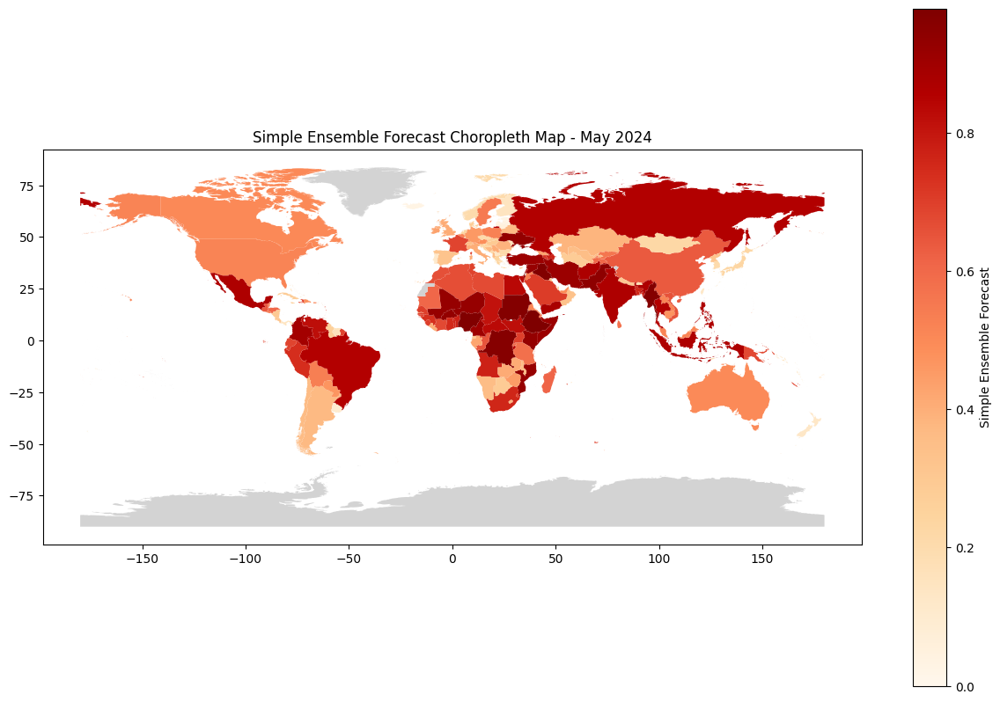

In [70]:
feb_2024_data = output[(output['year'] == 2024) & (output['month'] == 5)]

gdf = geo_boundaries

merged_gdf = gdf.merge(feb_2024_data, left_on='shapeGroup', right_on='C-isoAbbr(GeoB)', how='left')

# Plotting the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_gdf.plot(column='ensemble_forecast', ax=ax, legend=True,
                legend_kwds={'label': "Simple Ensemble Forecast"},
                cmap='OrRd', missing_kwds={'color': 'lightgrey'})
plt.title('Simple Ensemble Forecast Choropleth Map - May 2024')
plt.show()

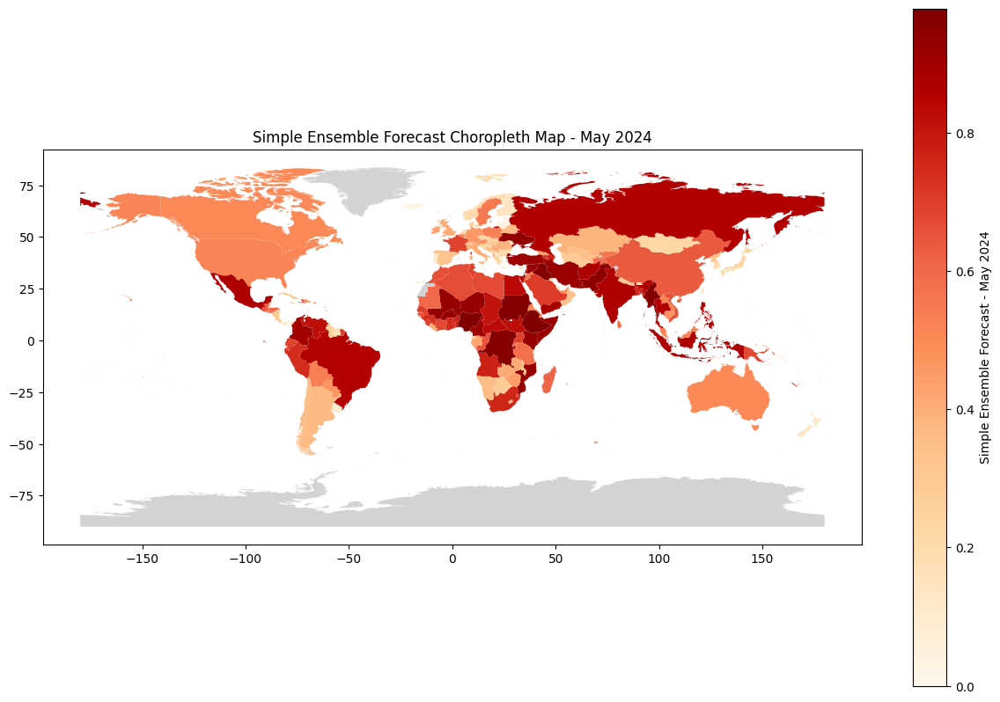

In [71]:
feb_2024_data = output[(output['year'] == 2024) & (output['month'] == 5)]

gdf = geo_boundaries

merged_gdf = gdf.merge(feb_2024_data, left_on='shapeGroup', right_on='C-isoAbbr(GeoB)', how='left')

# Plotting the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_gdf.plot(column='ensemble_forecast', ax=ax, legend=True,
                legend_kwds={'label': "Simple Ensemble Forecast - May 2024"},
                cmap='OrRd', missing_kwds={'color': 'lightgrey'})
plt.title('Simple Ensemble Forecast Choropleth Map - May 2024')
plt.show()

### 3.4 Weighted Ensemble Forecast

In [ ]:
# #stage classification based on a longer-term historical average, which might be more stable over time but less responsive to recent changes.

# # Since we need to consider all the historical data for a given country,
# # we first need to determine a function to calculate the percentage changes for fatalities and best_deaths
# # to classify the stages. We will then use the classified stage as weights in the ensemble forecast.

# # Classify stages based on historical data for each country
# def classify_stage_by_country(row, historical_data):
#     # Get the historical data for the given country and sort it by month
#     country_data = historical_data[historical_data['C-isoAbbr(GeoB)'] == row['C-isoAbbr(GeoB)']].sort_values(by=['year', 'month'])

#     # Calculate historical averages and max values
#     historical_fatalities_avg = country_data['fatalities'].mean()
#     historical_deaths_avg = country_data['best_deaths'].mean()
#     historical_fatalities_max = country_data['fatalities'].max()
#     historical_deaths_max = country_data['best_deaths'].max()

#     # Calculate percentage changes from the historical averages
#     if historical_fatalities_avg != 0:
#         fatalities_change = (row['fatalities'] - historical_fatalities_avg) / historical_fatalities_avg
#     else:
#         fatalities_change = 0

#     if historical_deaths_avg != 0:
#         deaths_change = (row['best_deaths'] - historical_deaths_avg) / historical_deaths_avg
#     else:
#         deaths_change = 0

#     # Define thresholds for classification
#     thresholds = {
#         'stable': 0.05, # +/- 5%
#         'onset': 0.50, # 50% increase
#         'escalation': 0.25, # 25% increase over at least two consecutive periods
#         'de-escalation': -0.25, # 25% decrease over at least two consecutive periods
#         'stabilization': 0.10 # Below 10% of the highest recorded monthly value
#     }

#     # Initialize the stage as unknown
#     stage = 'unknown'

#     # Classify the stage based on calculated percentage changes
#     if abs(fatalities_change) <= thresholds['stable'] and abs(deaths_change) <= thresholds['stable']:
#         stage = 'stable'
#     elif fatalities_change > thresholds['onset'] or deaths_change > thresholds['onset']:
#         stage = 'onset'
#     elif fatalities_change > thresholds['escalation']:
#         stage = 'escalation'
#     elif fatalities_change < thresholds['de-escalation']:
#         stage = 'de-escalation'
#     elif (row['fatalities'] < thresholds['stabilization'] * historical_fatalities_max and
#           row['best_deaths'] < thresholds['stabilization'] * historical_deaths_max):
#         stage = 'stabilization'

#     return stage

# historical_data = all_data[((all_data['year'] == 2023) | ((all_data['year'] == 2024) & (all_data['month'] == 1)))]

# # Apply the classification function for each row by country
# historical_data['conflict_stage'] = historical_data.apply(lambda row: classify_stage_by_country(row, historical_data), axis=1)

# # Assign weights to each stage (an example)
# stage_weights = {
#     'stable': 1,
#     'onset': 1.5,
#     'escalation': 2,
#     'de-escalation': 1.5,
#     'stabilization': 1,
#     'unknown': 1  # Default weight if stage is unknown
# }

# # Map the stage to its corresponding weight
# historical_data['stage_weight'] = historical_data['conflict_stage'].map(stage_weights)

# historical_data

In [ ]:
# # sensitive to recent trends and could be more appropriate for short-term forecasting.

# # Filter the dataset for the historical period January 2023 to January 2024
# historical_data = all_data[((all_data['year'] == 2023) | ((all_data['year'] == 2024) & (all_data['month'] == 1)))]

# historical_data['combined_severity'] = historical_data[['fatalities', 'best_deaths']].apply(lambda x: max(x), axis=1)
# historical_data['combined_severity'] = historical_data[['fatalities', 'best_deaths']].mean(axis=1)


# # Calculate the percentage change in conflict severity for each country
# historical_data['percent_change'] = historical_data.groupby('C-isoAbbr(GeoB)')['combined_severity'].pct_change()

# # Initialize a dictionary to hold the current conflict stage for each country
# country_conflict_stage = {}

# # Define the function to determine the conflict stage based on the criteria provided
# def determine_stage(percent_changes):
#     # Check for escalation or de-escalation over two consecutive periods
#     if len(percent_changes) >= 2 and percent_changes.iloc[-2] > 0.25 and percent_changes.iloc[-1] > 0.25:
#         return 'escalation'
#     if len(percent_changes) >= 2 and percent_changes.iloc[-2] < -0.25 and percent_changes.iloc[-1] < -0.25:
#         return 'de-escalation'

#     # Check for onset, stabilization, or stable otherwise
#     last_change = percent_changes.iloc[-1] if len(percent_changes) > 0 else 0
#     if last_change > 0.5:
#         return 'onset'
#     elif last_change <= 0.1 and last_change >= -0.1:
#         return 'stable'
#     elif last_change < -0.1:  # Assuming this as a simplification for stabilization
#         return 'stabilization'

#     return 'unknown'

# # Iterate over each country to determine its current conflict stage
# for country, group in historical_data.groupby('C-isoAbbr(GeoB)'):
#     percent_changes = group['percent_change']
#     country_conflict_stage[country] = determine_stage(percent_changes)

# # Assign weights to each country based on the conflict stage
# stage_weights = {
#     'stable': 1,
#     'onset': 1.5,
#     'escalation': 2,
#     'de-escalation': 1.5,
#     'stabilization': 1,
#     'unknown': 1  # Default weight if stage is unknown
# }

# country_weights = {country: stage_weights[stage] for country, stage in country_conflict_stage.items()}
# print(country_weights)

In [72]:
# Filter the dataset for the historical period January 2023 to January 2024
historical_data = all_data[((all_data['year'] == 2023) | ((all_data['year'] == 2024) & (all_data['month'] == 1)))]

# Use the mean of fatalities and best_deaths for each month as combined severity
historical_data['combined_severity'] = historical_data[['fatalities', 'best_deaths']].mean(axis=1)

# Calculate the percentage change in conflict severity for each country
historical_data['percent_change'] = historical_data.groupby('C-isoAbbr(GeoB)')['combined_severity'].pct_change()

# Define the function to determine the conflict stage based on the criteria provided
def determine_stage(percent_changes):
    # Initializing the stage as unknown
    stage = 'unknown'

    # Checking conditions for each stage according to the definitions
    if len(percent_changes) >= 3 and all(-0.1 <= change <= 0.1 for change in percent_changes[-3:]):
        stage = 'resolution'
    elif len(percent_changes) >= 2 and all(change > 0.25 for change in percent_changes[-2:]):
        stage = 'escalation'
    elif len(percent_changes) >= 2 and all(change < -0.25 for change in percent_changes[-2:]):
        stage = 'de-escalation'
    elif percent_changes.iloc[-1] > 0.5:
        stage = 'onset'
    elif -0.05 <= percent_changes.iloc[-1] <= 0.05:
        stage = 'stable'

    return stage

# Initialize a dictionary to hold the current conflict stage for each country
country_conflict_stage = {}

# Iterate over each country to determine its current conflict stage
for country, group in historical_data.groupby('C-isoAbbr(GeoB)'):
    percent_changes = group['percent_change']
    country_conflict_stage[country] = determine_stage(percent_changes)

# Assign weights to each country based on the conflict stage
stage_weights = {
    'stable': 1,
    'onset': 1.5,
    'escalation': 2,
    'de-escalation': 1.5,
    'resolution': 1,
    'unknown': 1  # Default weight if stage is unknown
}

# Create a dictionary to map each country to its corresponding weight
country_weights = {country: stage_weights[stage] for country, stage in country_conflict_stage.items()}
country_stage = {country: stage for country, stage in country_conflict_stage.items()}

print(country_weights)
print(country_stage)

{'AFG': 1.5, 'AGO': 1, 'ALB': 1, 'AND': 1, 'ARE': 1, 'ARG': 1, 'ARM': 1.5, 'ATA': 1, 'ATG': 1, 'AUS': 1, 'AUT': 1, 'AZE': 1, 'BDI': 1, 'BEL': 1, 'BEN': 1.5, 'BFA': 1, 'BGD': 2, 'BGR': 1, 'BHR': 1, 'BHS': 1, 'BIH': 1, 'BLR': 1, 'BLZ': 1, 'BOL': 2, 'BRA': 1, 'BRB': 1, 'BRN': 1, 'BTN': 1, 'BWA': 1, 'CAF': 1, 'CAN': 1, 'CHE': 1, 'CHL': 1.5, 'CHN': 1.5, 'CIV': 1.5, 'CMR': 1, 'COD': 1.5, 'COG': 1.5, 'COL': 1, 'COM': 1.5, 'CPV': 1, 'CRI': 1, 'CUB': 1, 'CYP': 1.5, 'CZE': 1, 'DEU': 1, 'DJI': 1.5, 'DMA': 1, 'DNK': 1, 'DOM': 1.5, 'DZA': 1, 'ECU': 1, 'EGY': 1, 'ERI': 1.5, 'ESP': 1, 'EST': 1, 'ETH': 1, 'FIN': 1, 'FJI': 1, 'FRA': 1.5, 'FSM': 1, 'GAB': 1, 'GBR': 1, 'GEO': 1, 'GHA': 1.5, 'GIN': 1.5, 'GNB': 1, 'GNQ': 1, 'GRC': 1.5, 'GRD': 1, 'GRL': 1, 'GTM': 1, 'GUY': 1, 'HND': 1.5, 'HRV': 1, 'HTI': 1.5, 'HUN': 1, 'IDN': 1.5, 'IND': 1.5, 'IRL': 1, 'IRN': 2, 'IRQ': 1.5, 'ISL': 1, 'ISR': 1, 'ITA': 1, 'JAM': 1, 'JOR': 1, 'JPN': 1, 'KAZ': 1, 'KEN': 1, 'KGZ': 1, 'KHM': 1, 'KNA': 1, 'KOR': 1, 'LAO': 1, 'LBN'

In [73]:
# def assign_stages_to_records(df):
#     df['stage'] = 'unknown'  # Initialize the stage column

#     for idx in range(2, len(df)):  # Start from the third record to look back two periods
#         # Calculate percentage changes
#         change_1 = df.iloc[idx-1]['percent_change']
#         change_2 = df.iloc[idx]['percent_change']

#         # Determine the stage based on recent changes
#         if change_1 > 0.25 and change_2 > 0.25:
#             stage = 'escalation'
#         elif change_1 < -0.25 and change_2 < -0.25:
#             stage = 'de-escalation'
#         elif change_2 > 0.5:
#             stage = 'onset'
#         elif -0.1 < change_2 <= 0.1:
#             stage = 'stable'
#         elif change_2 < -0.1:
#             stage = 'stabilization'
#         else:
#             stage = 'unknown'

#         df.at[df.index[idx], 'stage'] = stage

#     return df

# # Apply the function to each country's data and update `historical_data`
# historical_data = historical_data.groupby('C-isoAbbr(GeoB)').apply(assign_stages_to_records).reset_index(drop=True)
# historical_data

def assign_stages_to_records(df):
    # Initialize the stage column
    df['stage'] = 'unknown'

    # Calculate percentage changes for combined severity directly within the function
    df['combined_severity'] = df[['fatalities', 'best_deaths']].mean(axis=1)
    df['percent_change'] = df.groupby('C-isoAbbr(GeoB)')['combined_severity'].pct_change()

    for idx in range(2, len(df)):  # Start from the third record to allow looking back two periods
        # Fetch recent percentage changes for comparison
        recent_changes = df.iloc[idx-2:idx+1]['percent_change']

        # Determine the stage based on recent changes
        if len(recent_changes) >= 3 and all(-0.1 <= change <= 0.1 for change in recent_changes):
            stage = 'resolution'
        elif len(recent_changes) >= 2 and all(change > 0.25 for change in recent_changes[-2:]):
            stage = 'escalation'
        elif len(recent_changes) >= 2 and all(change < -0.25 for change in recent_changes[-2:]):
            stage = 'de-escalation'
        elif recent_changes.iloc[-1] > 0.5:
            stage = 'onset'
        elif -0.05 <= recent_changes.iloc[-1] <= 0.05:
            stage = 'stable'
        else:
            stage = 'unknown'

        # Assign the determined stage to the current record
        df.at[df.index[idx], 'stage'] = stage

    return df

# Apply the function to each country's data and update `historical_data`
historical_data = historical_data.groupby('C-isoAbbr(GeoB)').apply(assign_stages_to_records).reset_index(drop=True)

# Display the updated DataFrame
historical_data.to_csv("testcheck.csv",index=False)

In [126]:
# Filter the data for the forecast period (February to July 2024)
forecast_data = all_data[(all_data['year'] == 2024) & (all_data['month'] >= 2) & (all_data['month'] <= 7)]

# Apply weights to the forecasts
for column in ['ACLEDCAST_total_forecast', 'ViEWS_main_mean', 'ConflictForecast_best_model']:
    forecast_data[f'weighted_{column}'] = forecast_data.apply(
        lambda row: row[column] * country_weights.get(row['C-isoAbbr(GeoB)'], 1), axis=1)
print(forecast_data.head(20))
# Rank the weighted forecasts within each country
ranked_forecasts = forecast_data.groupby('C-isoAbbr(GeoB)').apply(
    lambda group: group[['weighted_ACLEDCAST_total_forecast', 'weighted_ViEWS_main_mean', 'weighted_ConflictForecast_best_model']].rank(method='average'))

print(ranked_forecasts.head(20))
# Normalize the ranks (0 to 1 scaling within each country)
normalized_ranks = ranked_forecasts.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)
print(normalized_ranks.head(20))

# Combine the forecasts by averaging the normalized ranks of each forecast for every country
normalized_ranks["mean"] = normalized_ranks.mean(axis=1)
normalized_ranks = normalized_ranks.droplevel(0)
forecast_data["weighted_ensemble_forecast"] = normalized_ranks['mean']

forecast_data.to_csv("weighted_forecast.csv",index=False)

# Display a sample of the final dataset to inspect the ensemble forecast
forecast_data

    year  month  ViEWS_main_mean  ACLEDCAST_total_forecast  \
0   2024      2           0.0205                       NaN   
1   2024      3           0.0183                       NaN   
2   2024      4           0.0247                       NaN   
3   2024      5           0.0226                       NaN   
4   2024      6           0.0272                       NaN   
5   2024      7           0.0286                       NaN   
6   2024      2           0.0117                       NaN   
7   2024      3           0.0160                       NaN   
8   2024      4           0.0210                       NaN   
9   2024      5           0.0148                       NaN   
10  2024      6           0.0134                       NaN   
11  2024      7           0.0328                       NaN   
12  2024      2           0.0097                       NaN   
13  2024      3           0.0110                       NaN   
14  2024      4           0.0141                       NaN   
15  2024

,year,month,ViEWS_main_mean,ACLEDCAST_total_forecast,ConflictForecast_best_model,C-isoAbbr(RAHDWH),C-isoAbbr(GeoB),C-name(GeoB),fatalities,best_deaths,weighted_ACLEDCAST_total_forecast,weighted_ViEWS_main_mean,weighted_ConflictForecast_best_model,weighted_ensemble_forecast
0,2024,2,0.0205,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN,NaN,0.0205,3.97974,0.007172
1,2024,3,0.0183,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN,NaN,0.0183,3.97974,0.007171
2,2024,4,0.0247,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN,NaN,0.0247,3.97974,0.007172
3,2024,5,0.0226,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN,NaN,0.0226,3.97974,0.007172
4,2024,6,0.0272,NaN,3.97974,GUY,GUY,Guyana,NaN,NaN,NaN,0.0272,3.97974,0.007172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1147,2024,3,NaN,2.0,NaN,NaN,XKX,Kosovo,NaN,NaN,2.0,NaN,NaN,0.000407
1148,2024,4,NaN,2.0,NaN,NaN,XKX,Kosovo,NaN,NaN,2.0,NaN,NaN,0.000407
1149,2024,5,NaN,2.0,NaN,NaN,XKX,Kosovo,NaN,NaN,2.0,NaN,NaN,0.000407
1150,2024,6,NaN,2.0,NaN,NaN,XKX,Kosovo,NaN,NaN,2.0,NaN,NaN,0.000407


In [127]:
# def weighted_ensemble(row, forecast_columns, stage_weight):
#     valid_forecasts = [col for col in forecast_columns if pd.notnull(row[col])]
#     if not valid_forecasts:
#         # Return NaN if there are no valid forecasts
#         return float('nan')
#     else:
#         # Calculate the weighted sum of the valid forecasts
#         weighted_sum = sum(row[col] * stage_weight for col in valid_forecasts)
#         total_weight = sum(stage_weight for col in valid_forecasts)
#         return weighted_sum / total_weight if total_weight != 0 else float('nan')

# # Now, create a weighted ensemble forecast
# forecast_columns = ['ACLEDCAST_total_forecast', 'ViEWS_main_mean', 'ConflictForecast_best_model']

# # Apply the updated function to create the weighted ensemble forecast
# all_data['weighted_ensemble_forecast'] = all_data.apply(lambda row: weighted_ensemble(row, forecast_columns, row['stage_weight']), axis=1)

# # Let's check the dataframe again
# all_data[['C-isoAbbr(GeoB)', 'year', 'month', 'conflict_stage', 'stage_weight', 'weighted_ensemble_forecast']].head()
# all_data.to_csv("weighted.csv",index=False)


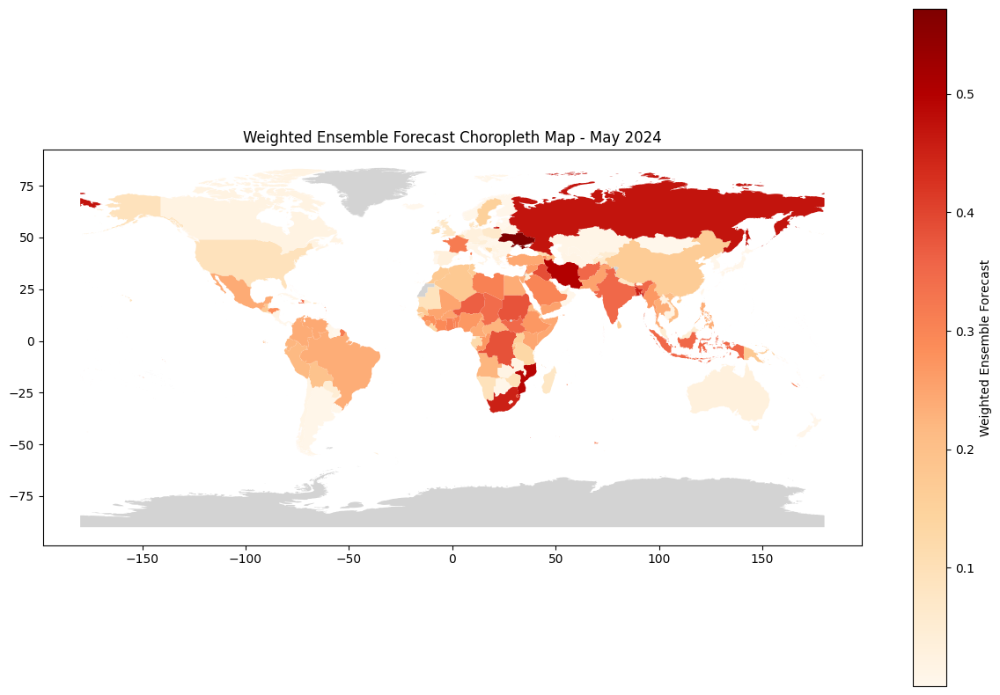

In [130]:
gdf = geo_boundaries
feb_2024_data = forecast_data[(forecast_data['year'] == 2024) & (forecast_data['month'] == 7)]


# Merge the forecast data with the GeoDataFrame based on the 'C-isoAbbr(GeoB)' column
merged_gdf = gdf.merge(feb_2024_data, left_on='shapeGroup', right_on='C-isoAbbr(GeoB)', how='left')

# Plotting the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_gdf.plot(column='weighted_ensemble_forecast', ax=ax, legend=True,
                legend_kwds={'label': "Weighted Ensemble Forecast"},
                cmap='OrRd', missing_kwds={'color': 'lightgrey'})
plt.title('Weighted Ensemble Forecast Choropleth Map - May 2024')
plt.show()

# 4) Visualization

1) We need to focus on on-the-fly shapefile-csv merge based on user defined filters i.e month/year. For instance, if we are forecasting 6 months in the future and we have 218 countries, this means we will have 1,308 records with geometry information. This is alot of memory to be loaded into these tools which will slow down the app immensely.

2) Since we are dealing with country level visualization, the main focus will be on improving the speed of data loading and interactivity for better user experience.

**Comparison of visualization tools**

[Source](https://github.com/pawlodkowski/interactive_climate_map)

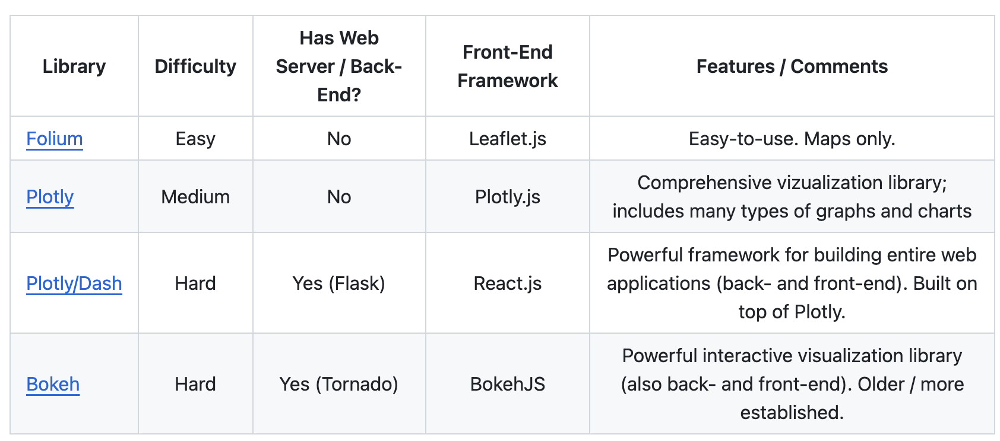

For our use case, Plotly Dash is the best tool to proceed with.

When plotting with choropleth, you have the option of using the "geometry" column from your original df (consider ensemble_forecast csv is merged with GeoBoundaries shapefile).
However, this method is very computationally expensive, since a geometry will be loaded for every row in your df (imagine 1000 rows - you'd need a LOT of memory, and time).

An alternative method would be passing a json file with all geometries to be plotted, identified by a common 'id'. Plotly reads the 'id' on the original df, looks up the same 'id' on the json file, and plots accordingly. For our case, this 'id' will be the name of the country.

Instead of loading geometries over and over for different rows, this method allows the geometries to be passed only once (from the json), and have their color 'rewritten' over and over, saving memory (which is done by the df).

In [119]:
country_dict = geo_boundaries.set_index('shapeName')['shapeGroup'].to_dict()

selected_country_code = "KAZ"

# Create a dropdown menu for country names
dropdown = widgets.Dropdown(options=[(name, code) for name, code in country_dict.items()], value=selected_country_code, description='Country:')
dropdown

# Function to display the country code of the selected country
def on_dropdown_change(change):
    global selected_country_code  # Indicate that we're using the global variable
    if change['type'] == 'change' and change['name'] == 'value':
        selected_country_code = change['new']
        print(f"Selected Country Code: {selected_country_code}")  # Optional: print the selected code


# Watch the dropdown for changes and call the function to update the variable
dropdown.observe(on_dropdown_change, names='value')

# Display the dropdown
display(dropdown)

Dropdown(description='Country:', index=89, options=(('Afghanistan', 'AFG'), ('United Kingdom', 'GBR'), ('Alban…

In [120]:
#We will focus on South America region to speed up the loading
# countries_list=['GUY', 'SUR', 'TTO', 'VEN', 'ARG', 'BOL', 'BRA', 'CHL', 'ECU', 'PRY', 'PER', 'URY', 'BRB', 'GRD', 'VCT', 'COL', 'PAN', 'FRA', 'NLD']
# geoboundaries  = geo_boundaries[geo_boundaries['shapeGroup'].isin(countries_list)]
geoboundaries = geo_boundaries[(geo_boundaries['shapeGroup'] == selected_country_code)]
geoboundaries

,shapeGroup,shapeType,shapeName,geometry,C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB)
89,KAZ,ADM0,Kazakhstan,"MULTIPOLYGON (((50.35909 45.05196, 50.36240 45...",KAZ,Kazakhstan,ADM0


In [121]:
#Preparing the geometries for GeoBoundaries
geoboundaries = geo_boundaries[(geo_boundaries['shapeGroup'] == selected_country_code)]
# geoboundaries = geo_boundaries
#The index of the json has to be the country code
geoboundaries.index = geoboundaries['shapeGroup']

#Dropping useless columns for this application (it's all about saving memory)
geoboundaries.drop(['shapeGroup','shapeType'], axis=1, inplace=True)

#Choropleth mapbox accepts a json for the geometries of neighbourhoods.
geoboundaries_json = json.loads(geoboundaries.to_json())
geoboundaries.head()

,shapeName,geometry,C-isoAbbr(GeoB),C-name(GeoB),C-type(GeoB)
shapeGroup,,,,,
KAZ,Kazakhstan,"MULTIPOLYGON (((50.35909 45.05196, 50.36240 45...",KAZ,Kazakhstan,ADM0


In [122]:
df = pd.read_csv("/content/ensemble_forecast.csv")
df = df[(df['C-isoAbbr(GeoB)'] == selected_country_code)]
# df  = df[df['C-isoAbbr(GeoB)'].isin(countries_list)]

#We need to work with datetime for the labels
df['month_year'] = pd.to_datetime(df[['year', 'month']].assign(DAY=1))

#Plotly does not automatically sort for time, so we'll make sure it is sorted beforehand.
df.sort_values(by='month_year', inplace=True)

# #for the slider labels, we'll use datetime's .strftime() function.
df['Month and Year'] = df['month_year'].dt.strftime("%B, %Y")

# #To save memory, we'll drop unnecessary columns
df = df[['C-isoAbbr(GeoB)', 'ensemble_forecast', 'Month and Year']]
df.columns = ['shapeGroup', 'ensemble_forecast', 'Month and Year']
df

FileNotFoundError: [Errno 2] No such file or directory: '/content/ensemble_forecast.csv'

In [ ]:
# Get Latitude and Longitude
selected_country_gdf = geo_boundaries[geo_boundaries['shapeGroup'] == selected_country_code]
country_centroid= selected_country_gdf.geometry.centroid.iloc[0]
centroid_latitude = country_centroid.y
centroid_longitude = country_centroid.x
print(country_centroid)

In [124]:
# Get country name given the country code
key_list=list(country_dict.keys())
val_list=list(country_dict.values())
def return_key(val):
    for i in range(len(country_dict)):
        if val_list[i]==val:
            return key_list[i]
    return("Key Not Found")

country_name_returned=return_key(selected_country_code)
country_name_returned

'Kazakhstan'

**Both of these files will be linked by a common identification column.** We are using the country code as the common identificator.

**The JSON file has the name of the "shapeGroup" as it's index** (it has to be the index), and the **df has a column named 'shapeGroup'**, with the names of the country code. This is how plotly connects one to the other.

Choropleth has the argument 'locations', which is where we'll pass df['shapeGroup']

In [125]:
#using plotly for an animated choropleth map
fig = px.choropleth_mapbox(data_frame=df,
                           geojson=geoboundaries_json,
                           locations=df.shapeGroup,
                           color='ensemble_forecast',
                           center={'lat':centroid_latitude, 'lon':centroid_longitude},
                           mapbox_style='open-street-map',
                           zoom=3,
                           color_continuous_scale='deep',
                           range_color=(0, 1),
                           animation_frame='Month and Year',
                           title=f"Political Violence Ensemble Forecast (0 = low violence & 1 = high violence)",
                           width=800,
                           height=600)
#fig.write_html('visualization_map.html')
fig.show()

AttributeError: 'DataFrame' object has no attribute 'shapeGroup'

# 5) Case Analysis

## 1) Mozambique

In [ ]:
def get_cast_grouped(country):
    response = requests.get(f"https://api.acleddata.com/cast/read?key=OcojFgHon56QHFtjOS9z&email=zakhtar@alumni.cmu.edu&country={country}")
    if response.status_code == 200:
        data = response.json()
        if data.get('success'):
            df = pd.DataFrame(data['data'])
            # current_time = datetime.now()
            # print(df)
            df.to_csv(f"{country}_cast.csv", index=False)
            return df
        else:
            print(f"Error: {data.get('error')}")
    else:
        print(f"HTTP Error: {response.status_code}")

In [ ]:
country="Mozambique"
cast_data=get_cast_grouped(country)

In [ ]:
df = pd.read_csv(f'/content/{country}_cast.csv')
df = df.groupby(['country', 'month', 'year'])['total_forecast','total_observed'].sum().reset_index()
df.to_csv(f"/content/{country}_cast_grouped.csv", index=False)

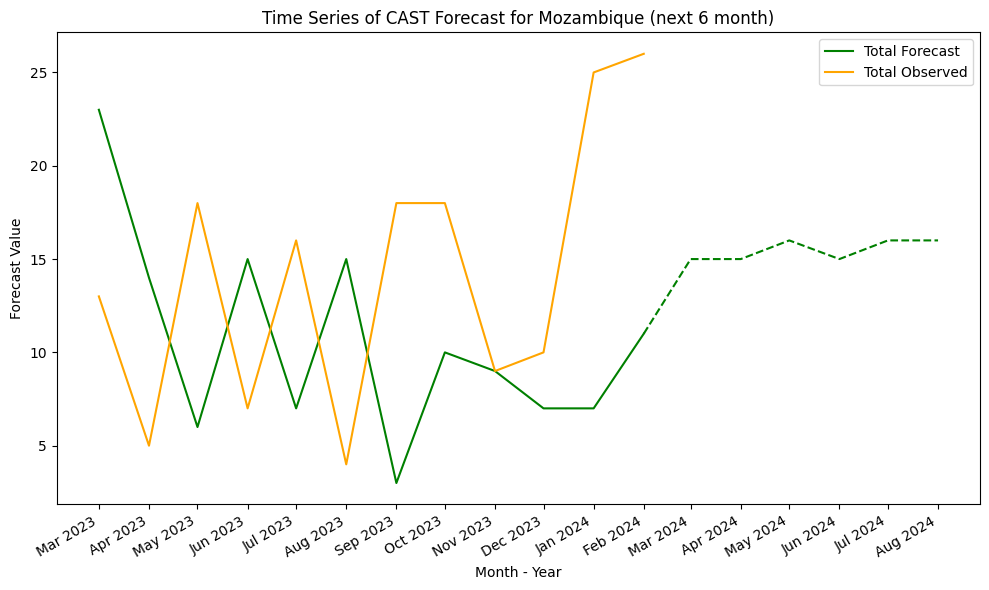

In [ ]:
df = pd.read_csv(f"/content/{country}_cast_grouped.csv")

# Create a combined 'month_year' column for plotting
df['month_year'] = pd.to_datetime(df['month'] + ' ' + df['year'].astype(str))

# Sort by 'month_year' to ensure chronological order
df_sorted = df.sort_values(by='month_year')

# Split the data into observed (solid line) and forecast (dashed line)
observed = df_sorted[df_sorted['total_observed'] != 0]
forecast = df_sorted[df_sorted['total_observed'] == 0]


# Identify the first month with a zero in total observed to use as the cutoff for changing the line style
first_zero_observed_month = df_sorted[df_sorted['total_observed'] == 0]['month_year'].min()
one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)

# Filter out zeros from total observed before plotting to avoid dropping to 0
df_filtered_observed = df_sorted[df_sorted['total_observed'] != 0]

plt.figure(figsize=(10, 6))

# Plot total forecast data up to the first zero observed month as solid
before_first_zero_forecast = df_sorted[df_sorted['month_year'] < first_zero_observed_month]
plt.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], label='Total Forecast', color='green', linestyle='-')

# Plot total forecast data from the first zero observed month onward as dashed
after_first_zero_forecast = df_sorted[df_sorted['month_year'] >= one_month_before_first_zero]
plt.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], color='green', linestyle='--')

# Plot total observed data without zeros
plt.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], label='Total Observed', color='orange', linestyle='-')

# Formatting the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate() # Rotation

plt.title('Time Series of CAST Forecast for Mozambique (next 6 month)')
plt.xlabel('Month - Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.tight_layout()

plt.show()

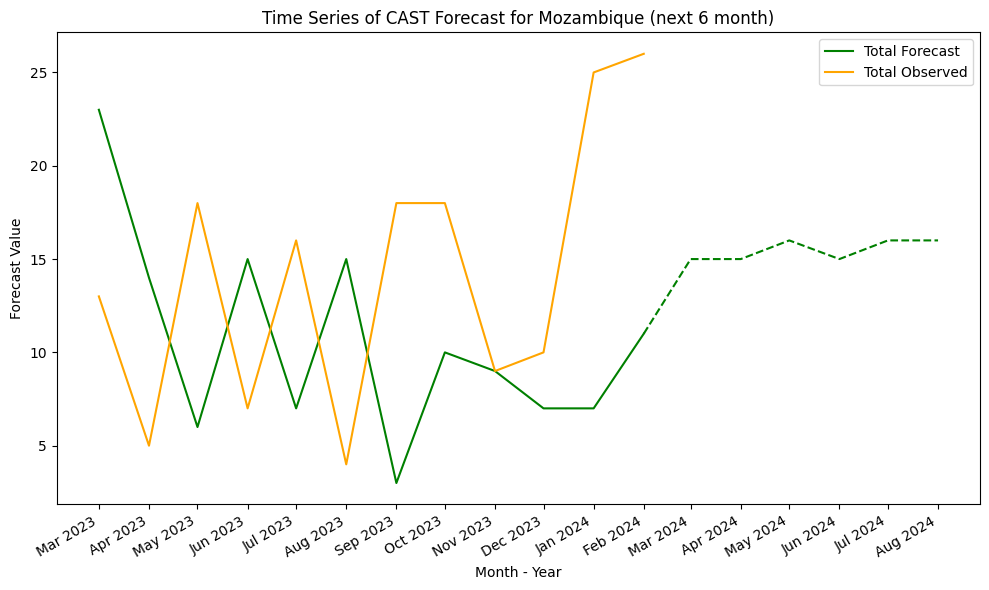

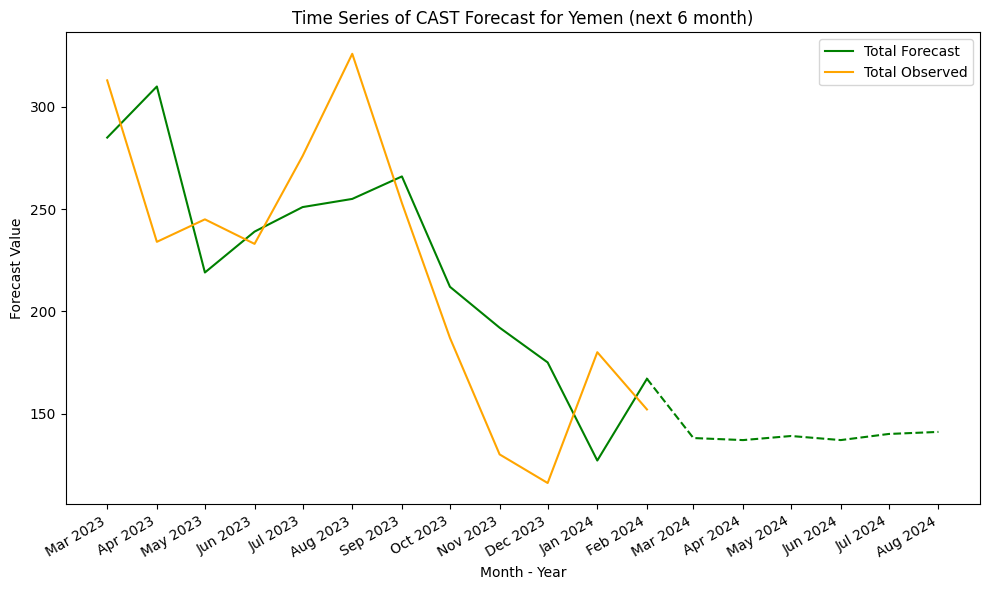

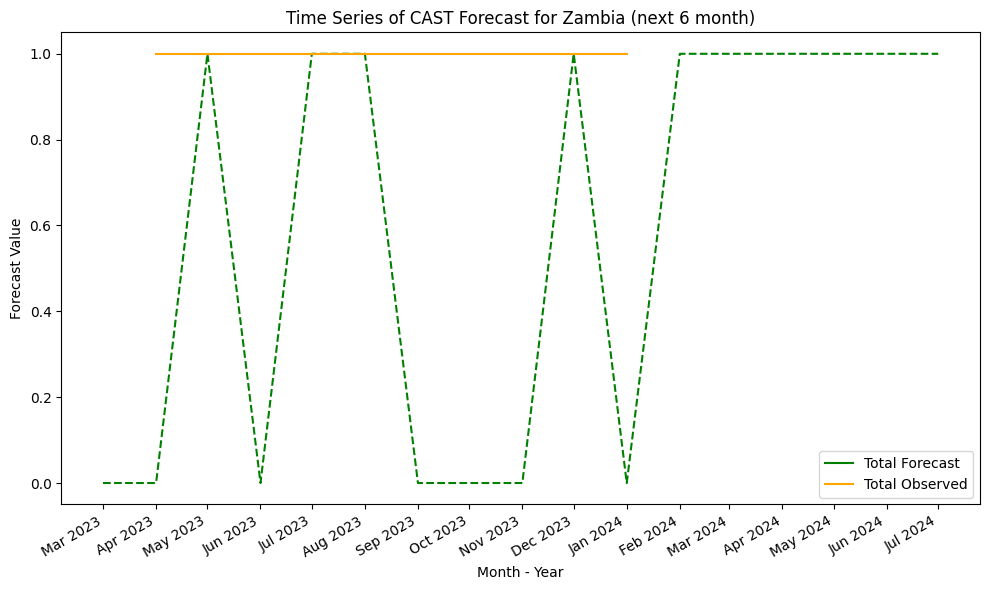

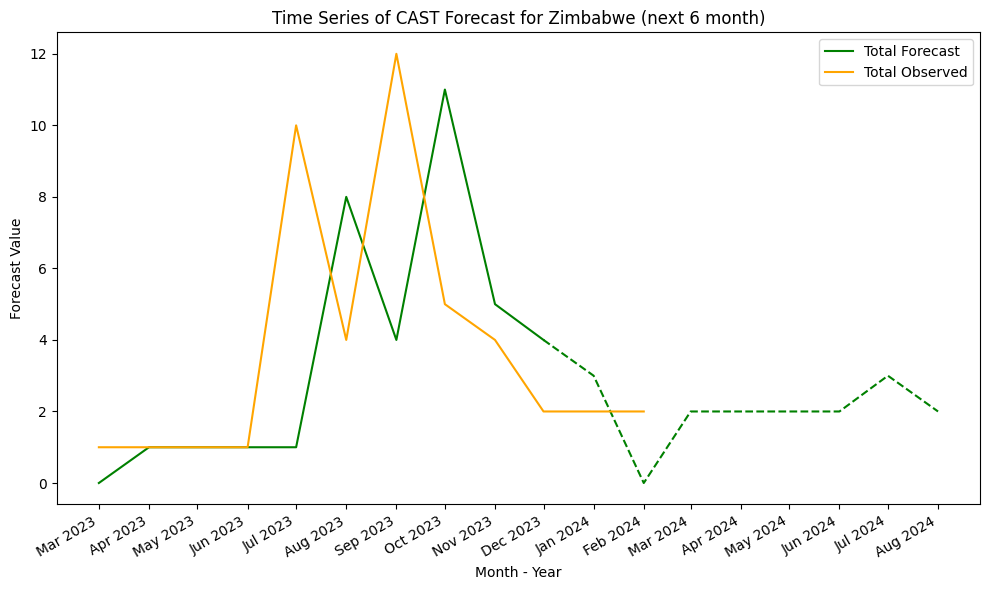

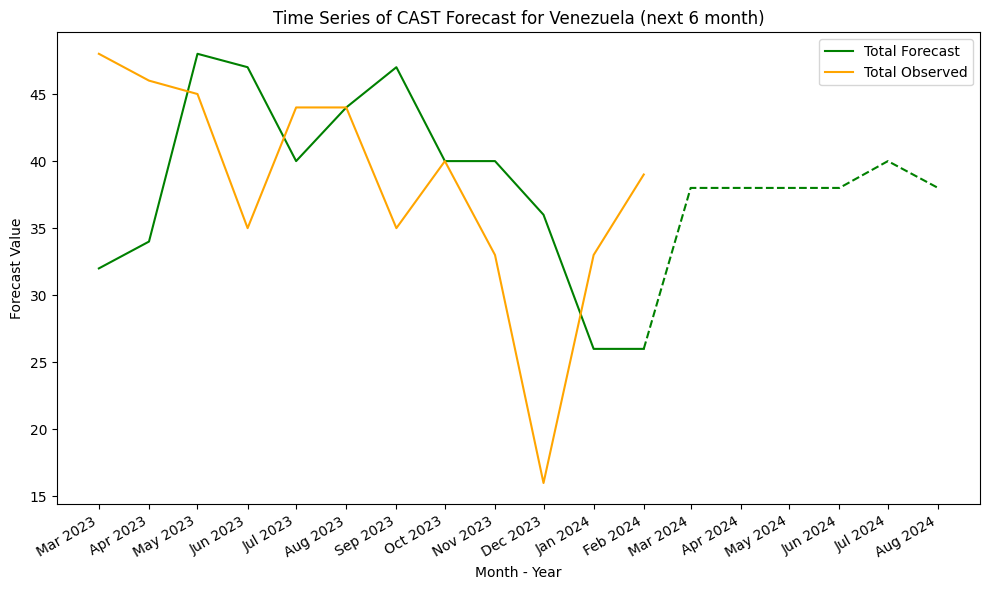

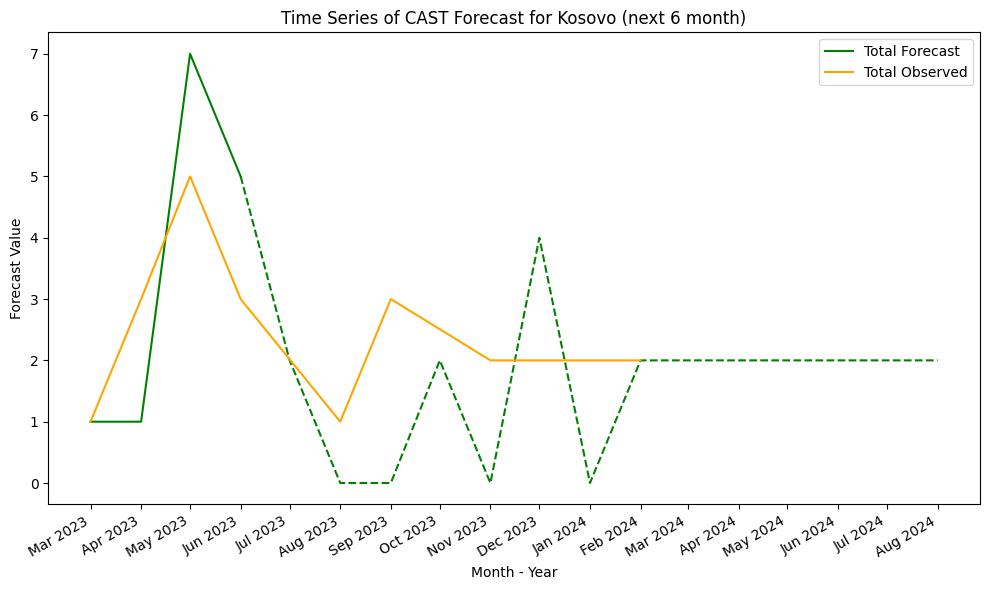

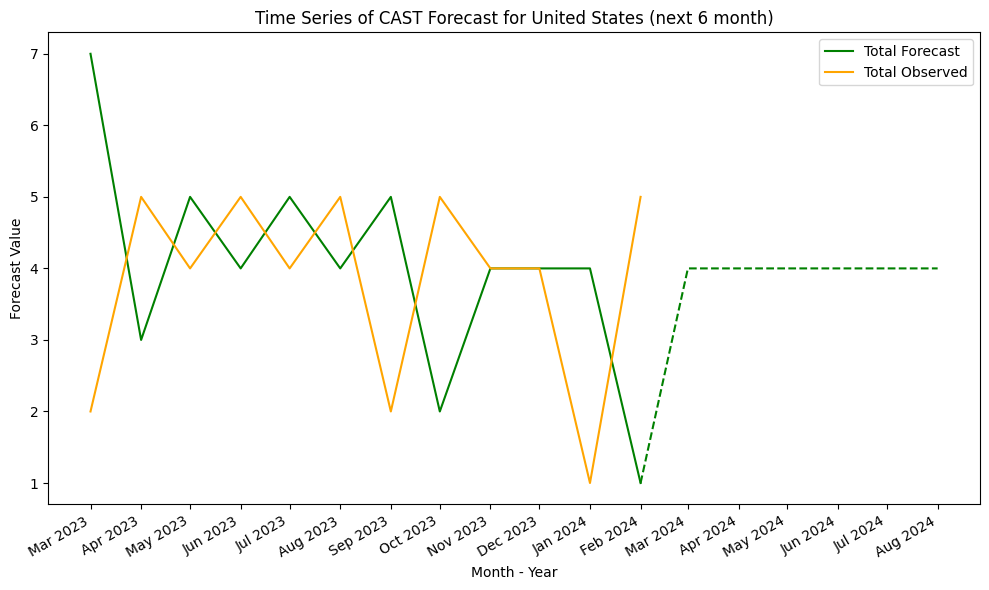

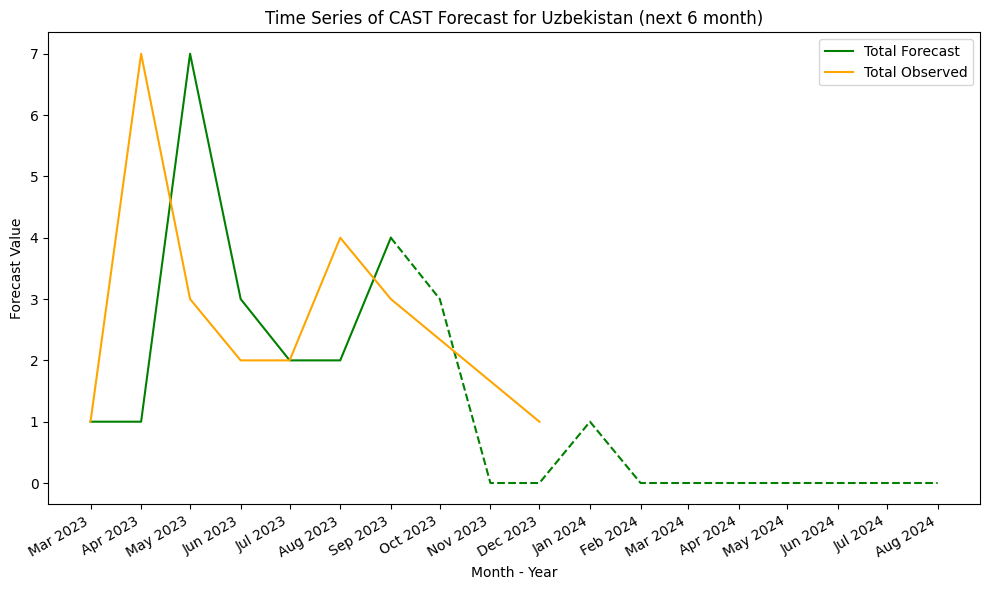

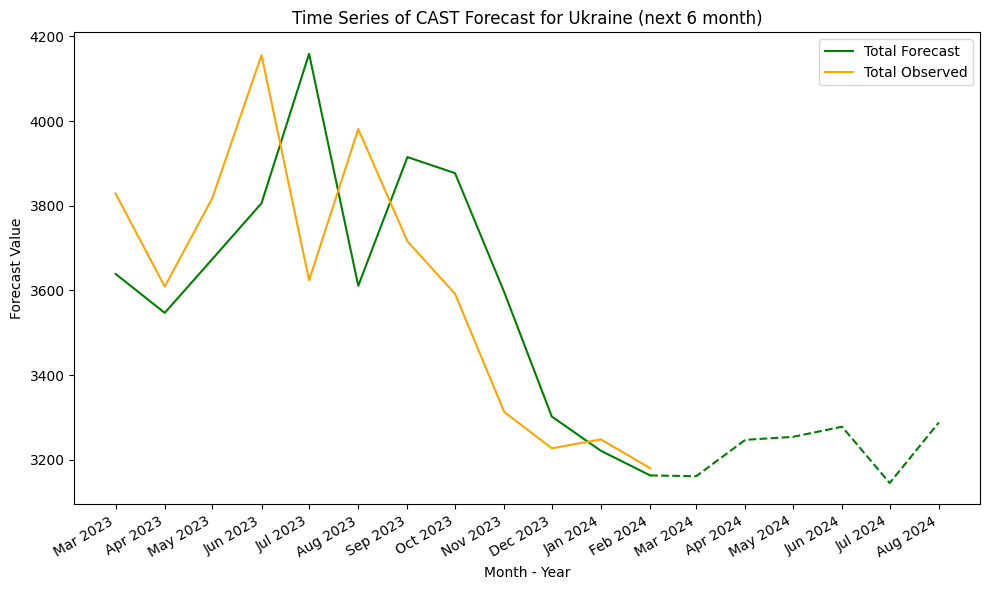

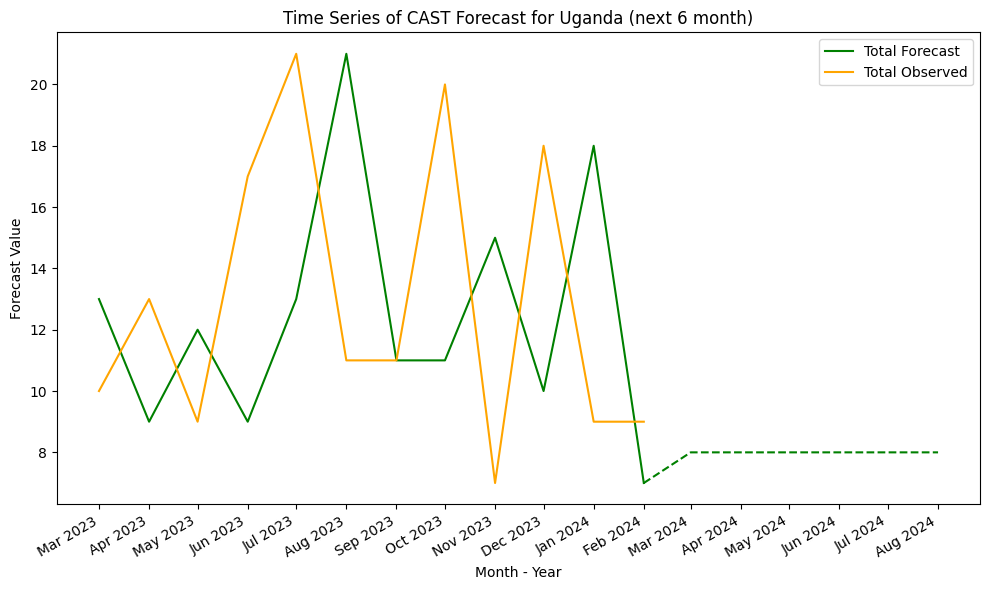

In [ ]:
def process_and_plot(country):
    cast_data = get_cast_grouped(country)
    if cast_data is None:
        return  # Skip if data could not be fetched

    df = pd.read_csv(f'/content/{country}_cast.csv')
    df = df.groupby(['country', 'month', 'year'])['total_forecast', 'total_observed'].sum().reset_index()

    # Create a combined 'month_year' column for plotting
    df['month_year'] = pd.to_datetime(df['month'] + ' ' + df['year'].astype(str))

    # Sort by 'month_year' to ensure chronological order
    df_sorted = df.sort_values(by='month_year')

    # Split the data into observed (solid line) and forecast (dashed line)
    observed = df_sorted[df_sorted['total_observed'] != 0]
    forecast = df_sorted[df_sorted['total_observed'] == 0]


    # Identify the first month with a zero in total observed to use as the cutoff for changing the line style
    first_zero_observed_month = df_sorted[df_sorted['total_observed'] == 0]['month_year'].min()
    one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)

    # Filter out zeros from total observed before plotting to avoid dropping to 0
    df_filtered_observed = df_sorted[df_sorted['total_observed'] != 0]

    plt.figure(figsize=(10, 6))

    # Plot total forecast data up to the first zero observed month as solid
    before_first_zero_forecast = df_sorted[df_sorted['month_year'] < first_zero_observed_month]
    plt.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], label='Total Forecast', color='green', linestyle='-')

    # Plot total forecast data from the first zero observed month onward as dashed
    after_first_zero_forecast = df_sorted[df_sorted['month_year'] >= one_month_before_first_zero]
    plt.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], color='green', linestyle='--')

    # Plot total observed data without zeros
    plt.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], label='Total Observed', color='orange', linestyle='-')

    # Formatting the x-axis
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    plt.gcf().autofmt_xdate() # Rotation

    plt.title(f'Time Series of CAST Forecast for {country} (next 6 month)')
    plt.xlabel('Month - Year')
    plt.ylabel('Forecast Value')
    plt.legend()
    plt.tight_layout()

    plt.show()

countries = ['Mozambique','Yemen','Zambia','Zimbabwe','Venezuela','Kosovo','United States','Uzbekistan','Ukraine','Uganda']

for country in countries:
    process_and_plot(country)

In [ ]:
def get_views(req_url, countrycode) -> pd.DataFrame:

    master_list = []
    while req_url:
        r = requests.get(req_url)
        if r.status_code != 200:
            print(f"Failed to fetch data: {r.status_code}")
            return pd.DataFrame()  # Return an empty DataFrame in case of an error

        page_data = r.json()
        master_list += page_data['data']

        # Update req_url to fetch the next page, if any
        req_url = page_data.get('next_page', '')

    df = pd.DataFrame(master_list)
    df = df[df['isoab'] == countrycode]
    current_time = datetime.now()
    df.to_csv(f"{countrycode}_sb_views.csv", index=False)
    return f"{countrycode}_sb_views.csv"

In [ ]:
viewsdf = get_views("https://api.viewsforecasting.org/fatalities002_2023_12_t01/cm/sb", "MOZ")
viewsdf

'MOZ_sb_views.csv'

main_mean and surrogate_mean_ch have a moving trend across months as compared to other variables.

**"main_mean":** Predicted number of fatalities.

*description:* Point prediction of the number of fatalities in impending conflict, presented per type of violence and level of analysis.

**"surrogate_mean_ch":** Predicted fatalities, isolated contribution from conflict history features.

*description:* Predicted fatalities per type of violence (tv) and level of analysis, given only the history of the respective type of violence (as recorded by the UCDP GED and UCDP Candidate datasets) in the country or PRIO-GRID-cell at hand.</br>The prediction is generated by a surrogate or interpretation model that shows how much of the main VIEWS conflict prediction can be related to the input variable `ln_ged_{tv}_dep` in practice; a regression model with the main prediction as the dependent variable and a flexible function of `ln_ged_{tv}_dep` as the independent one. The surrogate model results should be seen as an indication of the relative importance of specific independent variables (predictors), rather than point predictions of their own (they do not sum up to the point predictions from the main ensemble model). <a href='https://www.diva-portal.org/smash/get/diva2:1667048/FULLTEXT01.pdf'>Learn more about the surrogate models.</a>","unit":{"name":"Fatalities","range":"0 - unlimited"}

surrogate_mean_ch has the conflict history and would be a more meaningful contribution to the ensemble forecast

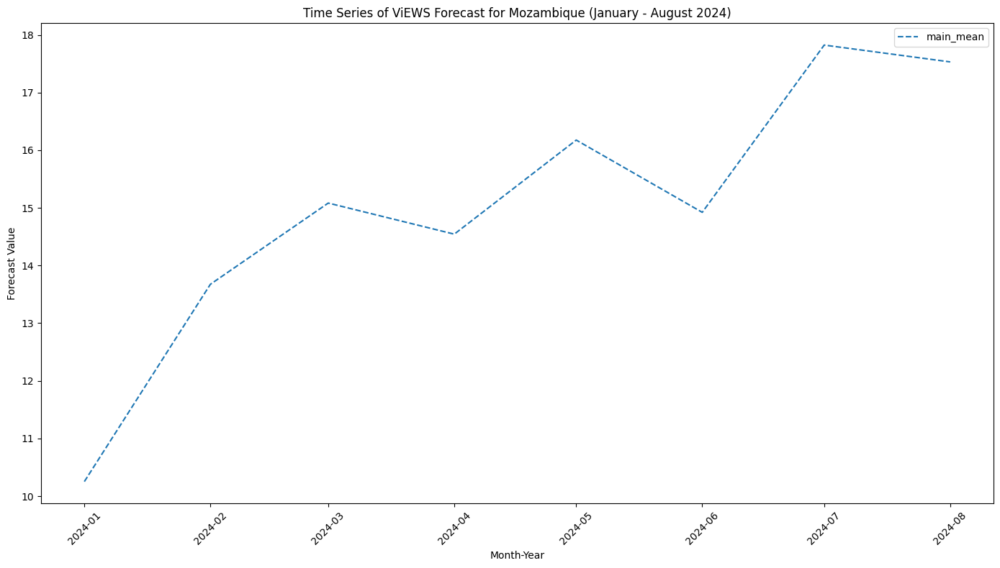

In [ ]:
file_path = f'/content/{viewsdf}'  # Make sure to update this path to your actual file location
data = pd.read_csv(file_path)


# Creating a 'date' column for easier plotting of time series
data['date'] = pd.to_datetime(data[['year', 'month']].assign(DAY=1))

data = data[data['date'] <= '2024-08-01']
# print(data)

# Selecting the relevant columns for the plot
columns_to_plot = [
    'main_mean'
    # ,'main_dich',
    # 'surrogate_mean_ch',
    #  'surrogate_mean_dem',
    # 'surrogate_mean_nch',
    # 'surrogate_mean_imr',
    # 'surrogate_mean_pop'
]

# Conflict history (surrogate_mean_ch)
# Infant mortality rate (surrogate_mean_imr)
# Neighbourhood conflict history (surrogate_mean_nch)
# Population size (surrogate_mean_pop)
# Liberal democracy index (surrogate_mean_dem)

# main_mean: Predicted Number of Fatalities
# main_dich: Predicted Probability of Conflict
# surrogate_mean_ch: Predicted Fatalities, Isolated Contribution from Conflict History Features
# surrogate_mean_pop: Predicted Fatalities, Isolated Contribution from Population Size Feature
# surrogate_mean_imr: Predicted fatalities, isolated contribution from infant mortality rate
# surrogate_mean_nch: Predicted fatalities, isolated contribution from neighborhood conflict history

# Plotting
plt.figure(figsize=(14, 8))
for col in columns_to_plot:
    plt.plot(data['date'], data[col], label=col, linestyle='--')

plt.title('Time Series of ViEWS Forecast for Mozambique (January - August 2024)')
plt.xlabel('Month-Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
def get_conflictforecast(url,countrycode):
  response = requests.get(url)

  if response.status_code == 200:
      data = response.json()
      df = pd.DataFrame(data)
      name=df.iloc[int(0)]['name'].replace(".csv","") #conflictforecast_anyviolence_12
      name2=df.iloc[int(2)]['name'].replace(".csv","") #conflictforecast_armedconf_12
      name3=df.iloc[int(5)]['name'].replace(".csv","") #conflictforecast_lnbest_pc_12
      csv_url = df.iloc[int(0)]['publicUrl']
      response = requests.get(csv_url)
      df1 = pd.read_csv(StringIO(response.text))
      df1 = df1[df1['isocode'] ==countrycode]
      df1 = df1[((df1['year'] == 2023) & (df1['month'] >= 1)) | (df1['year'] == 2024)]
      df1 = df1[['isocode', 'year','month','best_model']]
      df1 = df1.rename(columns={"best_model": "anyviolence_best_model"})
      print(df1)

      csv_url = df.iloc[int(2)]['publicUrl']
      response = requests.get(csv_url)
      df2 = pd.read_csv(StringIO(response.text))
      df2 = df2[df2['isocode'] ==countrycode]
      df2 = df2[((df2['year'] == 2023) & (df2['month'] >= 1)) | (df2['year'] == 2024)]
      df2 = df2[['isocode', 'year','month','best_model']]
      df2 = df2.rename(columns={"best_model": "armedconf_best_model"})
      print(df2)

      csv_url = df.iloc[int(5)]['publicUrl']
      response = requests.get(csv_url)
      df3 = pd.read_csv(StringIO(response.text))
      df3 = df3[df3['isocode'] ==countrycode]
      df3 = df3[((df3['year'] == 2023) & (df3['month'] >= 1)) | (df3['year'] == 2024)]
      df3 = df3[['isocode', 'year','month','best_model']]
      df3 = df3.rename(columns={"best_model": "intensity_best_model"})
      print(df3)

      dfnew = pd.concat([df1,df2,df3],axis=1,sort=False).reset_index()
      dfnew = dfnew[['isocode', 'year','month','anyviolence_best_model','armedconf_best_model','intensity_best_model']]
      dfnew = dfnew.loc[:, ~dfnew.columns.duplicated(keep='first')]
      print(dfnew)
      current_time = datetime.now()
      dfnew.to_csv(f"{countrycode}_conflictforecast.csv", index=False)
      return f"{countrycode}_conflictforecast.csv"
  else:
      print(f"Failed to retrieve data, status code: {response.status_code}")

#get_conflictforecast("https://api.backendless.com/C177D0DC-B3D5-818C-FF1E-1CC11BC69600/C5F2917E-C2F6-4F7D-9063-69555274134E/services/fileService/get-latest-file-listing")

In [ ]:
# # Load the CSV file
# file_path = '/content/MOZ_conflictforecast_data_download_2024_03.csv'  # Make sure to update this path to your actual file location
# data = pd.read_csv(file_path)

# # Convert the 'year' and 'month' columns into a datetime format for plotting
# data['date'] = pd.to_datetime(data[['year', 'month']].assign(DAY=1))


# # Plotting
# plt.figure(figsize=(12, 6))

# # Plot for Any Violence Best Model
# plt.plot(data['date'][:-1], data['anyviolence_best_model'][:-1], label='Any Violence Best Model', marker='o')
# # plt.plot(data['date'][-2:], data['anyviolence_best_model'][-2:], label='_nolegend_', marker='o', linestyle='--', color='blue')

# # Plot for Armed Conflict Best Model
# plt.plot(data['date'][:-1], data['armedconf_best_model'][:-1], label='Armed Conflict Best Model', marker='x')
# # plt.plot(data['date'][-2:], data['armedconf_best_model'][-2:], label='_nolegend_', marker='x', linestyle='--', color='orange')

# # Plot for Intensity Best Model
# plt.plot(data['date'][:-1], data['intensity_best_model'][:-1], label='Intensity Best Model', marker='s')
# # plt.plot(data['date'][-2:], data['intensity_best_model'][-2:], label='_nolegend_', marker='s', linestyle='--', color='green')

# plt.title('Time Series of Conflict Forecast for Mozambique (12 months ahead)')
# plt.xlabel('Month - Year')
# plt.ylabel('Forecast Value')
# plt.legend()
# plt.grid(True)
# plt.xticks(rotation=45)
# plt.tight_layout()

# plt.show()

In [ ]:
cf_df= get_conflictforecast("https://api.backendless.com/C177D0DC-B3D5-818C-FF1E-1CC11BC69600/C5F2917E-C2F6-4F7D-9063-69555274134E/services/fileService/get-file-listing?date=01-2024","MOZ")
cf_df

      isocode  year  month  anyviolence_best_model
18239     MOZ  2023      1               89.979134
18240     MOZ  2023      2               88.034286
18241     MOZ  2023      3               89.138428
18242     MOZ  2023      4               87.574951
18243     MOZ  2023      5               88.008682
18244     MOZ  2023      6               88.795097
18245     MOZ  2023      7               88.897034
18246     MOZ  2023      8               89.083252
18247     MOZ  2023      9               89.126343
18248     MOZ  2023     10               90.299873
18249     MOZ  2023     11               89.219460
18250     MOZ  2023     12               92.389526
18251     MOZ  2024      1               92.195656
      isocode  year  month  armedconf_best_model
18239     MOZ  2023      1             89.140175
18240     MOZ  2023      2             88.291466
18241     MOZ  2023      3             88.614426
18242     MOZ  2023      4             87.960907
18243     MOZ  2023      5             88

'MOZ_conflictforecast.csv'

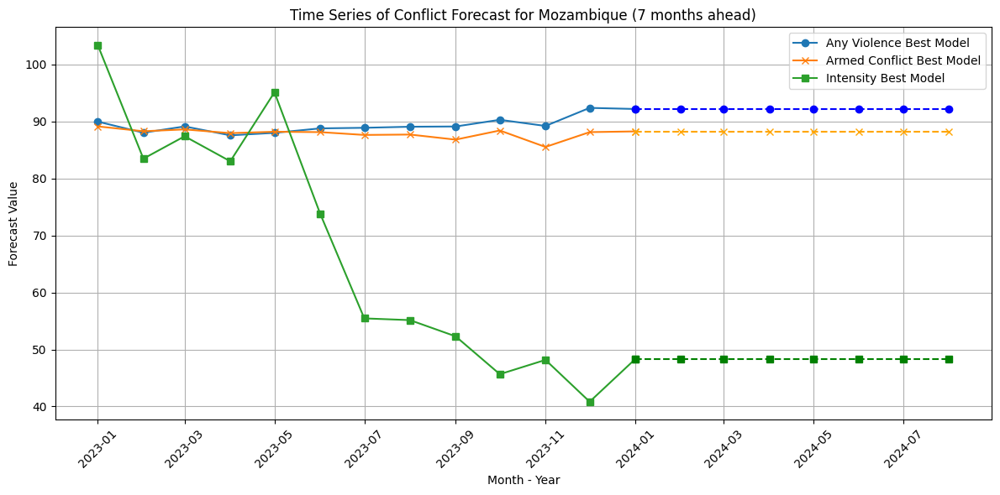

In [ ]:
file_path = f'/content/{cf_df}'
data = pd.read_csv(file_path)

# Convert 'year' and 'month' into a datetime format to find the latest month
data['date'] = pd.to_datetime(data.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))

# Identify the row with the latest date
latest_row = data[data['date'] == data['date'].max()]

# Extract values to be duplicated into the upcoming months
latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()

# Create new rows for the next 12 months with the same values
new_rows = []
for m in range(1, 8):
    new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
    new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
    new_row = latest_values.copy()
    new_row.update({'year': new_year, 'month': new_month})
    new_rows.append(new_row)

# Convert the list of dictionaries to a DataFrame and append it to the original DataFrame
new_rows_df = pd.DataFrame(new_rows)
extended_data = pd.concat([data, new_rows_df], ignore_index=True)

# Optional: Remove the 'date' column if no longer needed, or update it with correct dates
extended_data.drop('date', axis=1, inplace=True)
data_combined = extended_data

# Assuming 'data_combined' is your DataFrame with original and extended data
data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])

# Find the index where the extended data starts
extended_start_index = len(data)  # 'data' is the original dataset before adding the 12 months

# Plotting
plt.figure(figsize=(12, 6))

# Plot for Any Violence Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['anyviolence_best_model'][:extended_start_index], label='Any Violence Best Model', marker='o')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['anyviolence_best_model'][extended_start_index-1:], label='_nolegend_', marker='o', linestyle='--', color='blue')

# Plot for Armed Conflict Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['armedconf_best_model'][:extended_start_index], label='Armed Conflict Best Model', marker='x')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['armedconf_best_model'][extended_start_index-1:], label='_nolegend_', marker='x', linestyle='--', color='orange')

# Plot for Intensity Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['intensity_best_model'][:extended_start_index], label='Intensity Best Model', marker='s')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['intensity_best_model'][extended_start_index-1:], label='_nolegend_', marker='s', linestyle='--', color='green')

plt.title('Time Series of Conflict Forecast for Mozambique (7 months ahead)')
plt.xlabel('Month - Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

ACLED

In [ ]:
acled_df= download_acled_country('2023-03-01', '2024-03-30', 'Mozambique')
print(acled_df)

Data for Mozambique from 2023-03-01 to 2024-03-30 has been saved to Mozambique_acled_2023-03-01_to_2024-03-30.csv
Mozambique_acled_2023-03-01_to_2024-03-30.csv


In [ ]:
data = pd.read_csv(f'/content/{acled_df}')

grouped_data = data.groupby('event_date').agg({
    'time_precision': 'mean',
    'geo_precision': 'mean',
    'fatalities': 'sum'
}).reset_index()

# Counting the event types per date
event_type_counts_per_date = data.pivot_table(index='event_date', columns='event_type', aggfunc='size', fill_value=0)

# Merging the two DataFrames
final_per_date_df = pd.merge(grouped_data, event_type_counts_per_date, on='event_date')

# Save to CSV
file=acled_df.split(".csv")[0]
output_path_per_date = f'/content/{file}_aggregated.csv'
final_per_date_df.to_csv(output_path_per_date, index=False)

final_per_date_df.head()

,event_date,time_precision,geo_precision,fatalities,Battles,Explosions/Remote violence,Protests,Riots,Strategic developments,Violence against civilians
0,2023-03-01,1.0,2.000000,0,0,0,0,0,1,1
1,2023-03-02,1.0,2.000000,0,0,0,0,0,0,1
2,2023-03-04,1.0,1.333333,3,1,0,0,1,0,1
3,2023-03-06,1.0,1.333333,0,0,0,0,1,2,0
4,2023-03-08,2.0,2.000000,0,0,0,0,0,1,0


In [ ]:
fatalities_df = pd.read_csv(output_path_per_date)

fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# Extract 'month' and 'year' from 'event_date'
fatalities_df['month'] = fatalities_df['event_date'].dt.month
fatalities_df['year'] = fatalities_df['event_date'].dt.year

# Group by 'month' and 'year', then sum 'fatalities'
fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')
filenamenew=output_path_per_date.split(".csv")[0]
fatalities_grouped_sorted.to_csv(f"{filenamenew}_grouped.csv", index=False)

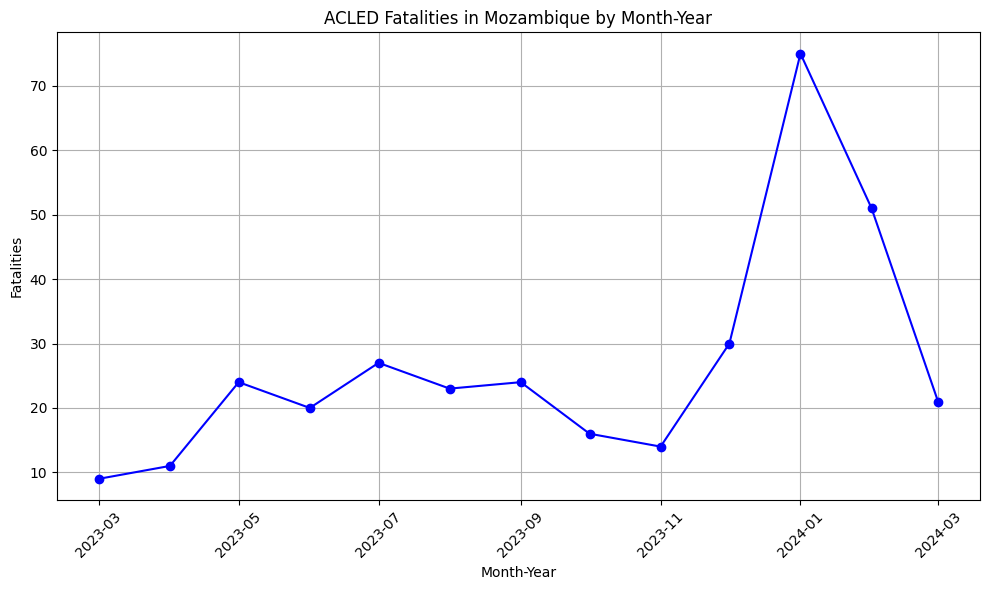

In [ ]:
fatalities_grouped_sortedf = pd.read_csv(f"{filenamenew}_grouped.csv")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(fatalities_grouped_sorted['date'], fatalities_grouped_sorted['fatalities'], marker='o', linestyle='-', color='blue')
plt.title('ACLED Fatalities in Mozambique by Month-Year')
plt.xlabel('Month-Year')
plt.ylabel('Fatalities')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

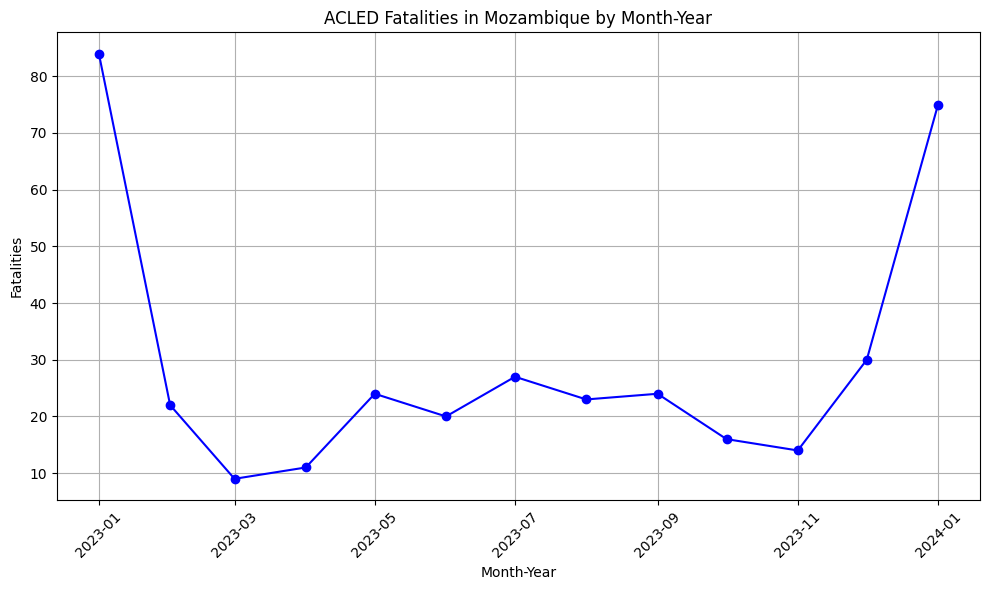

In [ ]:
# acled_df= download_acled_country('2023-01-01', '2024-03-30', 'Ukraine')
# data = pd.read_csv(f'/content/{acled_df}')

data = pd.read_csv(f'/content/ACLED_2023-01-01-2024-01-31.csv')
data = data[data['country'] == 'Mozambique']


grouped_data = data.groupby('event_date').agg({
    # 'time_precision': 'mean',
    # 'geo_precision': 'mean',
    'fatalities': 'sum'
}).reset_index()

# Counting the event types per date
event_type_counts_per_date = data.pivot_table(index='event_date', columns='event_type', aggfunc='size', fill_value=0)

# Merging the two DataFrames
final_per_date_df = pd.merge(grouped_data, event_type_counts_per_date, on='event_date')

# Save to CSV
file=acled_df.split(".csv")[0]
output_path_per_date = f'/content/{file}_aggregated.csv'
final_per_date_df.to_csv(output_path_per_date, index=False)

final_per_date_df.head()

fatalities_df = pd.read_csv(output_path_per_date)

fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# Extract 'month' and 'year' from 'event_date'
fatalities_df['month'] = fatalities_df['event_date'].dt.month
fatalities_df['year'] = fatalities_df['event_date'].dt.year

# Group by 'month' and 'year', then sum 'fatalities'
fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')
filenamenew=output_path_per_date.split(".csv")[0]
fatalities_grouped_sorted.to_csv(f"{filenamenew}_grouped.csv", index=False)

fatalities_grouped_sortedf = pd.read_csv(f"{filenamenew}_grouped.csv")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(fatalities_grouped_sorted['date'], fatalities_grouped_sorted['fatalities'], marker='o', linestyle='-', color='blue')
plt.title('ACLED Fatalities in Mozambique by Month-Year')
plt.xlabel('Month-Year')
plt.ylabel('Fatalities')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
selected_state_number = 541
selected_country = "Mozambique"
df_yearly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/23.01.23.12/", 100,selected_state_number, selected_country)
print(df_yearly)

df_monthly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/24.0.2/", 100,selected_state_number, selected_country)
print(df_monthly)

https://ucdpapi.pcr.uu.se/api/gedevents/23.01.23.12/?pagesize=100&Country=541
Mozambique_ucdp_yearly.csv
https://ucdpapi.pcr.uu.se/api/gedevents/24.0.2/?pagesize=100&Country=541
Mozambique_ucdp_monthly.csv


In [ ]:
monthly_df = pd.read_csv(f'/content/{df_monthly}')
yearly_df = pd.read_csv(f'/content/{df_yearly}')

# Convert 'date_start' in monthly_df to datetime to facilitate extraction
monthly_df['date_start'] = pd.to_datetime(monthly_df['date_start'])

# Extract January 2024 records
jan_2024_records = monthly_df[monthly_df['date_start'].dt.strftime('%Y-%m') == '2024-01']

# Append the January 2024 records to the yearly dataframe
yearly_df_updated = pd.concat([yearly_df, jan_2024_records], ignore_index=True)


country=df_yearly.split("_")[0]
output_filepath = f'/content/{country}_ucdp_merged.csv'
yearly_df_updated.to_csv(output_filepath, index=False)

In [ ]:
csv_data = pd.read_csv(output_filepath)

csv_data['date_start'] = pd.to_datetime(csv_data['date_start'], dayfirst=True)

# Extracting year and month from the 'date_start' column
csv_data['year_month'] = csv_data['date_start'].dt.to_period('M')

# Grouping by the new 'year_month' column and summing up the 'best deaths' column
monthly_deaths_csv = csv_data.groupby('year_month')['best'].sum().reset_index()

# Converting 'year_month' back to datetime for plotting
monthly_deaths_csv['year_month'] = monthly_deaths_csv['year_month'].dt.to_timestamp()

ucdp_newfile=output_filepath.split(".csv")[0]
monthly_deaths_csv.to_csv(f"{ucdp_newfile}_grouped.csv", index=False)

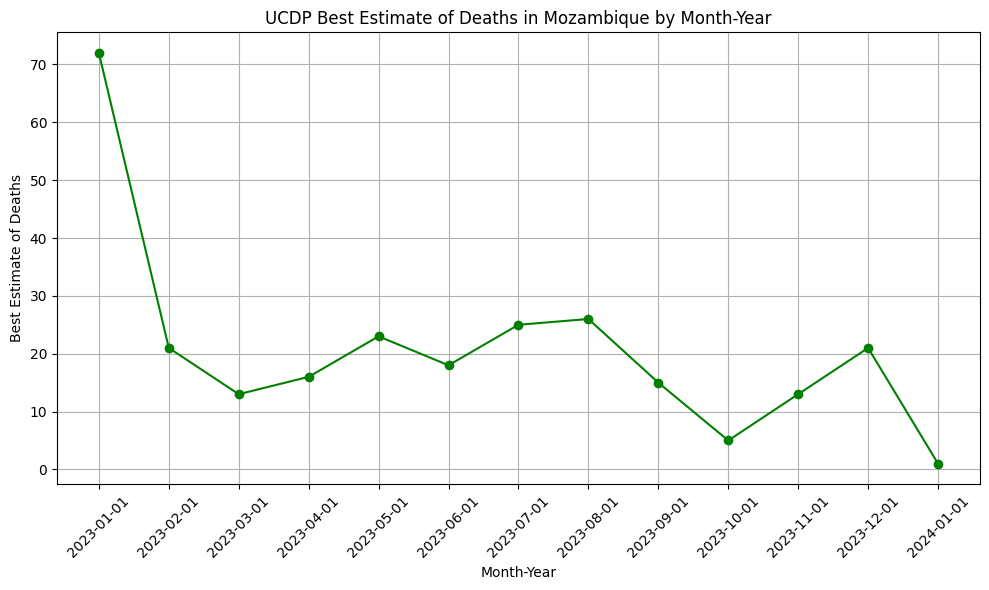

In [ ]:
monthly_deaths_csv = pd.read_csv(f"{ucdp_newfile}_grouped.csv")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(monthly_deaths_csv['year_month'], monthly_deaths_csv['best'], marker='o', linestyle='-', color='green')
plt.title('UCDP Best Estimate of Deaths in Mozambique by Month-Year')
plt.xlabel('Month-Year')
plt.ylabel('Best Estimate of Deaths')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
# # First part: ACLED Data Processing and Plotting
# acled_df = pd.read_csv('/content/mozam_acled_data_download_2024_03_grouped.csv')
# acled_df['month_year'] = pd.to_datetime(acled_df['month'] + ' ' + acled_df['year'].astype(str))
# acled_df_sorted = acled_df.sort_values(by='month_year')
# observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]
# forecast = acled_df_sorted[acled_df_sorted['total_observed'] == 0]
# first_zero_observed_month = acled_df_sorted[acled_df_sorted['total_observed'] == 0]['month_year'].min()
# one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)
# df_filtered_observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]

# # Second part: ViEWS Data Loading and Filtering
# views_df = pd.read_csv('/content/MOZ_sb_views_data_download_2024_03.csv')  # Update this path
# views_df['date'] = pd.to_datetime(views_df[['year', 'month']].assign(DAY=1))
# views_df = views_df[views_df['date'] <= '2024-08-01']

# # Combined Plotting
# plt.figure(figsize=(14, 8))

# # ACLED Data Plotting
# before_first_zero_forecast = acled_df_sorted[acled_df_sorted['month_year'] < first_zero_observed_month]
# after_first_zero_forecast = acled_df_sorted[acled_df_sorted['month_year'] >= one_month_before_first_zero]
# plt.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], label='Total Forecast (ACLED)', color='green', linestyle='-')
# plt.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], color='green', linestyle='--')
# plt.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], label='Total Observed (ACLED)', color='orange', linestyle='-')

# # ViEWS Data Plotting
# plt.plot(views_df['date'], views_df['main_mean'], label='Main Mean (ViEWS)', linestyle='--', color='blue')

# # Formatting
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
# plt.gcf().autofmt_xdate()  # Rotation
# plt.title('Combined Time Series for Mozambique (ACLED, ViEWS, Conflict Forecast, UCDP, ACLED)')
# plt.xlabel('Month-Year')
# plt.ylabel('Value')
# plt.legend()
# plt.tight_layout()

# plt.show()

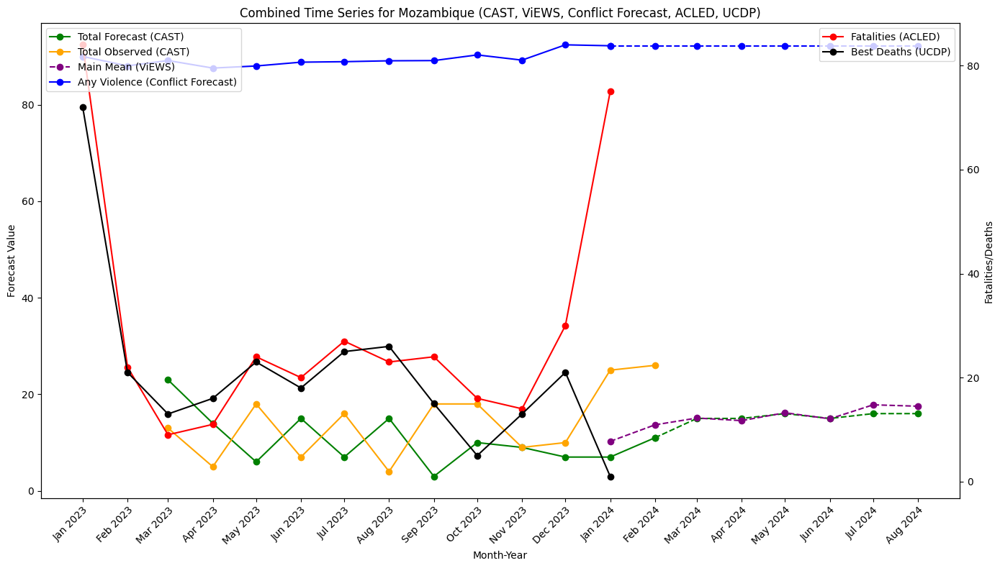

In [ ]:
# 1) CAST
# acled_df = pd.read_csv('/content/mozam_acled_data_download_2024_03_grouped.csv')
acled_df = pd.read_csv(f"/content/{country}_cast_grouped.csv")
acled_df['month_year'] = pd.to_datetime(acled_df['month'] + ' ' + acled_df['year'].astype(str))
acled_df_sorted = acled_df.sort_values(by='month_year')
observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]
forecast = acled_df_sorted[acled_df_sorted['total_observed'] == 0]
first_zero_observed_month = acled_df_sorted[acled_df_sorted['total_observed'] == 0]['month_year'].min()
one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)
df_filtered_observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]

# 2) ViEWS Data
# views_df = pd.read_csv('/content/MOZ_sb_views_data_download_2024_03.csv')
views_df = pd.read_csv(f'/content/{viewsdf}')
views_df['date'] = pd.to_datetime(views_df[['year', 'month']].assign(DAY=1))
views_df = views_df[views_df['date'] <= '2024-08-01']

# 3) Conflict Forecast
# conflict_forecast_df = pd.read_csv('/content/MOZ_conflictforecast_data_download_2024_03.csv')
conflict_forecast_df = pd.read_csv(f'/content/{cf_df}')
data = conflict_forecast_df

# Convert 'year' and 'month' into a datetime format to find the latest month
data['date'] = pd.to_datetime(data.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))

# Identify the row with the latest date
latest_row = data[data['date'] == data['date'].max()]

# Extract values to be duplicated into the upcoming months
latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()

# Create new rows for the next 12 months with the same values
new_rows = []
for m in range(1, 8):
    new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
    new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
    new_row = latest_values.copy()
    new_row.update({'year': new_year, 'month': new_month})
    new_rows.append(new_row)

# Convert the list of dictionaries to a DataFrame and append it to the original DataFrame
new_rows_df = pd.DataFrame(new_rows)
extended_data = pd.concat([data, new_rows_df], ignore_index=True)

# Optional: Remove the 'date' column if no longer needed, or update it with correct dates
extended_data.drop('date', axis=1, inplace=True)
data_combined = extended_data

# Assuming 'data_combined' is your DataFrame with original and extended data
data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])

# Find the index where the extended data starts
extended_start_index = len(data)  # 'data' is the original dataset before adding the 12 months

# 4) ACLED
# data_path = '/content/mozambi .ue_aggregated_per_month.csv'
data = pd.read_csv(f"{filenamenew}_grouped.csv")
data['date'] = pd.to_datetime(data['date'], dayfirst=True)
data_sorted = data.sort_values('date')

# 5) UCDP
# csv_path = '/content/UCDP_Mozambique_filtered.csv'
csv_data = pd.read_csv(output_filepath)
csv_data['date_start'] = pd.to_datetime(csv_data['date_start'], dayfirst=True)
# Extracting year and month from the 'date_start' column
csv_data['year_month'] = csv_data['date_start'].dt.to_period('M')
# Grouping by the new 'year_month' column and summing up the 'best_death' column
monthly_deaths_csv = csv_data.groupby('year_month')['best'].sum().reset_index()
# Converting 'year_month' back to datetime for plotting
monthly_deaths_csv['year_month'] = monthly_deaths_csv['year_month'].dt.to_timestamp()

# # Combined Plotting
# plt.figure(figsize=(14, 8))

# # 1) CAST Data Plotting
# before_first_zero_forecast = acled_df_sorted[acled_df_sorted['month_year'] < first_zero_observed_month]
# after_first_zero_forecast = acled_df_sorted[acled_df_sorted['month_year'] >= one_month_before_first_zero]
# plt.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], marker='o',label='Total Forecast (CAST)', color='green', linestyle='-')
# plt.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], marker='o',color='green', linestyle='--')
# plt.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], marker='o',label='Total Observed (CAST)', color='orange', linestyle='-')

# # 2) ViEWS Data Plotting
# plt.plot(views_df['date'], views_df['main_mean'], label='Main Mean (ViEWS)', marker='o', linestyle='--', color='pink')

# # 3) Conflict Forecast Data Plotting

# # Plot for Any Violence Best Model
# plt.plot(data_combined['date'][:extended_start_index], data_combined['anyviolence_best_model'][:extended_start_index], label='Any Violence Best Model (Conflict Forecast)', marker='o',color='blue')
# plt.plot(data_combined['date'][extended_start_index-1:], data_combined['anyviolence_best_model'][extended_start_index-1:], label='_nolegend_', marker='o', linestyle='--', color='blue')

# # # Plot for Armed Conflict Best Model
# # plt.plot(data_combined['date'][:extended_start_index], data_combined['armedconf_best_model'][:extended_start_index], label='Armed Conflict Best Model (Conflict Forecast)', marker='x')
# # plt.plot(data_combined['date'][extended_start_index-1:], data_combined['armedconf_best_model'][extended_start_index-1:], label='_nolegend_', marker='x', linestyle='--', color='orange')

# # # Plot for Intensity Best Model
# # plt.plot(data_combined['date'][:extended_start_index], data_combined['intensity_best_model'][:extended_start_index], label='Intensity Best Model (Conflict Forecast)', marker='s')
# # plt.plot(data_combined['date'][extended_start_index-1:], data_combined['intensity_best_model'][extended_start_index-1:], label='_nolegend_', marker='s', linestyle='--', color='green')

# # 4) ACLED Data Plotting
# plt.plot(data_sorted['date'], data_sorted['fatalities'], marker='o', label='Fatalities (ACLED)', linestyle='-', color='purple')

# # 5) UCDP Data Plotting
# plt.plot(monthly_deaths_csv['year_month'], monthly_deaths_csv['best'], marker='o',  label='Best Deaths (UCDP)', linestyle='-', color='black')

# # Formatting
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
# plt.gcf().autofmt_xdate()  # Rotate dates for better readability
# plt.title('Combined Time Series for Mozambique (CAST, ViEWS, Conflict Forecast, ACLED, UCDP)')
# plt.xlabel('Month-Year')
# plt.ylabel('Forecast Value')
# plt.legend()
# plt.tight_layout()

# plt.show()


plt.figure(figsize=(14, 8))

ax1 = plt.gca()  # primary axis
ax2 = ax1.twinx()  # secondary axis

# Plot on Primary Axis (Left Y-axis for Forecast Value)
ax1.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], marker='o', label='Total Forecast (CAST)', color='green', linestyle='-')
ax1.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], marker='o', color='green', linestyle='--')
ax1.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], marker='o', label='Total Observed (CAST)', color='orange', linestyle='-')
ax1.plot(views_df['date'], views_df['main_mean'], label='Main Mean (ViEWS)', marker='o', linestyle='--', color='purple')
ax1.plot(data_combined['date'][:extended_start_index], data_combined['anyviolence_best_model'][:extended_start_index], label='Any Violence (Conflict Forecast)', marker='o', color='blue')
ax1.plot(data_combined['date'][extended_start_index-1:], data_combined['anyviolence_best_model'][extended_start_index-1:], marker='o', linestyle='--', color='blue')

# Formatting Primary Axis
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Forecast Value')
ax1.tick_params(axis='y')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax1.xaxis.set_major_locator(mdates.MonthLocator())
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")  # Rotate dates

ax1.set_title('Combined Time Series for Mozambique (CAST, ViEWS, Conflict Forecast, ACLED, UCDP)')

# Plot on Secondary Axis (Right Y-axis for Fatalities/Deaths)
ax2.plot(data_sorted['date'], data_sorted['fatalities'], marker='o', label='Fatalities (ACLED)', linestyle='-', color='red')
ax2.plot(monthly_deaths_csv['year_month'], monthly_deaths_csv['best'], marker='o', label='Best Deaths (UCDP)', linestyle='-', color='black')

# Formatting Secondary Axis
ax2.set_ylabel('Fatalities/Deaths')
ax2.tick_params(axis='y')

# Handling legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines, labels, loc='upper left')
ax1.legend(lines2, labels2, loc='upper right')


plt.tight_layout()
plt.show()

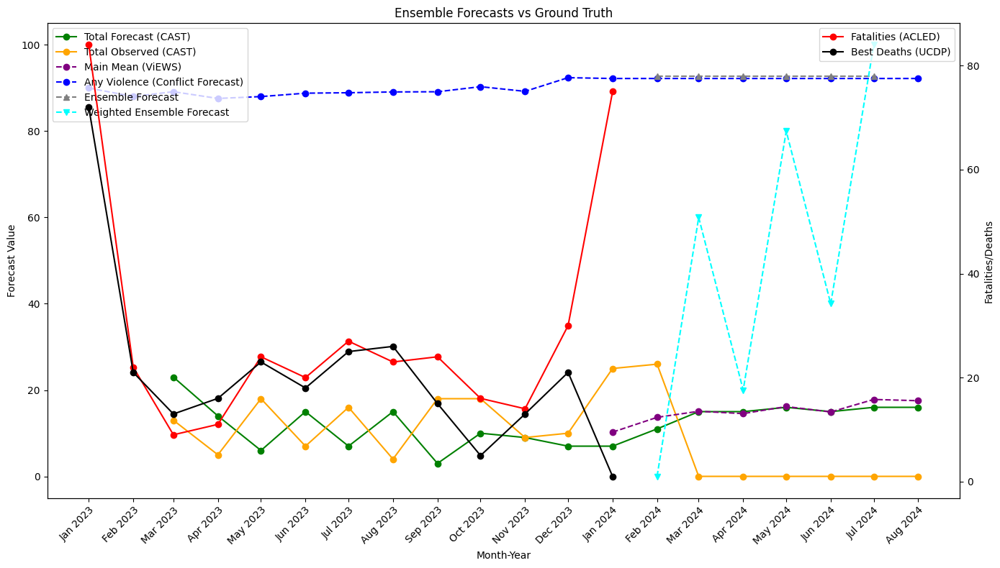

In [ ]:
# 1) CAST
# acled_df = pd.read_csv('/content/mozam_acled_data_download_2024_03_grouped.csv')
acled_df = pd.read_csv(f"/content/{country}_cast_grouped.csv")
acled_df['month_year'] = pd.to_datetime(acled_df['month'] + ' ' + acled_df['year'].astype(str))
acled_df_sorted = acled_df.sort_values(by='month_year')
observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]
forecast = acled_df_sorted[acled_df_sorted['total_observed'] == 0]
first_zero_observed_month = acled_df_sorted[acled_df_sorted['total_observed'] == 0]['month_year'].min()
one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)
df_filtered_observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]

# 2) ViEWS Data
# views_df = pd.read_csv('/content/MOZ_sb_views_data_download_2024_03.csv')
views_df = pd.read_csv(f'/content/{viewsdf}')
views_df['date'] = pd.to_datetime(views_df[['year', 'month']].assign(DAY=1))
views_df = views_df[views_df['date'] <= '2024-08-01']

# 3) Conflict Forecast
# conflict_forecast_df = pd.read_csv('/content/MOZ_conflictforecast_data_download_2024_03.csv')
conflict_forecast_df = pd.read_csv(f'/content/{cf_df}')
data = conflict_forecast_df

# Convert 'year' and 'month' into a datetime format to find the latest month
data['date'] = pd.to_datetime(data.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))

# Identify the row with the latest date
latest_row = data[data['date'] == data['date'].max()]

# Extract values to be duplicated into the upcoming months
latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()

# Create new rows for the next 12 months with the same values
new_rows = []
for m in range(1, 8):
    new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
    new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
    new_row = latest_values.copy()
    new_row.update({'year': new_year, 'month': new_month})
    new_rows.append(new_row)

# Convert the list of dictionaries to a DataFrame and append it to the original DataFrame
new_rows_df = pd.DataFrame(new_rows)
extended_data = pd.concat([data, new_rows_df], ignore_index=True)

# Optional: Remove the 'date' column if no longer needed, or update it with correct dates
extended_data.drop('date', axis=1, inplace=True)
data_combined = extended_data

# Assuming 'data_combined' is your DataFrame with original and extended data
data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])

# Find the index where the extended data starts
extended_start_index = len(data)  # 'data' is the original dataset before adding the 12 months

# 4) ACLED
# data_path = '/content/mozambi .ue_aggregated_per_month.csv'
data = pd.read_csv(f"{filenamenew}_grouped.csv")
data['date'] = pd.to_datetime(data['date'], dayfirst=True)
data_sorted = data.sort_values('date')

# 5) UCDP
# csv_path = '/content/UCDP_Mozambique_filtered.csv'
csv_data = pd.read_csv(output_filepath)
csv_data['date_start'] = pd.to_datetime(csv_data['date_start'], dayfirst=True)
# Extracting year and month from the 'date_start' column
csv_data['year_month'] = csv_data['date_start'].dt.to_period('M')
# Grouping by the new 'year_month' column and summing up the 'best_death' column
monthly_deaths_csv = csv_data.groupby('year_month')['best'].sum().reset_index()
# Converting 'year_month' back to datetime for plotting
monthly_deaths_csv['year_month'] = monthly_deaths_csv['year_month'].dt.to_timestamp()

# 6) Simple and Weighted Ensemble Forecast
ensemble_data = pd.read_csv("/content/simpleandweightedforecast_2april.csv")
ensemble_data['date'] = pd.to_datetime(ensemble_data[['year', 'month']].assign(DAY=1))
ensemble_data = ensemble_data[ensemble_data['C-name(GeoB)'] == 'Mozambique']


ensemble_data['ensemble_forecast'] *= 100
ensemble_data['weighted_ensemble_forecast'] *= 100

plt.figure(figsize=(14, 8))

ax1 = plt.gca()  # primary axis for Forecast Value
ax2 = ax1.twinx()  # secondary axis for Fatalities/Deaths

# Plot CAST, ViEWS, and Conflict Forecast data on Primary Axis
ax1.plot(acled_df_sorted['month_year'], acled_df_sorted['total_forecast'], marker='o', label='Total Forecast (CAST)', color='green', linestyle='-')
ax1.plot(acled_df_sorted['month_year'], acled_df_sorted['total_observed'], marker='o', label='Total Observed (CAST)', color='orange', linestyle='-')
ax1.plot(views_df['date'], views_df['main_mean'], label='Main Mean (ViEWS)', marker='o', linestyle='--', color='purple')
ax1.plot(data_combined['date'], data_combined['anyviolence_best_model'], label='Any Violence (Conflict Forecast)', marker='o', color='blue', linestyle='--')

# Plot Ensemble Forecasts on Primary Axis
ax1.plot(ensemble_data['date'], ensemble_data['ensemble_forecast'], label='Ensemble Forecast', linestyle='--', color='grey', marker='^')
ax1.plot(ensemble_data['date'], ensemble_data['weighted_ensemble_forecast'], label='Weighted Ensemble Forecast', linestyle='--', color='cyan', marker='v')

# Plot ACLED and UCDP data on Secondary Axis
ax2.plot(data_sorted['date'], data_sorted['fatalities'], marker='o', label='Fatalities (ACLED)', linestyle='-', color='red')
ax2.plot(monthly_deaths_csv['year_month'], monthly_deaths_csv['best'], marker='o', label='Best Deaths (UCDP)', linestyle='-', color='black')

# Formatting Primary Axis
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Forecast Value')
ax1.tick_params(axis='y')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Formatting Secondary Axis
ax2.set_ylabel('Fatalities/Deaths')
ax2.tick_params(axis='y')

# Handling Legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines, labels, loc='upper left')
ax2.legend(lines2, labels2, loc='upper right')

ax1.set_title('Ensemble Forecasts vs Ground Truth')

plt.tight_layout()
plt.show()

To validate the simple and weighted ensemble forecasts against ground truth data like ACLED and UCDP, which are raw numbers (fatalities/deaths), you need to convert these raw numbers into a comparable scale. Since the forecasts are on a 0 to 100% scale, you should consider converting the ground truth data into a percentage of the maximum reported value over the time period you're considering. Here's a method to achieve that:

**Find the Maximum Value:** Determine the maximum value recorded for the ground truth data in the time series.

**Calculate the Percentage:** For each time point, calculate the fatalities as a percentage of this maximum value.

In [ ]:
data_sorted

,month,year,fatalities,date
0,1,2023,84,2023-01-01
1,2,2023,22,2023-02-01
2,3,2023,9,2023-03-01
3,4,2023,11,2023-04-01
4,5,2023,24,2023-05-01
5,6,2023,20,2023-06-01
6,7,2023,27,2023-07-01
7,8,2023,23,2023-08-01
8,9,2023,24,2023-09-01
9,10,2023,16,2023-10-01


In [ ]:
csv_data

,id,relid,year,active_year,code_status,type_of_violence,conflict_dset_id,conflict_new_id,conflict_name,dyad_dset_id,...,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnoa,gwnob,year_month
0,459922,AFG-2023-3-973-1,2023,True,Clear,3,234,506,IS - Civilians,234,...,0,0,1,0,1,1,1,NaN,NaN,2023-01
1,461788,MZM-2023-1-16022-0,2023,True,Clear,1,14845,14845,Mozambique: Islamic State,16022,...,1,1,0,0,2,2,2,541.0,NaN,2023-01
2,461790,MZM-2023-1-16022-1,2023,True,Clear,1,14845,14845,Mozambique: Islamic State,16022,...,3,6,0,0,9,12,9,541.0,NaN,2023-01
3,461798,MZM-2023-1-16022-2.1,2023,True,Clear,1,14845,14845,Mozambique: Islamic State,16022,...,0,0,0,0,0,3,0,541.0,NaN,2023-01
4,461800,MZM-2023-1-16022-2.2,2023,True,Clear,1,14845,14845,Mozambique: Islamic State,16022,...,0,0,0,0,0,3,0,541.0,NaN,2023-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,507138,MZM-2023-1-16022-51,2023,True,Check,1,14845,14845,Mozambique: Islamic State,16022,...,3,0,0,0,3,3,0,541.0,NaN,2023-12
97,507160,AFG-2023-3-973-432,2023,True,Clear,3,234,506,IS - Civilians,234,...,0,0,2,0,2,2,2,NaN,NaN,2023-11
98,507161,MZM-2023-1-16022-50,2023,True,Check,1,14845,14845,Mozambique: Islamic State,16022,...,1,0,0,0,1,1,0,541.0,NaN,2023-12
99,508165,MZM-2023-1-722-17,2023,False,Clear,1,332,332,Mozambique: Government,722,...,0,0,0,0,0,3,0,541.0,NaN,2023-10


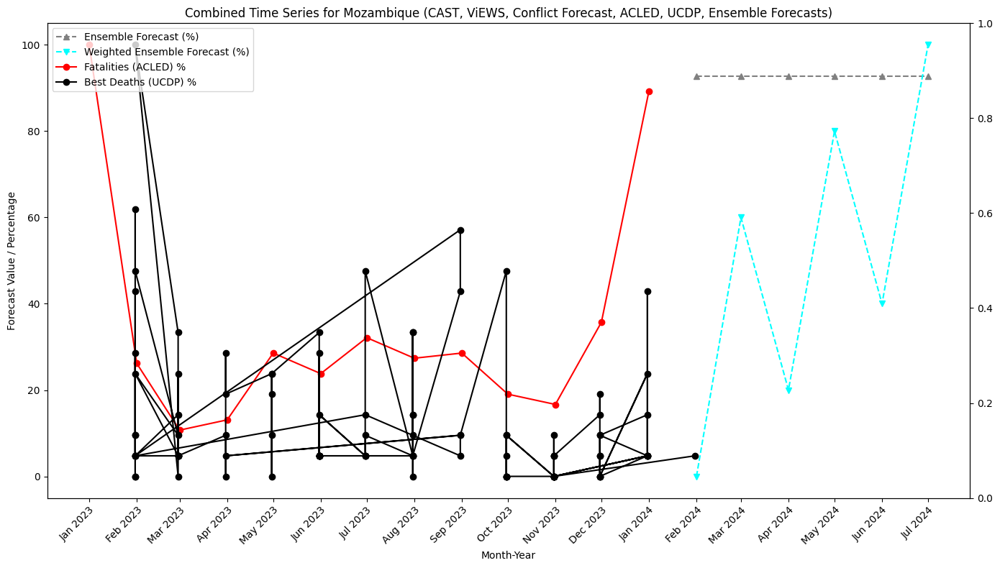

In [ ]:
# Scale ACLED and UCDP data to percentages
max_fatalities_acled = data_sorted['fatalities'].max()
data_sorted['fatalities_percentage'] = (data_sorted['fatalities'] / max_fatalities_acled) * 100
max_deaths_ucdp = csv_data['best'].max()
csv_data['deaths_percentage'] = (csv_data['best'] / max_deaths_ucdp) * 100
csv_data

# Load and prepare ensemble data
ensemble_data = pd.read_csv("/content/simpleandweightedforecast_2april.csv")
ensemble_data['date'] = pd.to_datetime(ensemble_data[['year', 'month']].assign(DAY=1))
ensemble_data = ensemble_data[ensemble_data['C-name(GeoB)'] == 'Mozambique']
ensemble_data['ensemble_forecast'] *= 100
ensemble_data['weighted_ensemble_forecast'] *= 100

# Plotting
plt.figure(figsize=(14, 8))
ax1 = plt.gca()  # primary axis for Forecast Value
ax2 = ax1.twinx()  # secondary axis for Fatalities/Deaths as percentages

# Plot Ensemble Forecasts on Primary Axis
ax1.plot(ensemble_data['date'], ensemble_data['ensemble_forecast'], label='Ensemble Forecast (%)', linestyle='--', color='grey', marker='^')
ax1.plot(ensemble_data['date'], ensemble_data['weighted_ensemble_forecast'], label='Weighted Ensemble Forecast (%)', linestyle='--', color='cyan', marker='v')

# Plot Scaled ACLED and UCDP data on Primary Axis
ax1.plot(data_sorted['date'], data_sorted['fatalities_percentage'], label='Fatalities (ACLED) %', linestyle='-', color='red', marker='o')
ax1.plot(csv_data['year_month'], csv_data['deaths_percentage'], label='Best Deaths (UCDP) %', linestyle='-', color='black', marker='o')

# Formatting Primary Axis
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Forecast Value / Percentage')
ax1.tick_params(axis='y')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Secondary axis is not needed anymore as we converted fatalities/deaths to percentage
# If you still want to plot something on the secondary axis, adjust accordingly

# Handling Legends
lines, labels = ax1.get_legend_handles_labels()
ax1.legend(lines, labels, loc='upper left')

ax1.set_title('Combined Time Series for Mozambique (CAST, ViEWS, Conflict Forecast, ACLED, UCDP, Ensemble Forecasts)')

plt.tight_layout()
plt.show()

In [ ]:
# Load the datasets based on the user's provided paths and scripts
acled_df = pd.read_csv('/content/mozam_acled_data_download_2024_03_grouped.csv')
acled_df['month_year'] = pd.to_datetime(acled_df['month'] + ' ' + acled_df['year'].astype(str))
acled_df_sorted = acled_df.sort_values(by='month_year')
df_filtered_observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]

views_df = pd.read_csv('/content/MOZ_sb_views_data_download_2024_03.csv')
views_df['date'] = pd.to_datetime(views_df[['year', 'month']].assign(DAY=1))
views_df_filtered = views_df[views_df['date'] <= '2024-08-01']

conflict_forecast_df = pd.read_csv('/content/MOZ_conflictforecast_data_download_2024_03.csv')
conflict_forecast_df['date'] = pd.to_datetime(conflict_forecast_df.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))
latest_row = conflict_forecast_df[conflict_forecast_df['date'] == conflict_forecast_df['date'].max()]
latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()
new_rows = []
for m in range(1, 8):
    new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
    new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
    new_row = latest_values.copy()
    new_row.update({'year': new_year, 'month': new_month})
    new_rows.append(new_row)
new_rows_df = pd.DataFrame(new_rows)
extended_data = pd.concat([conflict_forecast_df, new_rows_df], ignore_index=True)
extended_data.drop('date', axis=1, inplace=True)
data_combined = extended_data.copy()
data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])
extended_start_index = len(conflict_forecast_df)

acled_aggregated_data = pd.read_csv('/content/mozambique_aggregated_per_month.csv')
acled_aggregated_data['event_date'] = pd.to_datetime(acled_aggregated_data['event_date'], dayfirst=True)
acled_aggregated_sorted = acled_aggregated_data.sort_values('event_date')

ucdp_data = pd.read_csv('/content/UCDP_Mozambique_filtered.csv')
ucdp_data['date_start'] = pd.to_datetime(ucdp_data['date_start'], dayfirst=True)
ucdp_data['year_month'] = ucdp_data['date_start'].dt.to_period('M')
monthly_deaths_ucdp = ucdp_data.groupby('year_month')['best_death'].sum().reset_index()
monthly_deaths_ucdp['year_month'] = monthly_deaths_ucdp['year_month'].dt.to_timestamp()

# Combine into a single DataFrame for simplicity in handling the output
results = {
    "ACLED Filtered Observed": df_filtered_observed.head(),
    "ViEWS Filtered": views_df_filtered.head(),
    "Extended Conflict Forecast": data_combined.head(),
    "ACLED Aggregated Sorted": acled_aggregated_sorted.head(),
    "UCDP Monthly Deaths": monthly_deaths_ucdp.head()
}

results

{'ACLED Filtered Observed':        country  month  year  total_forecast  total_observed month_year
 11  Mozambique  March  2023              23            13.0 2023-03-01
 0   Mozambique  April  2023              14             5.0 2023-04-01
 13  Mozambique    May  2023               6            18.0 2023-05-01
 9   Mozambique   June  2023              15             7.0 2023-06-01
 7   Mozambique   July  2023               7            16.0 2023-07-01,
 'ViEWS Filtered':    country_id  month_id        name  gwcode isoab  year  month  \
 0         162       529  Mozambique     541   MOZ  2024      1   
 1         162       530  Mozambique     541   MOZ  2024      2   
 2         162       531  Mozambique     541   MOZ  2024      3   
 3         162       532  Mozambique     541   MOZ  2024      4   
 4         162       533  Mozambique     541   MOZ  2024      5   
 
    surrogate_mean_ch  surrogate_mean_nch_ln  main_dich  ...  \
 0            14.1175                 0.6121     0.188

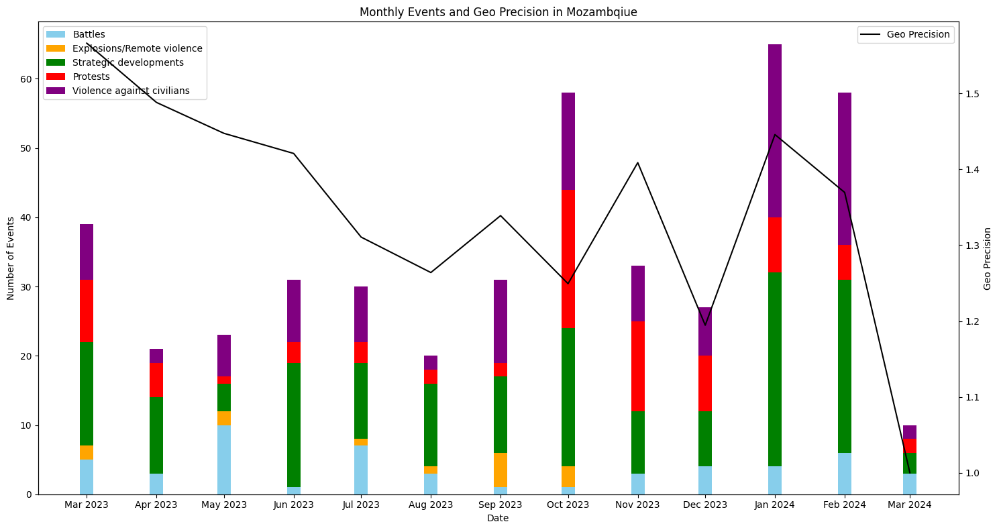

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Load the previously saved per-date aggregated data for Ukraine
file_path_per_date = '/content/mozambique_aggregated_per_date.csv'
ukraine_data_per_date = pd.read_csv(file_path_per_date)

# Convert 'event_date' to datetime format
ukraine_data_per_date['event_date'] = pd.to_datetime(ukraine_data_per_date['event_date'])

# Resample the data by month and sum up the event types and fatalities
ukraine_data_per_month = ukraine_data_per_date.set_index('event_date').resample('M').agg({
    'fatalities': 'sum',
    'Battles': 'sum',
    'Explosions/Remote violence': 'sum',
    'Strategic developments': 'sum',
    'Protests': 'sum',
    'Violence against civilians': 'sum',
    'time_precision': 'mean',
    'geo_precision': 'mean',

}).reset_index()

# Set 'event_date' as the index for plotting
ukraine_data_per_month['event_date'] = ukraine_data_per_month['event_date'].apply(lambda dt: dt.replace(day=1))
ukraine_data_per_month.set_index('event_date', inplace=True)
# ukraine_data_per_month
# Define the color for each event type
colors = ['skyblue', 'orange', 'green', 'red', 'purple']

# Start plotting the stacked bar chart
fig, ax1 = plt.subplots(figsize=(15, 8))

# Plotting the stacked bars for each event type
bottom = np.zeros(len(ukraine_data_per_month))
for idx, column in enumerate(['Battles', 'Explosions/Remote violence', 'Strategic developments', 'Protests', 'Violence against civilians']):
    ax1.bar(ukraine_data_per_month.index, ukraine_data_per_month[column], bottom=bottom, color=colors[idx], label=column, width=6)
    bottom += ukraine_data_per_month[column].values

# Plotting the line for total fatalities on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ukraine_data_per_month.index, ukraine_data_per_month['geo_precision'], color='black', label='Geo Precision')

# Formatting the plot

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Events')
ax2.set_ylabel('Geo Precision')
ax1.set_title('Monthly Events and Geo Precision in Mozambqiue')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Format the x-axis to show month and year
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


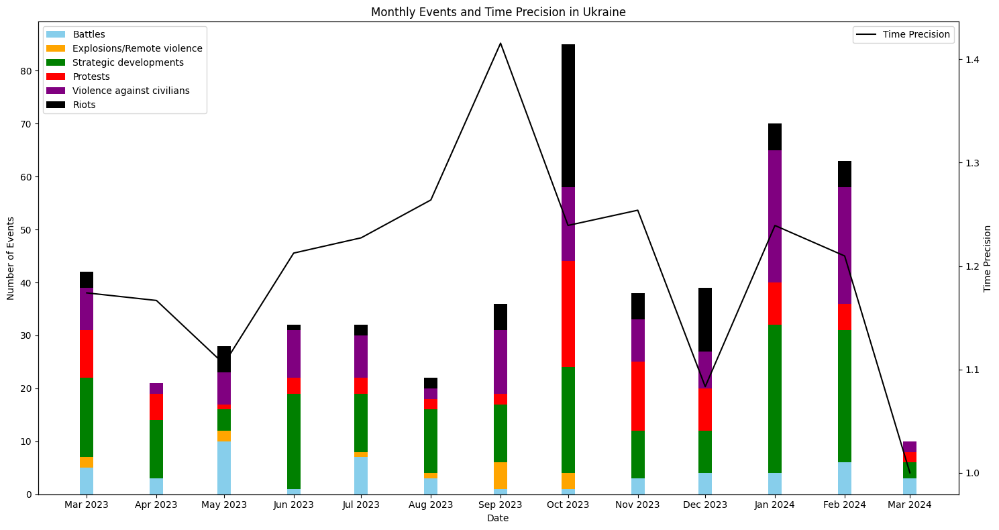

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Load the previously saved per-date aggregated data for Ukraine
file_path_per_date = '/content/mozambique_aggregated_per_date.csv'
ukraine_data_per_date = pd.read_csv(file_path_per_date)

# Convert 'event_date' to datetime format
ukraine_data_per_date['event_date'] = pd.to_datetime(ukraine_data_per_date['event_date'])

# Resample the data by month and sum up the event types and fatalities
ukraine_data_per_month = ukraine_data_per_date.set_index('event_date').resample('M').agg({
    'fatalities': 'sum',
    'Battles': 'sum',
    'Explosions/Remote violence': 'sum',
    'Strategic developments': 'sum',
    'Protests': 'sum',
    'Violence against civilians': 'sum',
    'Riots':'sum',
    'time_precision': 'mean',
    'geo_precision': 'mean',

}).reset_index()

# Set 'event_date' as the index for plotting
ukraine_data_per_month['event_date'] = ukraine_data_per_month['event_date'].apply(lambda dt: dt.replace(day=1))
ukraine_data_per_month.set_index('event_date', inplace=True)
# ukraine_data_per_month
# Define the color for each event type
colors = ['skyblue', 'orange', 'green', 'red', 'purple','black']

# Start plotting the stacked bar chart
fig, ax1 = plt.subplots(figsize=(15, 8))

# Plotting the stacked bars for each event type
bottom = np.zeros(len(ukraine_data_per_month))
for idx, column in enumerate(['Battles', 'Explosions/Remote violence', 'Strategic developments', 'Protests', 'Violence against civilians','Riots']):
    ax1.bar(ukraine_data_per_month.index, ukraine_data_per_month[column], bottom=bottom, color=colors[idx], label=column, width=6)
    bottom += ukraine_data_per_month[column].values

# Plotting the line for total fatalities on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ukraine_data_per_month.index, ukraine_data_per_month['time_precision'], color='black', label='Time Precision')

# Formatting the plot

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Events')
ax2.set_ylabel('Time Precision')
ax1.set_title('Monthly Events and Time Precision in Ukraine')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Format the x-axis to show month and year
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


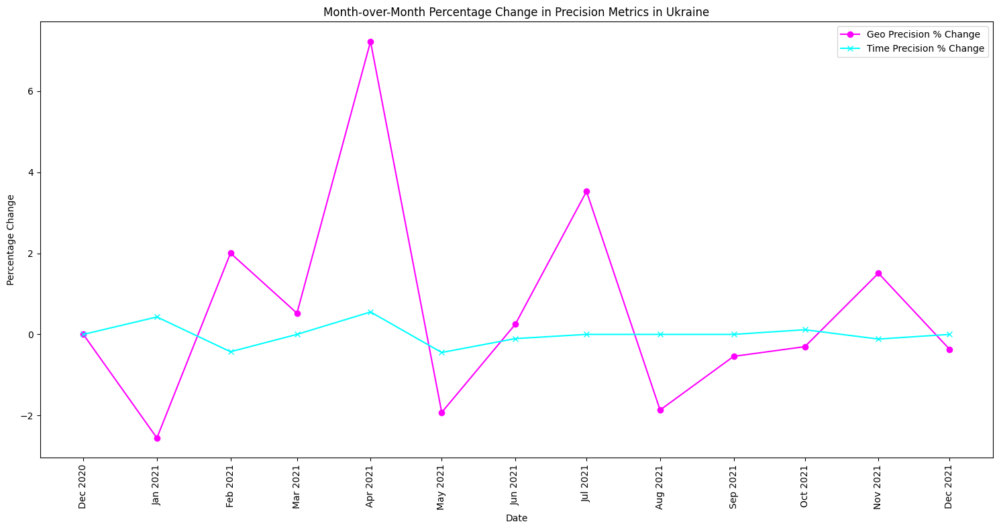

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Assuming the mozambique_data_per_month DataFrame is correctly loaded and processed as per the provided code,
# but I'll simulate a simplified version for demonstration.
file_path = '/content/2020-12-01-2021-12-31-Ukraine-ACLED_aggregated_per_month.csv'
mozambique_data = pd.read_csv(file_path)

# Convert 'event_date' to datetime format and set as index
mozambique_data['event_date'] = pd.to_datetime(mozambique_data['event_date']).dt.to_period('M').dt.to_timestamp()
mozambique_data.set_index('event_date', inplace=True)

# Calculate the month-over-month percentage change for precision metrics
mozambique_data['geo_precision_pct_change'] = mozambique_data['geo_precision'].pct_change().fillna(0) * 100
mozambique_data['time_precision_pct_change'] = mozambique_data['time_precision'].pct_change().fillna(0) * 100

# Plotting the precision metrics changes over time
fig, ax = plt.subplots(figsize=(15, 8))

ax.plot(mozambique_data.index, mozambique_data['geo_precision_pct_change'], label='Geo Precision % Change', marker='o', linestyle='-', color='magenta')
ax.plot(mozambique_data.index, mozambique_data['time_precision_pct_change'], label='Time Precision % Change', marker='x', linestyle='-', color='cyan')

ax.set_xlabel('Date')
ax.set_ylabel('Percentage Change')
ax.set_title('Month-over-Month Percentage Change in Precision Metrics in Ukraine')
ax.legend()

# Format the x-axis to show month and year
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

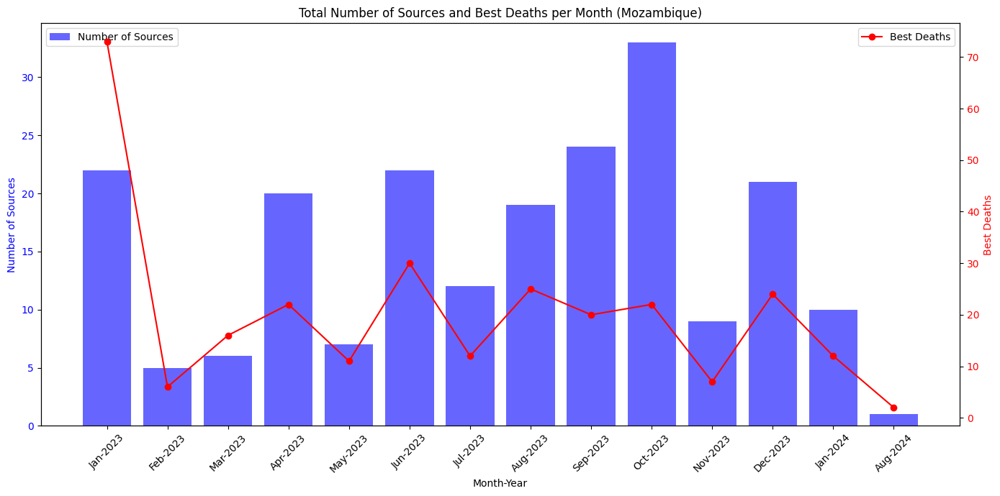

In [ ]:
file_path = '/content/UCDP_Mozambique_filtered.csv'
df = pd.read_csv(file_path)

df['date_start'] = pd.to_datetime(df['date_start'])
df['month_year'] = df['date_start'].dt.to_period('M')

grouped_summary_df = df.groupby('month_year').agg({
    'number_of_sources': 'sum',
    'best_death': 'sum'
}).reset_index()

grouped_summary_df['month_year_str'] = grouped_summary_df['month_year'].dt.strftime('%b-%Y')

fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot number_of_sources
ax1.bar(grouped_summary_df['month_year_str'], grouped_summary_df['number_of_sources'], color='blue', alpha=0.6, label='Number of Sources')
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Number of Sources', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_xticklabels(grouped_summary_df['month_year_str'], rotation=45)

# Create another y-axis for best_deaths
ax2 = ax1.twinx()
ax2.plot(grouped_summary_df['month_year_str'], grouped_summary_df['best_death'], color='red', label='Best Deaths', marker='o')
ax2.set_ylabel('Best Deaths', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Total Number of Sources and Best Deaths per Month (Mozambique)')
plt.tight_layout()

plt.show()

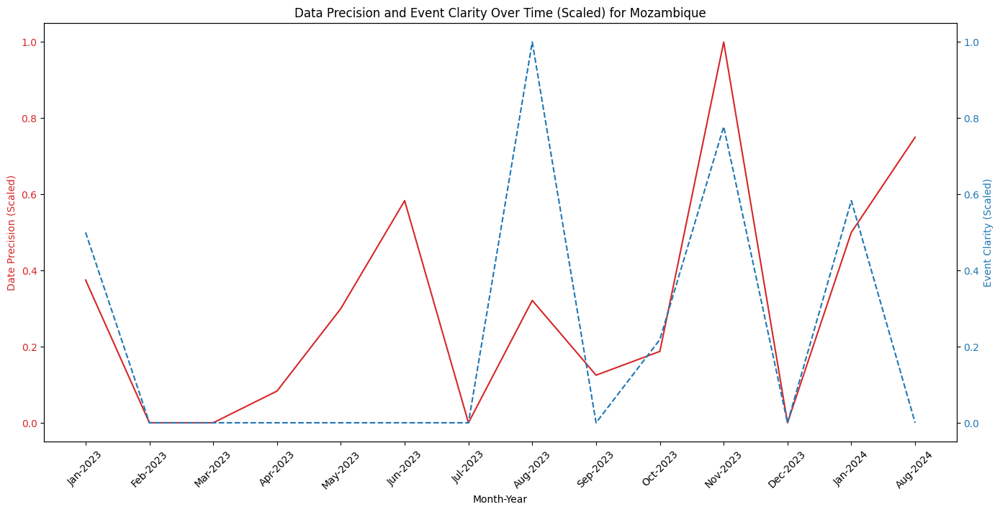

In [ ]:
#e summarize the dataset to get averages of date_prec and event_clarity per month_year
# (treating date_prec as a proxy for both time precision and data precision here for simplicity).
summary_df = df.groupby('month_year').agg({
    'date_prec': 'mean',  # Average time precision
    'event_clarity': 'mean',  # Average event precision
}).reset_index()

# Normalize date_prec and event_clarity to be on a similar scale for visualization purposes
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Scale the data
scaled_data = scaler.fit_transform(summary_df[['date_prec', 'event_clarity']])
scaled_df = pd.DataFrame(scaled_data, columns=['date_prec_scaled', 'event_clarity_scaled'])

# Merge scaled data back with the summary_df
summary_df = pd.concat([summary_df, scaled_df], axis=1)

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7))

# Primary axis for date_prec (time/data precision)
color = 'tab:red'
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Date Precision (Scaled)', color=color)
ax1.plot(summary_df['month_year'].dt.strftime('%b-%Y'), summary_df['date_prec_scaled'], color=color, label='Date Precision (Scaled)')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(summary_df['month_year'].dt.strftime('%b-%Y'), rotation=45)

# Secondary axis for event_clarity (event precision)
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Event Clarity (Scaled)', color=color)
ax2.plot(summary_df['month_year'].dt.strftime('%b-%Y'), summary_df['event_clarity_scaled'], color=color, linestyle='--', label='Event Clarity (Scaled)')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Data Precision and Event Clarity Over Time (Scaled) for Mozambique')
plt.show()

## 2) Ukraine

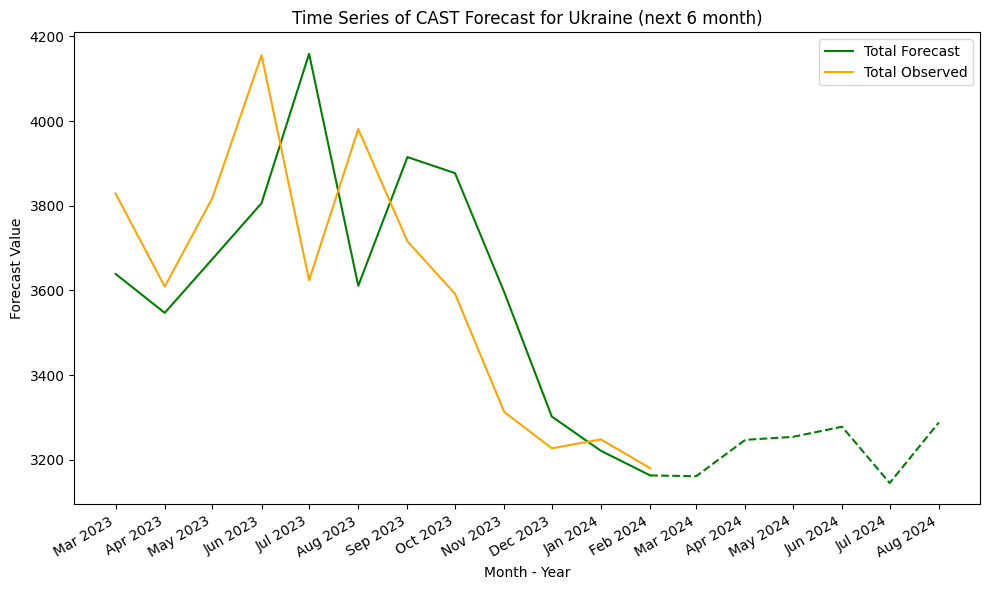

In [ ]:
country="Ukraine"
cast_data=get_cast_grouped(f"https://api.acleddata.com/cast/read?key=OcojFgHon56QHFtjOS9z&email=zakhtar@alumni.cmu.edu&country={country}")
df = pd.read_csv(f'/content/{country}_cast.csv')
df = df.groupby(['country', 'month', 'year'])['total_forecast','total_observed'].sum().reset_index()
df.to_csv(f"/content/{country}_cast_grouped.csv", index=False)

df = pd.read_csv(f"/content/{country}_cast_grouped.csv")

# Create a combined 'month_year' column for plotting
df['month_year'] = pd.to_datetime(df['month'] + ' ' + df['year'].astype(str))

# Sort by 'month_year' to ensure chronological order
df_sorted = df.sort_values(by='month_year')

# Split the data into observed (solid line) and forecast (dashed line)
observed = df_sorted[df_sorted['total_observed'] != 0]
forecast = df_sorted[df_sorted['total_observed'] == 0]


# Identify the first month with a zero in total observed to use as the cutoff for changing the line style
first_zero_observed_month = df_sorted[df_sorted['total_observed'] == 0]['month_year'].min()
one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)

# Filter out zeros from total observed before plotting to avoid dropping to 0
df_filtered_observed = df_sorted[df_sorted['total_observed'] != 0]

plt.figure(figsize=(10, 6))

# Plot total forecast data up to the first zero observed month as solid
before_first_zero_forecast = df_sorted[df_sorted['month_year'] < first_zero_observed_month]
plt.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], label='Total Forecast', color='green', linestyle='-')

# Plot total forecast data from the first zero observed month onward as dashed
after_first_zero_forecast = df_sorted[df_sorted['month_year'] >= one_month_before_first_zero]
plt.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], color='green', linestyle='--')

# Plot total observed data without zeros
plt.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], label='Total Observed', color='orange', linestyle='-')

# Formatting the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate() # Rotation

plt.title('Time Series of CAST Forecast for Ukraine (next 6 month)')
plt.xlabel('Month - Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.tight_layout()

plt.show()


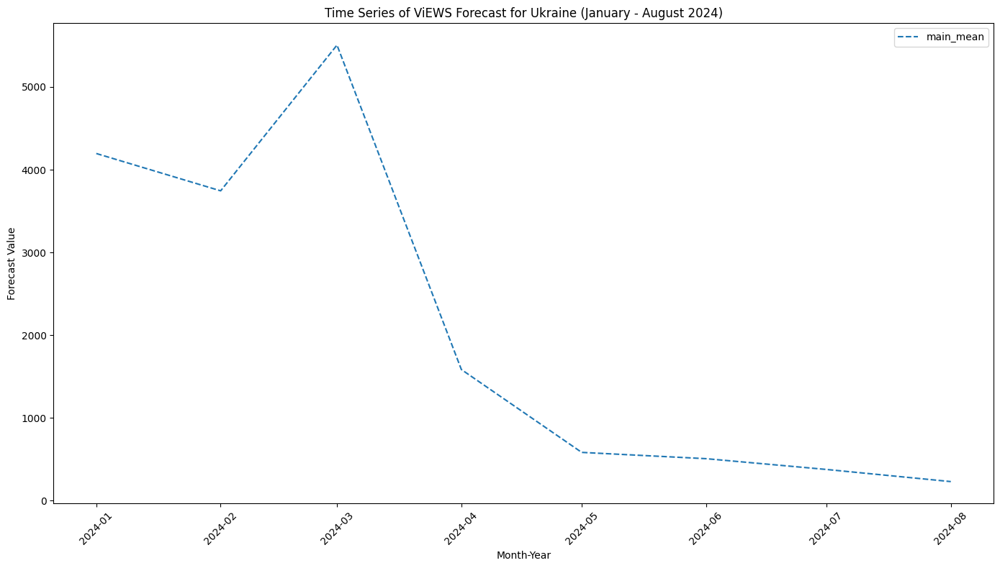

In [ ]:
viewsdf = get_views("https://api.viewsforecasting.org/fatalities002_2023_12_t01/cm/sb", "UKR")
file_path = f'/content/{viewsdf}'  # Make sure to update this path to your actual file location
data = pd.read_csv(file_path)

# Creating a 'date' column for easier plotting of time series
data['date'] = pd.to_datetime(data[['year', 'month']].assign(DAY=1))

data = data[data['date'] <= '2024-08-01']
# print(data)

# Selecting the relevant columns for the plot
columns_to_plot = [
    'main_mean'
]
# Plotting
plt.figure(figsize=(14, 8))
for col in columns_to_plot:
    plt.plot(data['date'], data[col], label=col, linestyle='--')

plt.title('Time Series of ViEWS Forecast for Ukraine (January - August 2024)')
plt.xlabel('Month-Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

      isocode  year  month  anyviolence_best_model
27326     UKR  2023      1               86.543495
27327     UKR  2023      2               85.815605
27328     UKR  2023      3               86.138603
27329     UKR  2023      4               87.383247
27330     UKR  2023      5               86.997002
27331     UKR  2023      6               86.435135
27332     UKR  2023      7               86.377892
27333     UKR  2023      8               86.571465
27334     UKR  2023      9               86.729004
27335     UKR  2023     10               86.531586
27336     UKR  2023     11               87.305817
27337     UKR  2023     12               87.372147
27338     UKR  2024      1               86.271637
      isocode  year  month  armedconf_best_model
27326     UKR  2023      1             85.366707
27327     UKR  2023      2             86.297516
27328     UKR  2023      3             85.972511
27329     UKR  2023      4             85.377205
27330     UKR  2023      5             85

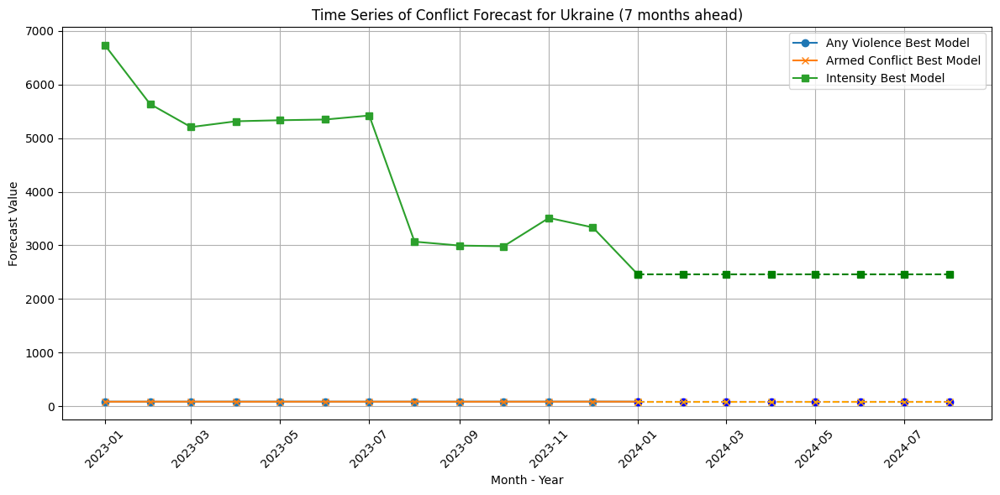

In [ ]:
cf_df= get_conflictforecast("https://api.backendless.com/C177D0DC-B3D5-818C-FF1E-1CC11BC69600/C5F2917E-C2F6-4F7D-9063-69555274134E/services/fileService/get-file-listing?date=01-2024","UKR")

file_path = f'/content/{cf_df}'
data = pd.read_csv(file_path)

# Convert 'year' and 'month' into a datetime format to find the latest month
data['date'] = pd.to_datetime(data.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))

# Identify the row with the latest date
latest_row = data[data['date'] == data['date'].max()]

# Extract values to be duplicated into the upcoming months
latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()

# Create new rows for the next 12 months with the same values
new_rows = []
for m in range(1, 8):
    new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
    new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
    new_row = latest_values.copy()
    new_row.update({'year': new_year, 'month': new_month})
    new_rows.append(new_row)

# Convert the list of dictionaries to a DataFrame and append it to the original DataFrame
new_rows_df = pd.DataFrame(new_rows)
extended_data = pd.concat([data, new_rows_df], ignore_index=True)

# Optional: Remove the 'date' column if no longer needed, or update it with correct dates
extended_data.drop('date', axis=1, inplace=True)
data_combined = extended_data

# Assuming 'data_combined' is your DataFrame with original and extended data
data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])

# Find the index where the extended data starts
extended_start_index = len(data)  # 'data' is the original dataset before adding the 12 months

# Plotting
plt.figure(figsize=(12, 6))

# Plot for Any Violence Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['anyviolence_best_model'][:extended_start_index], label='Any Violence Best Model', marker='o')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['anyviolence_best_model'][extended_start_index-1:], label='_nolegend_', marker='o', linestyle='--', color='blue')

# Plot for Armed Conflict Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['armedconf_best_model'][:extended_start_index], label='Armed Conflict Best Model', marker='x')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['armedconf_best_model'][extended_start_index-1:], label='_nolegend_', marker='x', linestyle='--', color='orange')

# Plot for Intensity Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['intensity_best_model'][:extended_start_index], label='Intensity Best Model', marker='s')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['intensity_best_model'][extended_start_index-1:], label='_nolegend_', marker='s', linestyle='--', color='green')

plt.title('Time Series of Conflict Forecast for Ukraine (7 months ahead)')
plt.xlabel('Month - Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

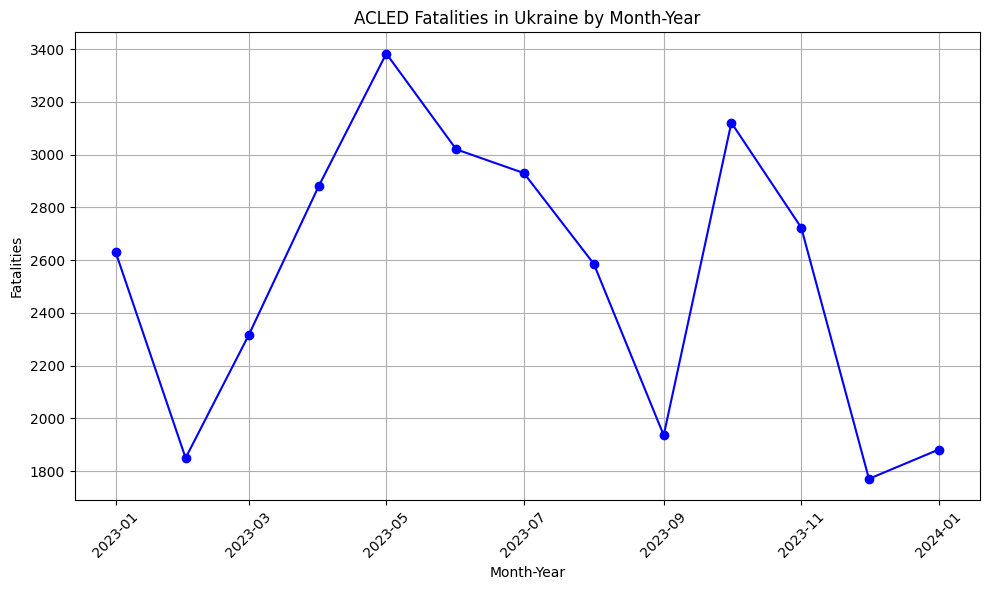

In [ ]:
# acled_df= download_acled_country('2023-01-01', '2024-03-30', 'Ukraine')
# data = pd.read_csv(f'/content/{acled_df}')

data = pd.read_csv(f'/content/ACLED_2023-01-01-2024-01-31.csv')
fatalities_df = data[data['country'] == 'Ukraine']

# grouped_data = data.groupby('event_date').agg({
#     # 'time_precision': 'mean',
#     # 'geo_precision': 'mean',
#     'fatalities': 'sum'
# }).reset_index()

# # Counting the event types per date
# event_type_counts_per_date = data.pivot_table(index='event_date', columns='event_type', aggfunc='size', fill_value=0)

# # Merging the two DataFrames
# final_per_date_df = pd.merge(grouped_data, event_type_counts_per_date, on='event_date')

# # Save to CSV
# file=acled_df.split(".csv")[0]
# output_path_per_date = f'/content/{file}_aggregated.csv'
# final_per_date_df.to_csv(output_path_per_date, index=False)

# final_per_date_df.head()

# fatalities_df = pd.read_csv(output_path_per_date)

fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# Extract 'month' and 'year' from 'event_date'
fatalities_df['month'] = fatalities_df['event_date'].dt.month
fatalities_df['year'] = fatalities_df['event_date'].dt.year

# Group by 'month' and 'year', then sum 'fatalities'
fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')
# filenamenew=output_path_per_date.split(".csv")[0]
# fatalities_grouped_sorted.to_csv(f"{filenamenew}_grouped.csv", index=False)

# fatalities_grouped_sortedf = pd.read_csv(f"{filenamenew}_grouped.csv")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(fatalities_grouped_sorted['date'], fatalities_grouped_sorted['fatalities'], marker='o', linestyle='-', color='blue')
plt.title('ACLED Fatalities in Ukraine by Month-Year')
plt.xlabel('Month-Year')
plt.ylabel('Fatalities')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

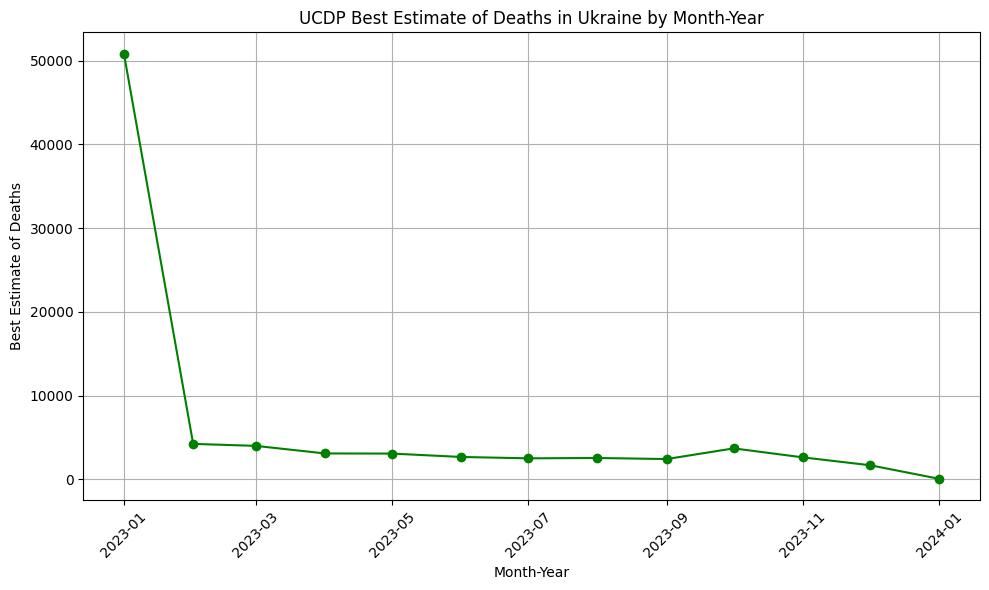

In [ ]:
# selected_state_number = 369
# selected_country="Ukraine"
# df_yearly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/23.01.23.12/", 100,selected_state_number, selected_country)
# print(df_yearly)

# df_monthly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/24.0.2/", 100,selected_state_number, selected_country)
# print(df_monthly)

# monthly_df = pd.read_csv(f'/content/{df_yearly}')
# yearly_df = pd.read_csv(f'/content/{df_yearly}')

# # Convert 'date_start' in monthly_df to datetime to facilitate extraction
# monthly_df['date_start'] = pd.to_datetime(monthly_df['date_start'])

# # Extract January 2024 records
# jan_2024_records = monthly_df[monthly_df['date_start'].dt.strftime('%Y-%m') == '2024-01']

# # Append the January 2024 records to the yearly dataframe
# yearly_df_updated = pd.concat([yearly_df, jan_2024_records], ignore_index=True)


# country=df_yearly.split("_")[0]
# output_filepath = f'/content/{country}_ucdp_merged.csv'
# yearly_df_updated.to_csv(output_filepath, index=False)

# monthly_deaths_csv = pd.read_csv(f"{ucdp_newfile}_grouped.csv")

monthly_deaths_csv = pd.read_csv("/content/UCDP_2023-01-01-2024-01-31.csv")
monthly_deaths_csv = monthly_deaths_csv[monthly_deaths_csv['country'] == 'Ukraine']

monthly_deaths_csv['date_start'] = pd.to_datetime(monthly_deaths_csv['date_start'])

# Extract 'month' and 'year' from 'event_date'
monthly_deaths_csv['month'] = monthly_deaths_csv['date_start'].dt.month
monthly_deaths_csv['year'] = monthly_deaths_csv['date_start'].dt.year

# Group by 'month' and 'year', then sum 'deaths'
deaths_grouped = monthly_deaths_csv.groupby(['month', 'year'])['best_deaths'].sum().reset_index()

deaths_grouped['date'] = pd.to_datetime(deaths_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
deaths_grouped_sorted = deaths_grouped.sort_values('date')
deaths_grouped_sorted

# Convert 'date_start' in monthly_df to datetime to facilitate extraction
# monthly_deaths_csv ['date_start'] = pd.to_datetime(monthly_deaths_csv ['date_start'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(deaths_grouped_sorted ['date'], deaths_grouped_sorted ['best_deaths'], marker='o', linestyle='-', color='green')
plt.title('UCDP Best Estimate of Deaths in Ukraine by Month-Year')
plt.xlabel('Month-Year')
plt.ylabel('Best Estimate of Deaths')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

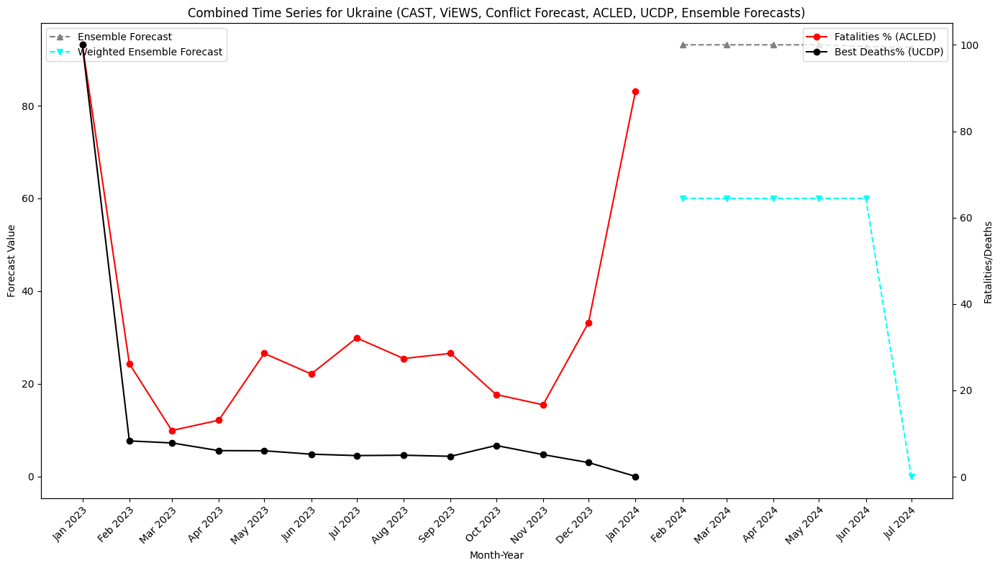

In [ ]:
# # 1) CAST
# # acled_df = pd.read_csv('/content/mozam_acled_data_download_2024_03_grouped.csv')
# acled_df = pd.read_csv(f"/content/{country}_cast_grouped.csv")
# acled_df['month_year'] = pd.to_datetime(acled_df['month'] + ' ' + acled_df['year'].astype(str))
# acled_df_sorted = acled_df.sort_values(by='month_year')
# observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]
# forecast = acled_df_sorted[acled_df_sorted['total_observed'] == 0]
# first_zero_observed_month = acled_df_sorted[acled_df_sorted['total_observed'] == 0]['month_year'].min()
# one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)
# df_filtered_observed = acled_df_sorted[acled_df_sorted['total_observed'] != 0]

# # 2) ViEWS Data
# # views_df = pd.read_csv('/content/MOZ_sb_views_data_download_2024_03.csv')
# views_df = pd.read_csv(f'/content/{viewsdf}')
# views_df['date'] = pd.to_datetime(views_df[['year', 'month']].assign(DAY=1))
# views_df = views_df[views_df['date'] <= '2024-08-01']

# # 3) Conflict Forecast
# # conflict_forecast_df = pd.read_csv('/content/MOZ_conflictforecast_data_download_2024_03.csv')
# conflict_forecast_df = pd.read_csv(f'/content/{cf_df}')
# data = conflict_forecast_df

# # Convert 'year' and 'month' into a datetime format to find the latest month
# data['date'] = pd.to_datetime(data.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))

# # Identify the row with the latest date
# latest_row = data[data['date'] == data['date'].max()]

# # Extract values to be duplicated into the upcoming months
# latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()

# # Create new rows for the next 12 months with the same values
# new_rows = []
# for m in range(1, 8):
#     new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
#     new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
#     new_row = latest_values.copy()
#     new_row.update({'year': new_year, 'month': new_month})
#     new_rows.append(new_row)

# # Convert the list of dictionaries to a DataFrame and append it to the original DataFrame
# new_rows_df = pd.DataFrame(new_rows)
# extended_data = pd.concat([data, new_rows_df], ignore_index=True)

# # Optional: Remove the 'date' column if no longer needed, or update it with correct dates
# extended_data.drop('date', axis=1, inplace=True)
# data_combined = extended_data

# # Assuming 'data_combined' is your DataFrame with original and extended data
# data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])

# # Find the index where the extended data starts
# extended_start_index = len(data)  # 'data' is the original dataset before adding the 12 months

# # 4) ACLED
# data = pd.read_csv(f'/content/ACLED_2023-01-01-2024-01-31.csv')
# fatalities_df = data[data['country'] == 'Ukraine']

# fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# # Extract 'month' and 'year' from 'event_date'
# fatalities_df['month'] = fatalities_df['event_date'].dt.month
# fatalities_df['year'] = fatalities_df['event_date'].dt.year

# # Group by 'month' and 'year', then sum 'fatalities'
# fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

# fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# # Sorting the dataframe by 'date' just in case
# data_sorted = fatalities_grouped.sort_values('date')

# # 5) UCDP
# monthly_deaths_csv = pd.read_csv("/content/UCDP_2023-01-01-2024-01-31.csv")
# monthly_deaths_csv = monthly_deaths_csv[monthly_deaths_csv['country'] == 'Ukraine']

# monthly_deaths_csv['date_start'] = pd.to_datetime(monthly_deaths_csv['date_start'])

# # Extract 'month' and 'year' from 'event_date'
# monthly_deaths_csv['month'] = monthly_deaths_csv['date_start'].dt.month
# monthly_deaths_csv['year'] = monthly_deaths_csv['date_start'].dt.year

# # Group by 'month' and 'year', then sum 'deaths'
# monthly_deaths_csv = monthly_deaths_csv.groupby(['month', 'year'])['best_deaths'].sum().reset_index()

# monthly_deaths_csv['date'] = pd.to_datetime(deaths_grouped.assign(day=1)[['year', 'month', 'day']])

# # Sorting the dataframe by 'date' just in case
# monthly_deaths_csv= deaths_grouped.sort_values('date')

#ACLED Scaled
# Load and filter ACLED data
acled_data = pd.read_csv(f'/content/ACLED_2023-01-01-2024-01-31.csv')
acled_data_ukraine = acled_data[acled_data['country'] == 'Ukraine']

fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# Extract 'month' and 'year' from 'event_date'
fatalities_df['month'] = fatalities_df['event_date'].dt.month
fatalities_df['year'] = fatalities_df['event_date'].dt.year

# Group by 'month' and 'year', then sum 'fatalities'
fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')

# Scale ACLED fatalities to percentages
max_fatalities_acled = fatalities_grouped_sorted['fatalities'].max()
fatalities_grouped_sorted['fatalities_percentage'] = (fatalities_grouped_sorted['fatalities'] / max_fatalities_acled) * 100

#UCDP Scaled

# Load and filter UCDP data
ucdp_data = pd.read_csv("/content/UCDP_2023-01-01-2024-01-31.csv")
monthly_deaths_csv= ucdp_data[ucdp_data['country'] == 'Ukraine']

monthly_deaths_csv['date_start'] = pd.to_datetime(monthly_deaths_csv['date_start'])

# Extract 'month' and 'year' from 'event_date'
monthly_deaths_csv['month'] = monthly_deaths_csv['date_start'].dt.month
monthly_deaths_csv['year'] = monthly_deaths_csv['date_start'].dt.year

# Group by 'month' and 'year', then sum 'deaths'
deaths_grouped = monthly_deaths_csv.groupby(['month', 'year'])['best_deaths'].sum().reset_index()

deaths_grouped['date'] = pd.to_datetime(deaths_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
deaths_grouped_sorted = deaths_grouped.sort_values('date')

# Scale UCDP deaths to percentages
max_deaths_ucdp = deaths_grouped_sorted['best_deaths'].max()
deaths_grouped_sorted['deaths_percentage'] = (deaths_grouped_sorted['best_deaths'] / max_deaths_ucdp) * 100


# 6) Simple and Weighted Ensemble Forecast
ensemble_data = pd.read_csv("/content/simpleandweightedforecast_2april.csv")
ensemble_data['date'] = pd.to_datetime(ensemble_data[['year', 'month']].assign(DAY=1))
ensemble_data = ensemble_data[ensemble_data['C-name(GeoB)'] == 'Ukraine']


ensemble_data['ensemble_forecast'] *= 100
ensemble_data['weighted_ensemble_forecast'] *= 100

plt.figure(figsize=(14, 8))

ax1 = plt.gca()  # primary axis for Forecast Value
ax2 = ax1.twinx()  # secondary axis for Fatalities/Deaths

# Plot CAST, ViEWS, and Conflict Forecast data on Primary Axis
# ax1.plot(acled_df_sorted['month_year'], acled_df_sorted['total_forecast'], marker='o', label='Total Forecast (CAST)', color='green', linestyle='-')
# ax1.plot(acled_df_sorted['month_year'], acled_df_sorted['total_observed'], marker='o', label='Total Observed (CAST)', color='orange', linestyle='-')
# ax1.plot(views_df['date'], views_df['main_mean'], label='Main Mean (ViEWS)', marker='o', linestyle='--', color='purple')
# ax1.plot(data_combined['date'], data_combined['anyviolence_best_model'], label='Any Violence (Conflict Forecast)', marker='o', color='blue', linestyle='--')

# Plot Ensemble Forecasts on Primary Axis
ax1.plot(ensemble_data['date'], ensemble_data['ensemble_forecast'], label='Ensemble Forecast', linestyle='--', color='grey', marker='^')
ax1.plot(ensemble_data['date'], ensemble_data['weighted_ensemble_forecast'], label='Weighted Ensemble Forecast', linestyle='--', color='cyan', marker='v')

# Plot ACLED and UCDP data on Secondary Axis
ax2.plot(fatalities_grouped_sorted['date'], fatalities_grouped_sorted['fatalities_percentage'], marker='o', label='Fatalities % (ACLED)', linestyle='-', color='red')
ax2.plot(deaths_grouped_sorted['date'], deaths_grouped_sorted['deaths_percentage'], marker='o', label='Best Deaths% (UCDP)', linestyle='-', color='black')

# Formatting Primary Axis
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Forecast Value')
ax1.tick_params(axis='y')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Formatting Secondary Axis
ax2.set_ylabel('Fatalities/Deaths')
ax2.tick_params(axis='y')

# Handling Legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines, labels, loc='upper left')
ax2.legend(lines2, labels2, loc='upper right')

ax1.set_title('Combined Time Series for Ukraine (CAST, ViEWS, Conflict Forecast, ACLED, UCDP, Ensemble Forecasts)')

plt.tight_layout()
plt.show()

Older Charts

In [ ]:
file_path = '/content/2020-12-01-2021-12-31-Ukraine-ACLED.csv'
data = pd.read_csv(file_path)

grouped_data = data.groupby('event_date').agg({
    'time_precision': 'mean',
    'geo_precision': 'mean',
    'fatalities': 'sum'
}).reset_index()

# Counting the event types per date
event_type_counts_per_date = data.pivot_table(index='event_date', columns='event_type', aggfunc='size', fill_value=0)

# Merging the two DataFrames
final_per_date_df = pd.merge(grouped_data, event_type_counts_per_date, on='event_date')

# Save to CSV
output_path_per_date = '/content/2020-12-01-2021-12-31-Ukraine-ACLED_aggregated_per_date.csv'
final_per_date_df.to_csv(output_path_per_date, index=False)

final_per_date_df.head(), output_path_per_date

(  event_date  time_precision  geo_precision  fatalities  Battles  \
 0  01-Apr-21             1.0       1.870968           0       10   
 1  01-Aug-21             1.0       2.000000           0        5   
 2  01-Dec-20             1.0       1.550000           2        5   
 3  01-Dec-21             1.0       1.760000           1        8   
 4  01-Feb-21             1.0       1.916667           0        4   
 
    Explosions/Remote violence  Protests  Riots  Strategic developments  \
 0                          17         4      0                       0   
 1                           3         0      0                       0   
 2                           5         9      1                       0   
 3                          11         6      0                       0   
 4                           7         1      0                       0   
 
    Violence against civilians  
 0                           0  
 1                           0  
 2                           0  


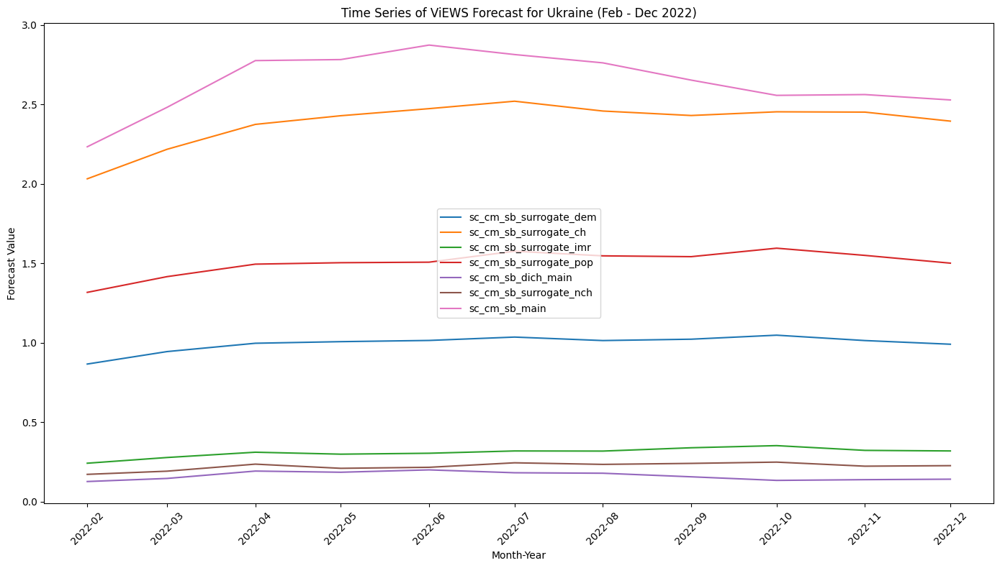

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = '/content/UKR_sb_views_data_download_2024_03.csv'  # Make sure to update this path to your actual file location
data = pd.read_csv(file_path)


# Creating a 'date' column for easier plotting of time series
data['date'] = pd.to_datetime(data[['year', 'month']].assign(DAY=1))

data = data[data['date'] <= '2022-12-01']
# print(data)

# Selecting the relevant columns for the plot
columns_to_plot = [
    # 'main_mean','main_dich',
    # 'surrogate_mean_ch',
    #  'surrogate_mean_dem',
    # 'surrogate_mean_nch',
    # 'surrogate_mean_imr',
    # 'surrogate_mean_pop'

    'sc_cm_sb_surrogate_dem',
'sc_cm_sb_surrogate_ch',
'sc_cm_sb_surrogate_imr',
'sc_cm_sb_surrogate_pop',
'sc_cm_sb_dich_main',
'sc_cm_sb_surrogate_nch',
'sc_cm_sb_main'
]



# Conflict history (surrogate_mean_ch)
# Infant mortality rate (surrogate_mean_imr)
# Neighbourhood conflict history (surrogate_mean_nch)
# Population size (surrogate_mean_pop)
# Liberal democracy index (surrogate_mean_dem)

# main_mean: Predicted Number of Fatalities
# main_dich: Predicted Probability of Conflict
# surrogate_mean_ch: Predicted Fatalities, Isolated Contribution from Conflict History Features
# surrogate_mean_pop: Predicted Fatalities, Isolated Contribution from Population Size Feature
# surrogate_mean_imr: Predicted fatalities, isolated contribution from infant mortality rate
# surrogate_mean_nch: Predicted fatalities, isolated contribution from neighborhood conflict history

# Plotting
plt.figure(figsize=(14, 8))
for col in columns_to_plot:
    plt.plot(data['date'], data[col], label=col)

# plt.title('Time Series of ViEWS Forecast for Mozambique (January - August 2024)')
plt.title('Time Series of ViEWS Forecast for Ukraine (Feb - Dec 2022)')
plt.xlabel('Month-Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


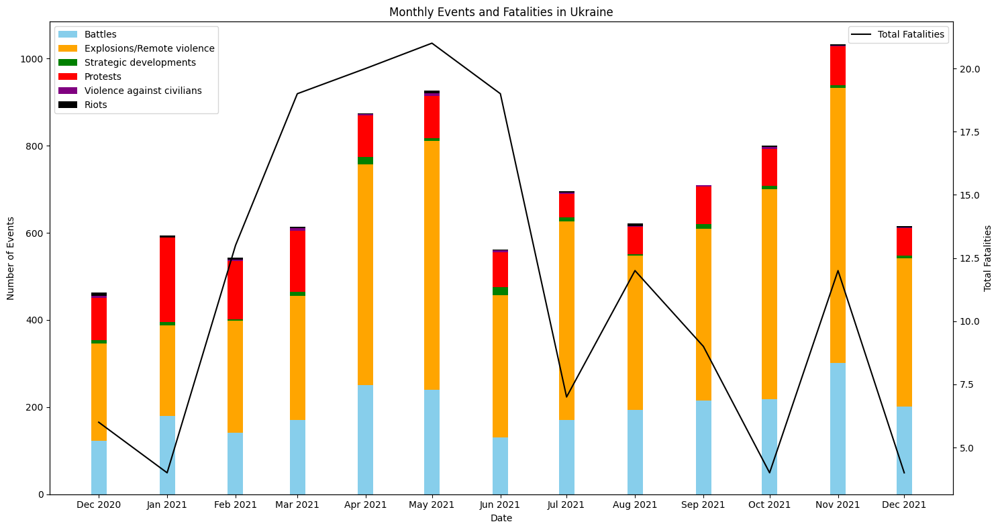

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Load the previously saved per-date aggregated data for Ukraine
file_path_per_date = '/content/2020-12-01-2021-12-31-Ukraine-ACLED_aggregated_per_date.csv'
ukraine_data_per_date = pd.read_csv(file_path_per_date)

# Convert 'event_date' to datetime format
ukraine_data_per_date['event_date'] = pd.to_datetime(ukraine_data_per_date['event_date'])

# Resample the data by month and sum up the event types and fatalities
ukraine_data_per_month = ukraine_data_per_date.set_index('event_date').resample('M').agg({
    'fatalities': 'sum',
    'Battles': 'sum',
    'Explosions/Remote violence': 'sum',
    'Strategic developments': 'sum',
    'Protests': 'sum',
    'Violence against civilians': 'sum',
    'Riots':'sum',
    'time_precision': 'mean',
    'geo_precision': 'mean',

}).reset_index()
ukraine_data_per_month.to_csv("2020-12-01-2021-12-31-Ukraine-ACLED_aggregated_per_month.csv", index=False)
# Set 'event_date' as the index for plotting
ukraine_data_per_month['event_date'] = ukraine_data_per_month['event_date'].apply(lambda dt: dt.replace(day=1))
ukraine_data_per_month.set_index('event_date', inplace=True)
# ukraine_data_per_month
# Define the color for each event type
colors = ['skyblue', 'orange', 'green', 'red', 'purple','black']

# Start plotting the stacked bar chart
fig, ax1 = plt.subplots(figsize=(15, 8))

# Plotting the stacked bars for each event type
bottom = np.zeros(len(ukraine_data_per_month))
for idx, column in enumerate(['Battles', 'Explosions/Remote violence', 'Strategic developments', 'Protests', 'Violence against civilians','Riots']):
    ax1.bar(ukraine_data_per_month.index, ukraine_data_per_month[column], bottom=bottom, color=colors[idx], label=column, width=7)
    bottom += ukraine_data_per_month[column].values

# Plotting the line for total fatalities on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(ukraine_data_per_month.index, ukraine_data_per_month['fatalities'], color='black', label='Total Fatalities')

# Formatting the plot

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Events')
ax2.set_ylabel('Total Fatalities')
ax1.set_title('Monthly Events and Fatalities in Ukraine')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Format the x-axis to show month and year
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


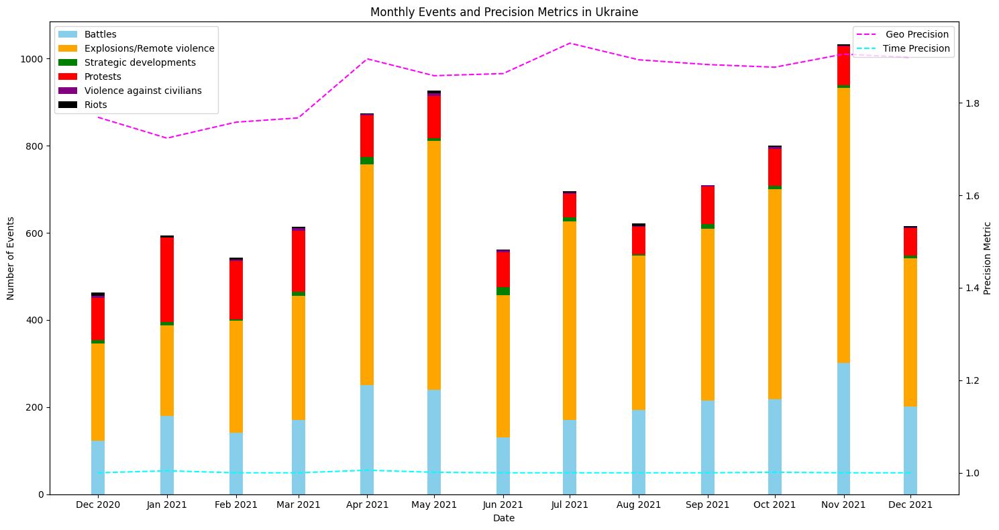

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Load the previously saved per-month aggregated data for Mozambique
file_path_per_month = '/content/2020-12-01-2021-12-31-Ukraine-ACLED_aggregated_per_month.csv'
mozambique_data_per_month = pd.read_csv(file_path_per_month)

# Convert 'event_date' to datetime format
mozambique_data_per_month['event_date'] = pd.to_datetime(mozambique_data_per_month['event_date'])

# Set 'event_date' as the index for plotting
mozambique_data_per_month['event_date'] = mozambique_data_per_month['event_date'].apply(lambda dt: dt.replace(day=1))
mozambique_data_per_month.set_index('event_date', inplace=True)

# numeric_columns = mozambique_data_per_month.select_dtypes(include=[np.number]).columns
# numeric_columns[6:]
# mozambique_data_per_month[numeric_columns] = mozambique_data_per_month[numeric_columns].pct_change().fillna(0) * 100


# Start plotting
fig, ax1 = plt.subplots(figsize=(15, 8))

# Plotting the bars for each event type
event_types = ['Battles', 'Explosions/Remote violence', 'Strategic developments', 'Protests', 'Violence against civilians','Riots']
colors = ['skyblue', 'orange', 'green', 'red', 'purple','black'] # Define colors for each event type
width = 20  # Define the width of the bars

# for idx, event_type in enumerate(event_types):
#     ax1.bar(mozambique_data_per_month.index, mozambique_data_per_month[event_type], width=width,
#             color=colors[idx], label=event_type)

# Plotting the stacked bars for each event type
bottom = np.zeros(len(mozambique_data_per_month))
for idx, column in enumerate(['Battles', 'Explosions/Remote violence', 'Strategic developments', 'Protests', 'Violence against civilians','Riots']):
    ax1.bar(mozambique_data_per_month.index, mozambique_data_per_month[column], bottom=bottom, color=colors[idx], label=column, width=6)
    bottom += mozambique_data_per_month[column].values

# Plot the precision metrics on the secondary y-axis
ax2 = ax1.twinx()
ax2.plot(mozambique_data_per_month.index, mozambique_data_per_month['geo_precision'],
         color='magenta', linestyle='--', label=' Geo Precision')
ax2.plot(mozambique_data_per_month.index, mozambique_data_per_month['time_precision'],
         color='cyan', linestyle='--', label='Time Precision')

# Formatting the plot
ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Events')
ax2.set_ylabel('Precision Metric')
ax1.set_title('Monthly Events and Geo Precision Metrics in Ukraine')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Format the x-axis to show month and year
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

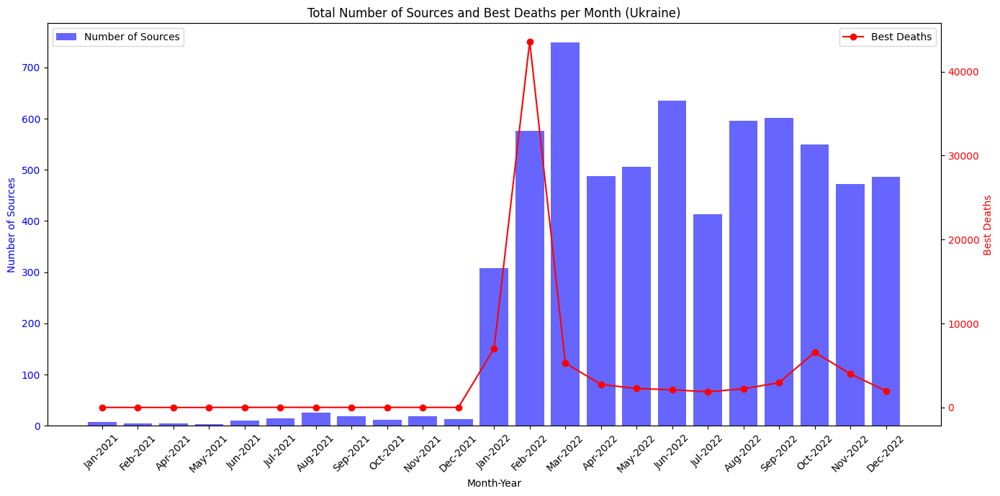

In [ ]:
file_path = '/content/ukraine_GED_filtered.csv'
df = pd.read_csv(file_path)

df['date_start'] = pd.to_datetime(df['date_start'])
df['month_year'] = df['date_start'].dt.to_period('M')

grouped_summary_df = df.groupby('month_year').agg({
    'number_of_sources': 'sum',
    'best_deaths': 'sum'
}).reset_index()

grouped_summary_df['month_year_str'] = grouped_summary_df['month_year'].dt.strftime('%b-%Y')

fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot number_of_sources
ax1.bar(grouped_summary_df['month_year_str'], grouped_summary_df['number_of_sources'], color='blue', alpha=0.6, label='Number of Sources')
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Number of Sources', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_xticklabels(grouped_summary_df['month_year_str'], rotation=45)

# Create another y-axis for best_deaths
ax2 = ax1.twinx()
ax2.plot(grouped_summary_df['month_year_str'], grouped_summary_df['best_deaths'], color='red', label='Best Deaths', marker='o')
ax2.set_ylabel('Best Deaths', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Total Number of Sources and Best Deaths per Month (Ukraine)')
plt.tight_layout()

plt.show()

## 3) Palestine

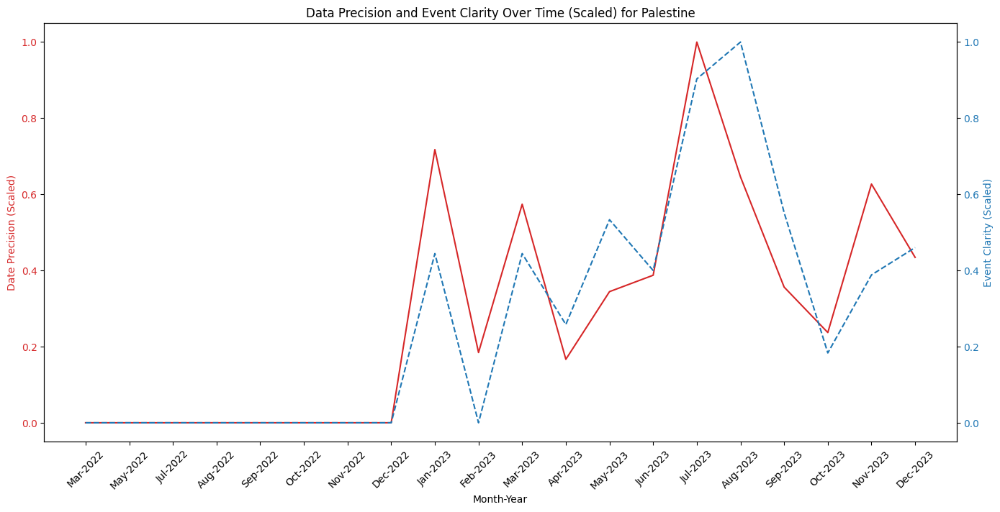

In [ ]:
#e summarize the dataset to get averages of date_prec and event_clarity per month_year
# (treating date_prec as a proxy for both time precision and data precision here for simplicity).
summary_df = df.groupby('month_year').agg({
    'date_prec': 'mean',  # Average time precision
    'event_clarity': 'mean',  # Average event precision
}).reset_index()

# Normalize date_prec and event_clarity to be on a similar scale for visualization purposes
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Scale the data
scaled_data = scaler.fit_transform(summary_df[['date_prec', 'event_clarity']])
scaled_df = pd.DataFrame(scaled_data, columns=['date_prec_scaled', 'event_clarity_scaled'])

# Merge scaled data back with the summary_df
summary_df = pd.concat([summary_df, scaled_df], axis=1)

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7))

# Primary axis for date_prec (time/data precision)
color = 'tab:red'
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Date Precision (Scaled)', color=color)
ax1.plot(summary_df['month_year'].dt.strftime('%b-%Y'), summary_df['date_prec_scaled'], color=color, label='Date Precision (Scaled)')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(summary_df['month_year'].dt.strftime('%b-%Y'), rotation=45)

# Secondary axis for event_clarity (event precision)
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Event Clarity (Scaled)', color=color)
ax2.plot(summary_df['month_year'].dt.strftime('%b-%Y'), summary_df['event_clarity_scaled'], color=color, linestyle='--', label='Event Clarity (Scaled)')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Data Precision and Event Clarity Over Time (Scaled) for Palestine')
plt.show()

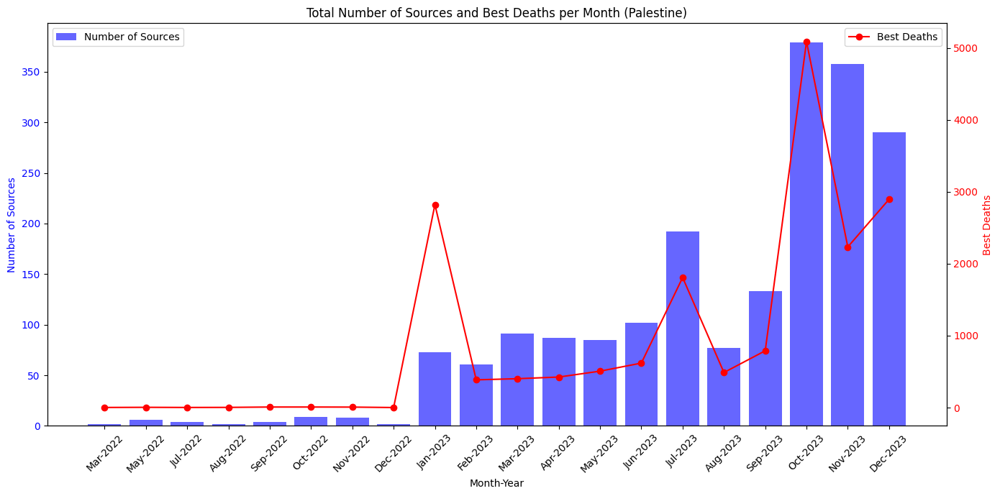

In [ ]:
file_path = '/content/palestine_UCDP_filtered.csv'
df = pd.read_csv(file_path)

df['date_start'] = pd.to_datetime(df['date_start'])
df['month_year'] = df['date_start'].dt.to_period('M')

grouped_summary_df = df.groupby('month_year').agg({
    'number_of_sources': 'sum',
    'best_deaths': 'sum'
}).reset_index()

grouped_summary_df['month_year_str'] = grouped_summary_df['month_year'].dt.strftime('%b-%Y')

fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot number_of_sources
ax1.bar(grouped_summary_df['month_year_str'], grouped_summary_df['number_of_sources'], color='blue', alpha=0.6, label='Number of Sources')
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Number of Sources', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_xticklabels(grouped_summary_df['month_year_str'], rotation=45)

# Create another y-axis for best_deaths
ax2 = ax1.twinx()
ax2.plot(grouped_summary_df['month_year_str'], grouped_summary_df['best_deaths'], color='red', label='Best Deaths', marker='o')
ax2.set_ylabel('Best Deaths', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Total Number of Sources and Best Deaths per Month (Palestine)')
plt.tight_layout()

plt.show()

In [ ]:
country="Palestine"
cast_data=get_cast_grouped(f"https://api.acleddata.com/cast/read?key=OcojFgHon56QHFtjOS9z&email=zakhtar@alumni.cmu.edu&country={country}")
print(cast_data)

      country      admin1      month  year total_forecast battles_forecast  \
0   Palestine   West Bank   December  2023            373              204   
1   Palestine   West Bank      April  2023            115               72   
2   Palestine   West Bank        May  2023            107               59   
3   Palestine   West Bank       June  2023             89               50   
4   Palestine   West Bank       July  2023            115               89   
5   Palestine   West Bank     August  2023            143               85   
6   Palestine   West Bank  September  2023            122               84   
7   Palestine   West Bank    October  2023            131               90   
8   Palestine   West Bank   November  2023            420              188   
9   Palestine   West Bank      March  2023             89               59   
10  Palestine   West Bank    January  2024            316              194   
11  Palestine   West Bank   February  2024            262       

In [ ]:
df = pd.read_csv(f'/content/{country}_cast.csv')
df = df.groupby(['country', 'month', 'year'])['total_forecast','total_observed'].sum().reset_index()
df.to_csv(f"/content/{country}_cast_grouped.csv", index=False)

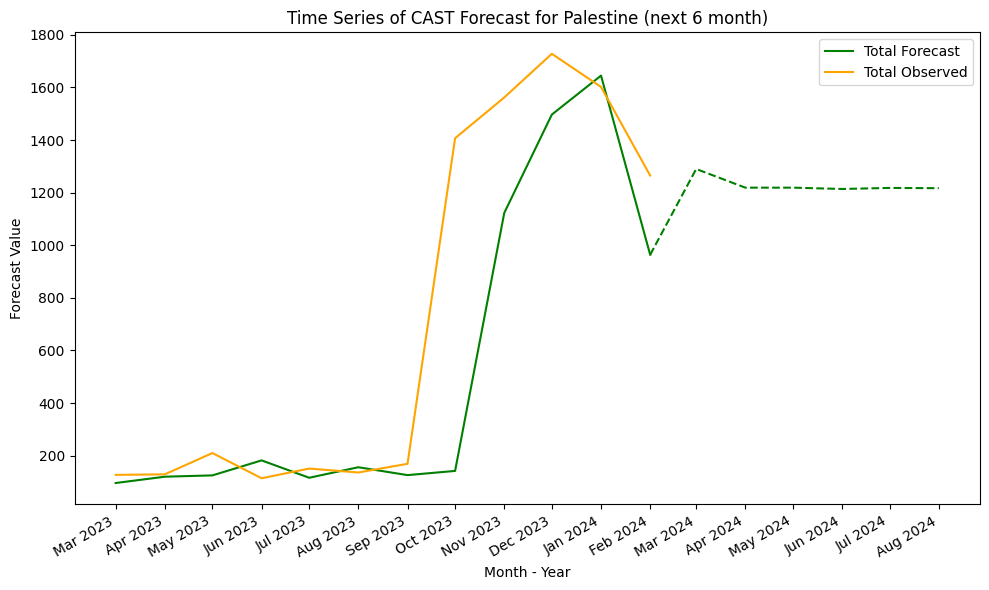

In [ ]:
df = pd.read_csv(f"/content/{country}_cast_grouped.csv")

# Create a combined 'month_year' column for plotting
df['month_year'] = pd.to_datetime(df['month'] + ' ' + df['year'].astype(str))

# Sort by 'month_year' to ensure chronological order
df_sorted = df.sort_values(by='month_year')

# Split the data into observed (solid line) and forecast (dashed line)
observed = df_sorted[df_sorted['total_observed'] != 0]
forecast = df_sorted[df_sorted['total_observed'] == 0]


# Identify the first month with a zero in total observed to use as the cutoff for changing the line style
first_zero_observed_month = df_sorted[df_sorted['total_observed'] == 0]['month_year'].min()
one_month_before_first_zero = first_zero_observed_month - pd.DateOffset(months=1)

# Filter out zeros from total observed before plotting to avoid dropping to 0
df_filtered_observed = df_sorted[df_sorted['total_observed'] != 0]

plt.figure(figsize=(10, 6))

# Plot total forecast data up to the first zero observed month as solid
before_first_zero_forecast = df_sorted[df_sorted['month_year'] < first_zero_observed_month]
plt.plot(before_first_zero_forecast['month_year'], before_first_zero_forecast['total_forecast'], label='Total Forecast', color='green', linestyle='-')

# Plot total forecast data from the first zero observed month onward as dashed
after_first_zero_forecast = df_sorted[df_sorted['month_year'] >= one_month_before_first_zero]
plt.plot(after_first_zero_forecast['month_year'], after_first_zero_forecast['total_forecast'], color='green', linestyle='--')

# Plot total observed data without zeros
plt.plot(df_filtered_observed['month_year'], df_filtered_observed['total_observed'], label='Total Observed', color='orange', linestyle='-')

# Formatting the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate() # Rotation

plt.title('Time Series of CAST Forecast for Palestine (next 6 month)')
plt.xlabel('Month - Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.tight_layout()

plt.show()

In [ ]:
cf_df= get_conflictforecast("https://api.backendless.com/C177D0DC-B3D5-818C-FF1E-1CC11BC69600/C5F2917E-C2F6-4F7D-9063-69555274134E/services/fileService/get-file-listing?date=01-2024","PSE")
cf_df

      isocode  year  month  anyviolence_best_model
22126     PSE  2023      1               89.489807
22127     PSE  2023      2               90.000542
22128     PSE  2023      3               89.568565
22129     PSE  2023      4               90.080093
22130     PSE  2023      5               90.722031
22131     PSE  2023      6               90.483177
22132     PSE  2023      7               90.088135
22133     PSE  2023      8               89.864891
22134     PSE  2023      9               90.242905
22135     PSE  2023     10               89.849838
22136     PSE  2023     11               89.352043
22137     PSE  2023     12               89.905022
22138     PSE  2024      1               89.420784
      isocode  year  month  armedconf_best_model
22126     PSE  2023      1             85.581947
22127     PSE  2023      2             86.260048
22128     PSE  2023      3             86.104362
22129     PSE  2023      4             86.299797
22130     PSE  2023      5             87

'PSE_conflictforecast.csv'

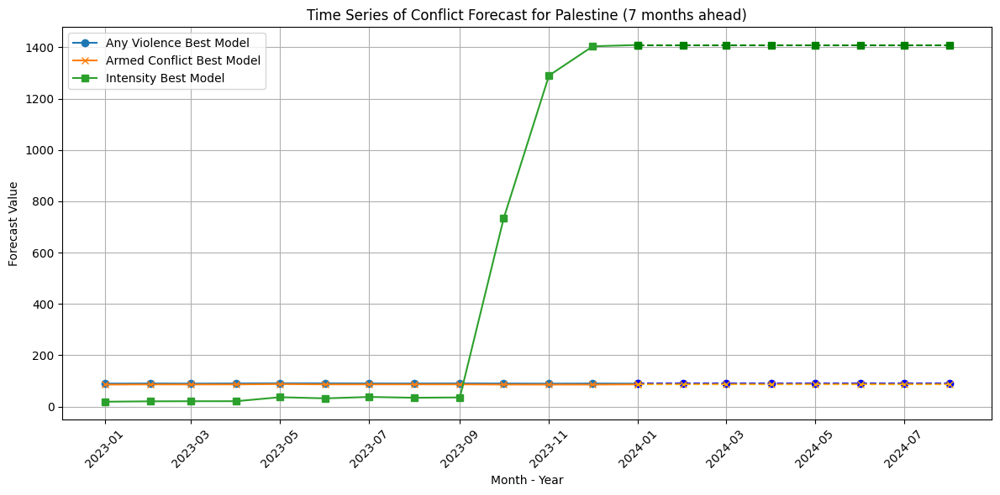

In [ ]:
file_path = f'/content/{cf_df}'
data = pd.read_csv(file_path)

# Convert 'year' and 'month' into a datetime format to find the latest month
data['date'] = pd.to_datetime(data.assign(day=1)[['year', 'month']].astype(str).agg('-'.join, axis=1))

# Identify the row with the latest date
latest_row = data[data['date'] == data['date'].max()]

# Extract values to be duplicated into the upcoming months
latest_values = latest_row[['isocode', 'anyviolence_best_model', 'armedconf_best_model', 'intensity_best_model']].iloc[0].to_dict()

# Create new rows for the next 12 months with the same values
new_rows = []
for m in range(1, 8):
    new_month = (latest_row['date'] + pd.DateOffset(months=m)).dt.month.iloc[0]
    new_year = (latest_row['date'] + pd.DateOffset(months=m)).dt.year.iloc[0]
    new_row = latest_values.copy()
    new_row.update({'year': new_year, 'month': new_month})
    new_rows.append(new_row)

# Convert the list of dictionaries to a DataFrame and append it to the original DataFrame
new_rows_df = pd.DataFrame(new_rows)
extended_data = pd.concat([data, new_rows_df], ignore_index=True)

# Optional: Remove the 'date' column if no longer needed, or update it with correct dates
extended_data.drop('date', axis=1, inplace=True)
data_combined = extended_data

# Assuming 'data_combined' is your DataFrame with original and extended data
data_combined['date'] = pd.to_datetime(data_combined.assign(day=1)[['year', 'month', 'day']])

# Find the index where the extended data starts
extended_start_index = len(data)  # 'data' is the original dataset before adding the 12 months

# Plotting
plt.figure(figsize=(12, 6))

# Plot for Any Violence Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['anyviolence_best_model'][:extended_start_index], label='Any Violence Best Model', marker='o')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['anyviolence_best_model'][extended_start_index-1:], label='_nolegend_', marker='o', linestyle='--', color='blue')

# Plot for Armed Conflict Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['armedconf_best_model'][:extended_start_index], label='Armed Conflict Best Model', marker='x')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['armedconf_best_model'][extended_start_index-1:], label='_nolegend_', marker='x', linestyle='--', color='orange')

# Plot for Intensity Best Model
plt.plot(data_combined['date'][:extended_start_index], data_combined['intensity_best_model'][:extended_start_index], label='Intensity Best Model', marker='s')
plt.plot(data_combined['date'][extended_start_index-1:], data_combined['intensity_best_model'][extended_start_index-1:], label='_nolegend_', marker='s', linestyle='--', color='green')

plt.title('Time Series of Conflict Forecast for Palestine (7 months ahead)')
plt.xlabel('Month - Year')
plt.ylabel('Forecast Value')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

Data for Palestine from 2023-03-01 to 2024-03-30 has been saved to Palestine_acled_2023-03-01_to_2024-03-30.csv


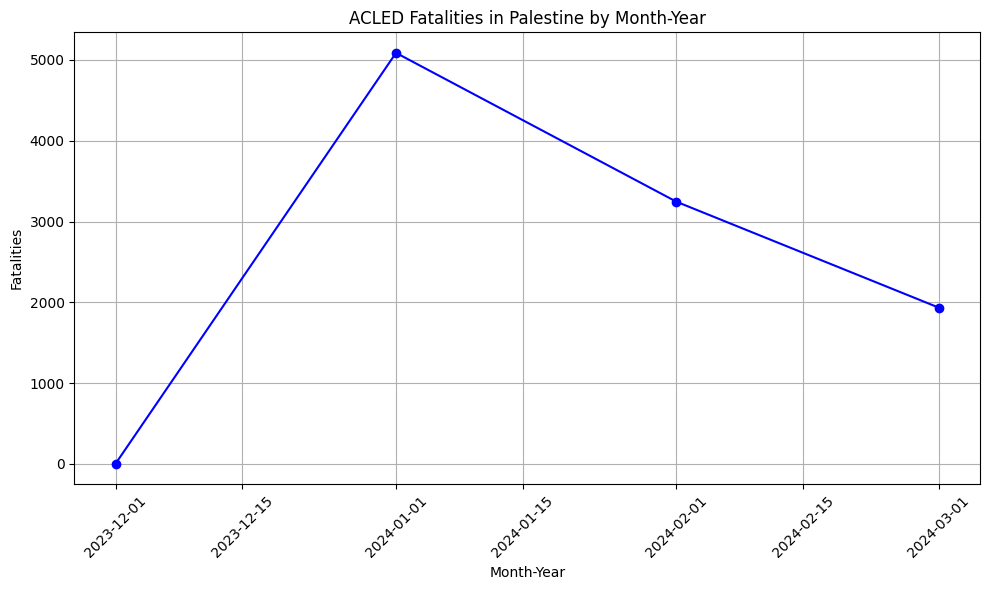

In [ ]:
acled_df= download_acled_country('2023-03-01', '2024-03-30', 'Palestine')
data = pd.read_csv(f'/content/{acled_df}')

grouped_data = data.groupby('event_date').agg({
    'time_precision': 'mean',
    'geo_precision': 'mean',
    'fatalities': 'sum'
}).reset_index()

# Counting the event types per date
event_type_counts_per_date = data.pivot_table(index='event_date', columns='event_type', aggfunc='size', fill_value=0)

# Merging the two DataFrames
final_per_date_df = pd.merge(grouped_data, event_type_counts_per_date, on='event_date')

# Save to CSV
file=acled_df.split(".csv")[0]
output_path_per_date = f'/content/{file}_aggregated.csv'
final_per_date_df.to_csv(output_path_per_date, index=False)

fatalities_df = pd.read_csv(output_path_per_date)

fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# Extract 'month' and 'year' from 'event_date'
fatalities_df['month'] = fatalities_df['event_date'].dt.month
fatalities_df['year'] = fatalities_df['event_date'].dt.year

# Group by 'month' and 'year', then sum 'fatalities'
fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')
filenamenew=output_path_per_date.split(".csv")[0]
fatalities_grouped_sorted.to_csv(f"{filenamenew}_grouped.csv", index=False)

fatalities_df = pd.read_csv(output_path_per_date)

fatalities_df['event_date'] = pd.to_datetime(fatalities_df['event_date'])

# Extract 'month' and 'year' from 'event_date'
fatalities_df['month'] = fatalities_df['event_date'].dt.month
fatalities_df['year'] = fatalities_df['event_date'].dt.year

# Group by 'month' and 'year', then sum 'fatalities'
fatalities_grouped = fatalities_df.groupby(['month', 'year'])['fatalities'].sum().reset_index()

fatalities_grouped['date'] = pd.to_datetime(fatalities_grouped.assign(day=1)[['year', 'month', 'day']])

# Sorting the dataframe by 'date' just in case
fatalities_grouped_sorted = fatalities_grouped.sort_values('date')
filenamenew=output_path_per_date.split(".csv")[0]
fatalities_grouped_sorted.to_csv(f"{filenamenew}_grouped.csv", index=False)


fatalities_grouped_sortedf = pd.read_csv(f"{filenamenew}_grouped.csv")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(fatalities_grouped_sorted['date'], fatalities_grouped_sorted['fatalities'], marker='o', linestyle='-', color='blue')
plt.title('ACLED Fatalities in Palestine by Month-Year')
plt.xlabel('Month-Year')
plt.ylabel('Fatalities')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
df_yearly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/23.01.23.12/", 100,selected_state_number, selected_country)
print(df_yearly)

df_monthly = fetch_ucdp_country("https://ucdpapi.pcr.uu.se/api/gedevents/24.0.2/", 100,selected_state_number, selected_country)
print(df_monthly)

Weighted Ensemble Foreacating Metric

In [ ]:
#Aggregate UCDP to month-year and sum best_deaths and mean of type_of_violence

In [ ]:
#Aggregate ACLED to month-year and sum